## Market-Mix-Modelling: Budget_Optimization
### Objective
ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. To enhance their revenues, over the past one year, they had done a significant investing in their marketing efforts. They are about to create a marketing budget for the upcoming year, which will include TV commercials, online campaigns, price optimizations, promotional strategies, etc. They want to relocate their budget optimally across different marketing levers to improve the revenue response using Market Mix Modelling.

The objective of this project is to create a market mix model for 3 product sub-categories - Camera accessory, Gaming accessory and Home Audio - to observe the actual impact of various marketing variables over one year (July 2015 to June 2016) and recommend the optimal budget allocation for different marketing levers for the next year.

In [27]:
import warnings
warnings.filterwarnings('ignore')

#importing the libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

# Set iPython's max column width to 100
pd.set_option('display.max_columns', 100)

# Reading and Understanding of Datasets

## Understanding Consumer Data

In [28]:
# Reading the File
consumer = pd.read_csv("C:/Users/ZZ672QP/Downloads/ConsumerElectronics.csv")

In [29]:
consumer.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


## Understanding Climate data

In [30]:
# Skip the first 24 rows of data
climate_2015 = pd.read_csv("C:/Users/ZZ672QP/Downloads/ONTARIO-2015.csv",skiprows=24)
climate_2016 = pd.read_csv("C:/Users/ZZ672QP/Downloads/ONTARIO-2016.csv",skiprows=24)

## Understanding Media_data - Product List

In [31]:

media_pd_list= pd.read_excel("C:/Users/ZZ672QP/Downloads/Media data and other information.xlsx",sheet_name='Product List')

media_pd_list.columns.values[1]='Products'
media_pd_list.columns.values[2]='Freuency'
media_pd_list.columns.values[3]='Percent'

media_pd_list.drop(media_pd_list.columns[0], axis=1, inplace = True)
media_pd_list.drop(media_pd_list.index[0],axis=0,inplace = True)

media_pd_list.head()


,Products,Freuency,Percent
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.846819
4,Binoculars,14599,0.885419
5,BoomBox,2879,0.174609


## Understanding media_data - Media Investment

In [32]:
media_investment= pd.read_excel("C:/Users/ZZ672QP/Downloads/Media data and other information.xlsx",sheet_name='Media Investment', skiprows=2)

media_investment.drop(media_investment.columns[0], axis=1, inplace = True)

media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


## Understanding media_data - Special sale calendar

In [33]:
sale_calendar = pd.read_excel("C:/Users/ZZ672QP/Downloads/Media data and other information.xlsx",sheet_name='Special Sale Calendar')

sale_calendar.drop(sale_calendar.columns[0], axis=1, inplace = True)
sale_calendar.iloc[0:6, 0] = 2015
sale_calendar.iloc[7:, 0] = 2016

sale_calendar

,Unnamed: 1,Unnamed: 2
0,2015.0,Sales Calendar
1,2015.0,(18-19th July)
2,2015.0,(15-17th Aug)
3,2015.0,(28-30th Aug)
4,2015.0,(17-15th Oct)
5,2015.0,(7-14th Nov)
6,NaN,(25th Dec'15 - 3rd Jan'16)
7,2016.0,(20-22 Jan)
8,2016.0,(1-2 Feb)
9,2016.0,(20-21 Feb)


## Understanding media_data - Monthly Nps score

In [34]:
nps_score= pd.read_excel("C:/Users/ZZ672QP/Downloads/Media data and other information.xlsx",sheet_name='Monthly NPS Score')
nps_score

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,NaN,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
1,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
2,Stock Index,1177,1206,1101,1210,1233,1038,1052,1222,1015,1242,1228,1194


# Cleaning and Preparation

## Cleaning the consumer file



Also, there are quite a few Whitespaces present in some of the columns in the dataframe.

Let us try to first convert these white spaces to Nans.

In [35]:
consumer.replace('\\N', np.nan, inplace = True)
consumer.replace(' ', np.nan, inplace = True)

Columns like order_date, gmv, deliverybdays, deliverycdays, pincode have incorrect data types and need to be changed

In [36]:
### Imputing "\n" values in deliverybdays and deliverycdays by 0
consumer['deliverybdays'].fillna(value=0, inplace=True)
consumer['deliverycdays'].fillna(value=0, inplace=True)
# Converting both column to int/numeric
consumer['deliverybdays'] = pd.to_numeric(consumer['deliverybdays'])
consumer['deliverycdays'] = pd.to_numeric(consumer['deliverycdays'])


In [37]:
consumer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1643920 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  int64  
 9   deliverycdays                    1648824 non-null  int64  
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

In [38]:
# String to datetime

consumer['order_date'] =  pd.to_datetime(consumer['order_date'], format='%Y-%m-%d %H:%M:%S')

In [39]:
# Int to string

consumer[['order_id','order_item_id']] = consumer[['order_id','order_item_id']].astype(object)

In [40]:
# Int to string

consumer[['Year','Month']] = consumer[['Year','Month']].astype(str)

In [41]:
# String to int

consumer['gmv'] = pd.to_numeric(consumer['gmv'])

In [42]:
consumer.shape

(1648824, 20)

### Treating Incorrect GMV values


#### Treating incorrect GMV values w.r.t product_mrp * units

In [43]:
#checking where GMV values are greater than MRP * units which is incorrect

print(consumer.loc[consumer['product_mrp'] * consumer['units'] < consumer['gmv']].shape[0])

print(round(100*(consumer.loc[consumer['product_mrp'] * consumer['units'] < consumer['gmv']].shape[0] / consumer.shape[0]), 2))

38569
2.34


There are 38569 records (2.34%) in the dataframe where the GMV value is greater than the MRP * units.

In [44]:
## Treating incorrect GMV values(Where gmv>product_mrp*units) 
consumer.product_mrp = np.where(consumer['product_mrp'] < consumer['gmv'] / consumer['units'], \
                                   consumer['gmv'] / consumer['units'], consumer['product_mrp'])

consumer.shape

(1648824, 20)

In [45]:
## Treating Faulty MRP values with GMV/Units
# Instances where GMV values are greater than MRP * units which is incorrect

print(consumer.loc[consumer['product_mrp'] * consumer['units'] < consumer['gmv']].shape[0])

print(round(100*(consumer.loc[consumer['product_mrp'] * consumer['units'] < consumer['gmv']].shape[0] / consumer.shape[0]), 2))

0
0.0


In [46]:
print(consumer.loc[consumer['gmv'] < 0].shape[0])

0


In [47]:
print(consumer.loc[consumer['product_mrp'] < 0].shape[0])

0


In [48]:
print(consumer.loc[consumer['units'] < 0].shape[0])

0


## Handling Negative values

In [49]:
## Handling negative values in product_proc_sla,deliverybdays,deliverycdays
consumer['deliverycdays'].describe()

count    1.648824e+06
mean     1.069039e+00
std      6.033582e+00
min     -5.345000e+03
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.780000e+02
Name: deliverycdays, dtype: float64

In [50]:
consumer['deliverybdays'].describe()

count    1.648824e+06
mean     9.319630e-01
std      2.392968e+00
min     -9.800000e+01
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.380000e+02
Name: deliverybdays, dtype: float64

In [51]:
consumer['product_procurement_sla'].describe()

count    1.648824e+06
mean     5.403451e+00
std      5.346618e+01
min     -1.000000e+00
25%      1.000000e+00
50%      2.000000e+00
75%      3.000000e+00
max      1.000000e+03
Name: product_procurement_sla, dtype: float64

In [52]:
print(consumer.loc[consumer['deliverybdays'] < 0].shape[0])
print(round(100*(consumer.loc[consumer['deliverybdays'] < 0].shape[0]/consumer.shape[0]),4))


38
0.0023


In [53]:
print(consumer.loc[consumer['deliverycdays'] < 0].shape[0])
print(round(100*(consumer.loc[consumer['deliverycdays'] < 0].shape[0]/consumer.shape[0]),4))

39
0.0024


In [54]:
print(consumer.loc[consumer['product_procurement_sla'] < 0].shape[0])
print(round(100*(consumer.loc[consumer['product_procurement_sla'] < 0].shape[0]/consumer.shape[0]),4))

75986
4.6085


There are 38 records(0.0023%) in the dataframe with negative values for deliverybdays.
There are 39 records(0.0024%) in the dataframe with negative values for deliverycdays.
We will be dropping such rows since it is not possible for a product to have negative values for Dispatch Delay from Warehouse and to customer

In [55]:
consumer = consumer.loc[(consumer['deliverybdays'] >= 0) & (consumer['deliverycdays'] >= 0) & (consumer['product_procurement_sla'] >= 0)]

consumer.reset_index(drop=True, inplace=True)

In [56]:
consumer.shape

(1572799, 20)

## Handling large values in Product_procurment_sla

In [57]:
# Handling large values for Product_procurment_sla
consumer[['product_procurement_sla']].describe().T

,count,mean,std,min,25%,50%,75%,max
product_procurement_sla,1572799.0,5.712887,54.724168,0.0,2.0,2.0,3.0,1000.0


In [58]:
consumer.product_procurement_sla.value_counts()

2       528406
1       308504
3       303349
5       222097
4       120190
0        42459
6        18559
7        11746
15        6184
14        5281
1000      4745
13         526
8          523
9           97
10          73
12          60
Name: product_procurement_sla, dtype: int64

In [59]:
print(consumer.loc[consumer['product_procurement_sla'] >= 1000].shape[0])

print(round(100*(consumer.loc[consumer['product_procurement_sla'] >= 1000].shape[0]/consumer.shape[0]),3))

4745
0.302


There are 4735 records(0.3%) in the dataframe with unusually large values of product_procurement_sla.
We will be dropping such rows since it is not possible for a product to have product_procurement_sla more than 1000

In [60]:
#Retaining rows where the sla is less than 1000
consumer= consumer.loc[(consumer['product_procurement_sla'] < 1000)]

In [61]:
print(consumer.loc[consumer['product_procurement_sla'] >= 1000].shape[0])

print(round(100*(consumer.loc[consumer['product_procurement_sla'] >= 1000].shape[0]/consumer.shape[0]),3))

0
0.0


In [62]:
consumer.shape

(1568054, 20)

In [63]:
consumer[['product_procurement_sla']].describe().T

,count,mean,std,min,25%,50%,75%,max
product_procurement_sla,1568054.0,2.704131,1.781739,0.0,2.0,2.0,3.0,15.0


## Checking for the duplicates

Converting all column values to lower case if any duplicate columns need to delete /drop them

In [64]:
# converting all category columns into lower case
cat_cols = [cname for cname in consumer.columns if consumer[cname].dtype == "object"]

cat_cols

['fsn_id',
 'Year',
 'Month',
 'order_id',
 'order_item_id',
 's1_fact.order_payment_type',
 'cust_id',
 'pincode',
 'product_analytic_super_category',
 'product_analytic_category',
 'product_analytic_sub_category',
 'product_analytic_vertical']

In [65]:
# Filtering the string columns

cat_cols = ['fsn_id',
 's1_fact.order_payment_type',
 'product_analytic_super_category',
 'product_analytic_category',
 'product_analytic_sub_category',
 'product_analytic_vertical']

for col in cat_cols:
    consumer[col] = consumer[col].str.lower()

In [66]:
consumer.shape

(1568054, 20)

In [67]:
print(consumer.duplicated().value_counts()[1])
print(round(100*(consumer.duplicated().value_counts()[1]/consumer.shape[0]),4))

99283
6.3316


Around 6.33% duplicates lets drop the duplicates

In [68]:
consumer.drop_duplicates(keep='first', inplace=True)
consumer.shape

(1468771, 20)

## Checking for Unique values

In [69]:
# Checking for the Unique values
# Unique value frequencies
unique_values = pd.DataFrame(consumer.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values

,Unique Value Count
product_analytic_super_category,1
Year,2
s1_fact.order_payment_type,2
product_analytic_category,5
Month,12
product_analytic_sub_category,14
product_procurement_sla,15
units,27
sla,55
product_analytic_vertical,73


Drop the product_analytic_super_category column hence it contain one only Unique value

In [70]:
consumer.drop('product_analytic_super_category',1, inplace = True)

## Treating the Null values

In [71]:
round(100*(consumer.isnull().sum()/len(consumer.index)), 2)

fsn_id                           0.00
order_date                       0.00
Year                             0.00
Month                            0.00
order_id                         0.00
order_item_id                    0.00
gmv                              0.25
units                            0.00
deliverybdays                    0.00
deliverycdays                    0.00
s1_fact.order_payment_type       0.00
sla                              0.00
cust_id                          0.25
pincode                          0.25
product_analytic_category        0.00
product_analytic_sub_category    0.00
product_analytic_vertical        0.39
product_mrp                      0.00
product_procurement_sla          0.00
dtype: float64

In [72]:
#Removing the columns having high number of missing values - gmv,cust_id,pincode,product_analytic_vertical
consumer = consumer.dropna()

In [73]:
consumer.isnull().sum()

fsn_id                           0
order_date                       0
Year                             0
Month                            0
order_id                         0
order_item_id                    0
gmv                              0
units                            0
deliverybdays                    0
deliverycdays                    0
s1_fact.order_payment_type       0
sla                              0
cust_id                          0
pincode                          0
product_analytic_category        0
product_analytic_sub_category    0
product_analytic_vertical        0
product_mrp                      0
product_procurement_sla          0
dtype: int64

In [74]:
consumer.shape

(1459279, 19)

## Drop insignificant columns

In [75]:
# Dropping Columns which are insignificant to the analysis
drop_columns = ['fsn_id', 'order_id', 'order_item_id', 'cust_id']

consumer.drop(drop_columns, axis=1, inplace=True)

In [76]:
consumer.shape

(1459279, 15)

# Feature engineering

## List Price = GMV/Units

In [77]:
consumer.insert(loc=4,column='list_price',value = consumer['gmv'] / consumer['units'])
consumer.head()

,order_date,Year,Month,gmv,list_price,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,6400.0,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,6900.0,6900.0,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,1990.0,1990.0,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,1690.0,1690.0,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,1618.0,1618.0,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


In [78]:
# lets check for the few orders where unit is more than 1
consumer.loc[consumer['units'] > 1][["gmv","list_price","units"]].head()

,gmv,list_price,units
559,13560.0,6780.0,2
667,940.0,470.0,2
669,940.0,470.0,2
671,940.0,470.0,2
674,940.0,470.0,2


## Discount = (product_mrp - list_price) / product_mrp

In [79]:
consumer.insert(loc=5, column='Discount%', value = round(100*((consumer['product_mrp'] - consumer['list_price']) / consumer['product_mrp']),2))
consumer.head()

,order_date,Year,Month,gmv,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,6400.0,10.99,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,6900.0,6900.0,4.03,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,1990.0,1990.0,5.19,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,1690.0,1690.0,19.49,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,1618.0,1618.0,22.92,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


In [80]:
consumer.shape

(1459279, 17)

## Creating week column


As per the reuirement we need to use only one year data which is from  july 2015 to June 2016

In [81]:
# Lets check for the data that lies outside the given period
consumer[(consumer['order_date'].dt.floor("d") < '2015-07-01') | (consumer['order_date'].dt.floor("d") >= '2016-07-01')].shape

(591, 17)

In [82]:
# Lets drop the rows that lies outside the given period
consumer = consumer[(consumer['order_date'].dt.floor("d") >= '2015-07-01') & (consumer['order_date'].dt.floor("d") < '2016-07-01')]


In [83]:
consumer.shape

(1458688, 17)

## Generating week column

In [84]:
# Creating a new column into a specific position in a DataFrame
consumer.insert(loc=4,column='Week',value=consumer['order_date'].dt.strftime("%V"))
consumer.head()

,order_date,Year,Month,gmv,Week,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,2015-10-17 15:11:54,2015,10,6400.0,42,6400.0,10.99,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
1,2015-10-19 10:07:22,2015,10,6900.0,43,6900.0,4.03,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0
2,2015-10-20 15:45:56,2015,10,1990.0,43,1990.0,5.19,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
3,2015-10-14 12:05:15,2015,10,1690.0,42,1690.0,19.49,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3
4,2015-10-17 21:25:03,2015,10,1618.0,42,1618.0,22.92,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3


In [85]:
# Dates like 2016-01-01 will be 53rd week as per ISO standard,
# Updating the year as 2015 for the week whose week# is 53 but belongs to 2016 for consistency with the other data sets
# Updating the month as 12 for the above rows for consistency
# Dropping rows (less in number) with week# 27 as it belongs to the weeks in June 2015

consumer.loc[(consumer.Year == '2016') & (consumer.Week == '53'), 'Year'] = '2015'

consumer.loc[(consumer.Year == '2015') & (consumer.Week == '53'), 'Month'] = 12

consumer.drop(consumer[consumer['Week'] == '27'].index, inplace = True)

## Creating seperate column for Payday

In [86]:
consumer['payday'] = consumer['order_date'].apply(lambda x:1 if x.strftime('%d') in ("1","15") else 0)
consumer.head()

,order_date,Year,Month,gmv,Week,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday
0,2015-10-17 15:11:54,2015,10,6400.0,42,6400.0,10.99,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0
1,2015-10-19 10:07:22,2015,10,6900.0,43,6900.0,4.03,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0
2,2015-10-20 15:45:56,2015,10,1990.0,43,1990.0,5.19,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0
3,2015-10-14 12:05:15,2015,10,1690.0,42,1690.0,19.49,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0
4,2015-10-17 21:25:03,2015,10,1618.0,42,1618.0,22.92,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0


## Creating a column called Product Type - Luxury / Mass_market

GMV value is greater than 80 percentile, then luxury, else mass_market


In [87]:
consumer['gmv'].describe(percentiles=[.70,.80,.90]).T


count    1.458404e+06
mean     2.479980e+03
std      5.631039e+03
min      0.000000e+00
50%      7.800000e+02
70%      1.575000e+03
80%      2.432000e+03
90%      4.300000e+03
max      2.269470e+05
Name: gmv, dtype: float64

In [88]:
consumer['product_type'] = consumer['gmv'].apply(lambda x:'luxury' if x >= 2450 else 'mass_market')
consumer.head()

,order_date,Year,Month,gmv,Week,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday,product_type
0,2015-10-17 15:11:54,2015,10,6400.0,42,6400.0,10.99,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury
1,2015-10-19 10:07:22,2015,10,6900.0,43,6900.0,4.03,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury
2,2015-10-20 15:45:56,2015,10,1990.0,43,1990.0,5.19,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market
3,2015-10-14 12:05:15,2015,10,1690.0,42,1690.0,19.49,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market
4,2015-10-17 21:25:03,2015,10,1618.0,42,1618.0,22.92,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market


In [89]:
consumer.describe().T

,count,mean,std,min,25%,50%,75%,max
gmv,1458404.0,2479.979947,5631.039245,0.0,349.00,780.00,1999.00,226947.0
list_price,1458404.0,2446.927345,5549.646417,0.0,349.00,760.00,1990.00,226947.0
Discount%,1458404.0,44.488029,22.762394,0.0,27.88,45.02,61.02,100.0
units,1458404.0,1.021589,0.256096,1.0,1.00,1.00,1.00,50.0
deliverybdays,1458404.0,1.033520,2.480036,0.0,0.00,0.00,0.00,238.0
deliverycdays,1458404.0,1.203655,2.887717,0.0,0.00,0.00,0.00,278.0
sla,1458404.0,5.769399,2.992376,0.0,4.00,6.00,7.00,1006.0
product_mrp,1458404.0,4201.550705,8657.703104,49.0,845.00,1670.00,3499.00,299999.0
product_procurement_sla,1458404.0,2.704766,1.786439,0.0,2.00,2.00,3.00,15.0
payday,1458404.0,0.035910,0.186067,0.0,0.00,0.00,0.00,1.0


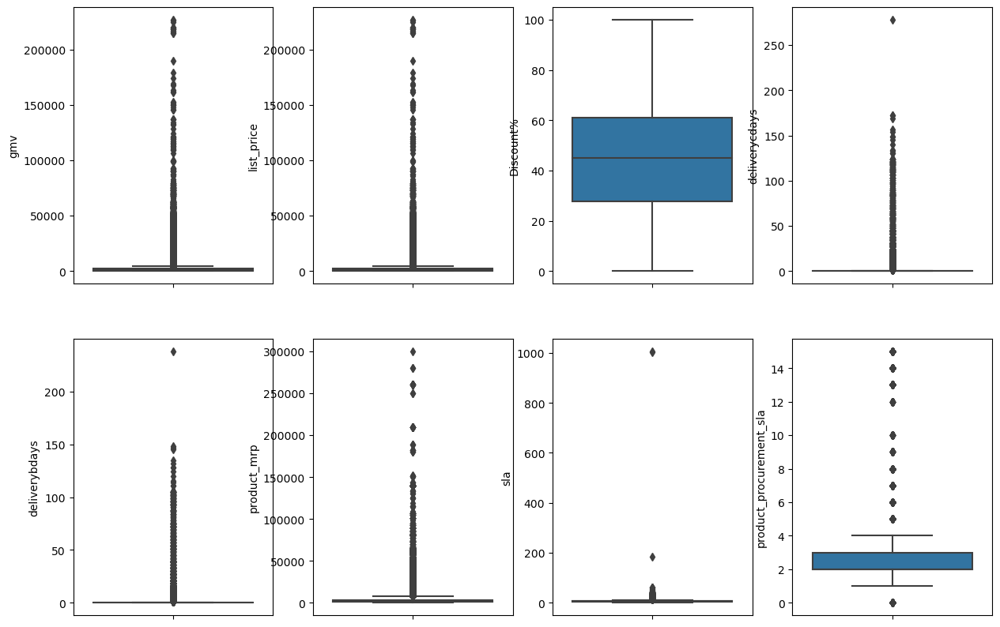

In [90]:
# Function to plot the distribution plot of the numeric variable list
plt.figure(figsize=(15,10))
plt.subplot(2,4,1)
sns.boxplot(y=consumer.gmv)
plt.subplot(2,4,2)
sns.boxplot(y=consumer.list_price)
plt.subplot(2,4,3)
sns.boxplot(y=consumer['Discount%'])
plt.subplot(2,4,4)
sns.boxplot(y=consumer.deliverycdays)
plt.subplot(2,4,5)
sns.boxplot(y=consumer.deliverybdays)
plt.subplot(2,4,6)
sns.boxplot(y=consumer.product_mrp)
plt.subplot(2,4,7)
sns.boxplot(y=consumer.sla)
plt.subplot(2,4,8)
sns.boxplot(y=consumer.product_procurement_sla)
plt.show()

#### After analyzing the distribution of values of the above attributes at different percentiles, we come to the following conclusion:

 - `'gmv', 'list_price' and 'mrp'` values can have occassional outliers owing to the fact that there are some high value sales. These records are less frequent and not at all at random.
 - `'Discount%'` can also be more in case on certain products. Specifically, a discount percentage of 100% would mean, the product came free with some other product.
 - On ther hand, unusually high values of `'deliverybdays', 'deliverycdays' and 'sla'` seem to be erroneous data. So we will find a way to treat these outlier values so that they do not affect the predictive model while at the same time there will be enough data to build a generalizable model.

## Capping value above or below a certain percentile:
For the variables - 'Sla', 'deliverybdays', 'deliverybdays', 'gmv', 'product_mrp', 'list_price' where outliers are present, we will CAP the values of 'sla','deliverybdays', 'deliverybdays' above 99 percentile to the value corresponding to 99 percentile.

In [91]:
# Updating the outlier values with values corresponding to pre-decided percentiles
consumer['deliverybdays'][(consumer['deliverybdays'] > 8.0)]= 8.0
consumer['deliverycdays'][(consumer['deliverycdays'] > 10.0)]= 10.0
consumer['sla'][(consumer['sla'] > 13.0)]= 13.0

In [92]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%

consumer.describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
gmv,1458404.0,2479.979947,5631.039245,0.0,349.00,780.00,1999.00,4300.00,11170.00,30546.0,226947.0
list_price,1458404.0,2446.927345,5549.646417,0.0,349.00,760.00,1990.00,4299.00,10990.00,29900.0,226947.0
Discount%,1458404.0,44.488029,22.762394,0.0,27.88,45.02,61.02,74.73,81.35,90.4,100.0
units,1458404.0,1.021589,0.256096,1.0,1.00,1.00,1.00,1.00,1.00,2.0,50.0
deliverybdays,1458404.0,0.995315,2.062533,0.0,0.00,0.00,0.00,5.00,6.00,8.0,8.0
deliverycdays,1458404.0,1.165708,2.422452,0.0,0.00,0.00,0.00,5.00,7.00,10.0,10.0
sla,1458404.0,5.745477,2.664410,0.0,4.00,6.00,7.00,9.00,10.00,13.0,13.0
product_mrp,1458404.0,4201.550705,8657.703104,49.0,845.00,1670.00,3499.00,7000.00,17995.00,45990.0,299999.0
product_procurement_sla,1458404.0,2.704766,1.786439,0.0,2.00,2.00,3.00,5.00,5.00,7.0,15.0
payday,1458404.0,0.035910,0.186067,0.0,0.00,0.00,0.00,0.00,0.00,1.0,1.0


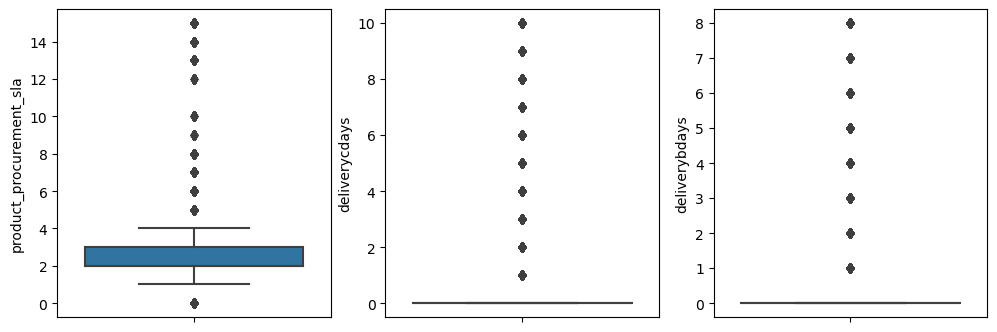

In [93]:
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
sns.boxplot(y=consumer.product_procurement_sla)
plt.subplot(1,3,2)
sns.boxplot(y=consumer.deliverycdays)
plt.subplot(1,3,3)
sns.boxplot(y=consumer.deliverybdays)
plt.show()

In [94]:
consumer.drop(['Year'],axis=1,inplace=True)
consumer.drop(['Month'],axis=1,inplace=True)

In [95]:
def holidayflg(ord_date):
    if ord_date.strftime('%Y') == 2015:
        if ord_date.strftime('%m') == '07' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '08' and ord_date.strftime('%d') == '03':
            return 1
        elif ord_date.strftime('%m') == '09' and ord_date.strftime('%d') == '07':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '12':
            return 1
        elif ord_date.strftime('%m') == '10' and ord_date.strftime('%d') == '31':
            return 1
        elif ord_date.strftime('%m') == '11' and ord_date.strftime('%d') == '11':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '12' and ord_date.strftime('%d') == '26':
            return 1
        else:
            return 0
    else:
        if ord_date.strftime('%m') == '01' and ord_date.strftime('%d') == '01':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '15':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') == '14':
            return 1
        elif ord_date.strftime('%m') == '02' and ord_date.strftime('%d') =='29':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '17':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '25':
            return 1
        elif ord_date.strftime('%m') == '03' and ord_date.strftime('%d') == '28':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '08':
            return 1
        elif ord_date.strftime('%m') == '05' and ord_date.strftime('%d') == '23':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '19':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '21':
            return 1
        elif ord_date.strftime('%m') == '06' and ord_date.strftime('%d') == '24':
            return 1
        else:
            return 0

In [96]:
consumer['occassion_flag'] = consumer['order_date'].apply(lambda x:holidayflg(x))
consumer.head()

,order_date,gmv,Week,list_price,Discount%,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday,product_type,occassion_flag
0,2015-10-17 15:11:54,6400.0,42,6400.0,10.99,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury,0
1,2015-10-19 10:07:22,6900.0,43,6900.0,4.03,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury,0
2,2015-10-20 15:45:56,1990.0,43,1990.0,5.19,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0
3,2015-10-14 12:05:15,1690.0,42,1690.0,19.49,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0
4,2015-10-17 21:25:03,1618.0,42,1618.0,22.92,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0


# Climate data

## Climate_2015

In [97]:
climate_2015.shape

(365, 27)

In [98]:
# Checking for the null values
round((climate_2015.isnull().sum()/len(climate_2015.index))*100,2)

Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Data Quality                  37.26
Max Temp (°C)                 40.82
Max Temp Flag                 96.44
Min Temp (°C)                 47.95
Min Temp Flag                 89.32
Mean Temp (°C)                47.95
Mean Temp Flag                89.32
Heat Deg Days (°C)            47.95
Heat Deg Days Flag            89.32
Cool Deg Days (°C)            47.95
Cool Deg Days Flag            89.32
Total Rain (mm)               37.26
Total Rain Flag               98.08
Total Snow (cm)               37.26
Total Snow Flag               97.53
Total Precip (mm)             37.26
Total Precip Flag             96.71
Snow on Grnd (cm)             37.26
Snow on Grnd Flag             99.45
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [99]:
# Dropping rows where all the columns have nulls
climate_2015.drop(['Data Quality','Max Temp Flag','Min Temp Flag','Mean Temp Flag',
                      'Heat Deg Days Flag','Cool Deg Days Flag','Total Rain Flag','Total Snow Flag',
                      'Total Precip Flag','Snow on Grnd Flag','Dir of Max Gust (10s deg)','Dir of Max Gust Flag',
                      'Spd of Max Gust (km/h)','Spd of Max Gust Flag'], axis = 1, inplace = True)

In [100]:
cols = ['Max Temp (°C)',
 'Min Temp (°C)',
 'Mean Temp (°C)',
 'Heat Deg Days (°C)',
 'Cool Deg Days (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_2015.dropna(subset=cols, inplace=True)

climate_2015.reset_index(drop=True, inplace=True)

In [101]:
climate_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date/Time           190 non-null    object 
 1   Year                190 non-null    int64  
 2   Month               190 non-null    int64  
 3   Day                 190 non-null    int64  
 4   Max Temp (°C)       190 non-null    float64
 5   Min Temp (°C)       190 non-null    float64
 6   Mean Temp (°C)      190 non-null    float64
 7   Heat Deg Days (°C)  190 non-null    float64
 8   Cool Deg Days (°C)  190 non-null    float64
 9   Total Rain (mm)     190 non-null    float64
 10  Total Snow (cm)     190 non-null    float64
 11  Total Precip (mm)   190 non-null    float64
 12  Snow on Grnd (cm)   190 non-null    float64
dtypes: float64(9), int64(3), object(1)
memory usage: 19.4+ KB


In [102]:
# Extracting week # from the date field and formatting it
import datetime
climate_2015['Date/Time'] = climate_2015['Date/Time'].astype(str)
climate_2015['Week'] = climate_2015['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_2015['Week'] = climate_2015['Week'].apply(lambda x: str(x).lstrip('0'))

climate_2015.head()

ValueError: time data '1/1/2015' does not match format '%Y-%m-%d'

In [103]:
# Extracting July to Dec month's data

climate_2015 = climate_2015[climate_2015['Month'] >= 7]

climate_2015.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
92,1/7/2015,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0
93,2/7/2015,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0
94,3/7/2015,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0
95,4/7/2015,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0
96,5/7/2015,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0


In [104]:
climate_2015.sort_values(by=['Week'], ascending = True, inplace = True)

KeyError: 'Week'

In [105]:
# Getting weekly data

climate_2015 = climate_2015.groupby(['Week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_2015.head()

KeyError: 'Week'

In [106]:
# Dropping 27th week data as it belongs to June 2015

climate_2015.drop(climate_2015[climate_2015['Week'] == '27'].index, inplace = True)

KeyError: 'Week'

In [107]:
# Checking for the duplicate values and null values
print(climate_2015.duplicated().any())
print(climate_2015.isnull().values.any())

False
False


## Climate 2016

In [108]:
climate_2016.shape

(366, 27)

In [109]:
# Checking for the null values
round((climate_2016.isnull().sum()/len(climate_2016.index))*100,2)

Date/Time                      0.00
Year                           0.00
Month                          0.00
Day                            0.00
Data Quality                  37.98
Max Temp (°C)                 38.25
Max Temp Flag                 99.73
Min Temp (°C)                 40.16
Min Temp Flag                 97.81
Mean Temp (°C)                40.16
Mean Temp Flag                97.81
Heat Deg Days (°C)            40.16
Heat Deg Days Flag            97.81
Cool Deg Days (°C)            40.16
Cool Deg Days Flag            97.81
Total Rain (mm)               37.98
Total Rain Flag               99.18
Total Snow (cm)               37.98
Total Snow Flag               98.09
Total Precip (mm)             37.98
Total Precip Flag             98.09
Snow on Grnd (cm)             37.98
Snow on Grnd Flag             98.36
Dir of Max Gust (10s deg)    100.00
Dir of Max Gust Flag         100.00
Spd of Max Gust (km/h)       100.00
Spd of Max Gust Flag         100.00
dtype: float64

In [110]:
# Dropping rows where all the columns have nulls
climate_2016.drop(['Data Quality','Max Temp Flag','Min Temp Flag','Mean Temp Flag',
                      'Heat Deg Days Flag','Cool Deg Days Flag','Total Rain Flag','Total Snow Flag',
                      'Total Precip Flag','Snow on Grnd Flag','Dir of Max Gust (10s deg)','Dir of Max Gust Flag',
                      'Spd of Max Gust (km/h)','Spd of Max Gust Flag'], axis = 1, inplace = True)


In [111]:
cols = ['Max Temp (°C)',
 'Min Temp (°C)',
 'Mean Temp (°C)',
 'Heat Deg Days (°C)',
 'Cool Deg Days (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'Total Precip (mm)',
 'Snow on Grnd (cm)']

climate_2016.dropna(subset=cols, inplace=True)

climate_2016.reset_index(drop=True, inplace=True)

In [112]:
climate_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date/Time           219 non-null    object 
 1   Year                219 non-null    int64  
 2   Month               219 non-null    int64  
 3   Day                 219 non-null    int64  
 4   Max Temp (°C)       219 non-null    float64
 5   Min Temp (°C)       219 non-null    float64
 6   Mean Temp (°C)      219 non-null    float64
 7   Heat Deg Days (°C)  219 non-null    float64
 8   Cool Deg Days (°C)  219 non-null    float64
 9   Total Rain (mm)     219 non-null    float64
 10  Total Snow (cm)     219 non-null    float64
 11  Total Precip (mm)   219 non-null    float64
 12  Snow on Grnd (cm)   219 non-null    float64
dtypes: float64(9), int64(3), object(1)
memory usage: 22.4+ KB


In [113]:
climate_2016['Date/Time'] = climate_2016['Date/Time'].astype(str)
climate_2016['Week'] = climate_2016['Date/Time'].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%d").strftime("%V"))

climate_2016['Week'] = climate_2016['Week'].apply(lambda x: str(x).lstrip('0'))

climate_2016.head()

ValueError: time data '8/1/2016' does not match format '%Y-%m-%d'

In [114]:
# Extracting Jan to June month's data

climate_2016 = climate_2016[climate_2016['Month'] <= 6]

climate_2016.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,8/1/2016,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0
1,9/1/2016,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0
2,10/1/2016,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0
3,12/1/2016,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0
4,14/1/2016,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0


In [115]:
climate_2016.sort_values(by=['Week'], ascending = True, inplace = True)

KeyError: 'Week'

In [116]:
# Getting weekly data

climate_2016 = climate_2016.groupby(['Week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

climate_2016.head()

KeyError: 'Week'

In [117]:
# Checking for the duplicate values and null values
print(climate_2016.duplicated().any())
print(climate_2016.isnull().values.any())

False
False


## concating the two different climate dataset into one

In [118]:
climate = pd.concat([climate_2015, climate_2016], axis = 0)

climate.shape

(191, 13)

In [119]:
climate.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
92,1/7/2015,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0
93,2/7/2015,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0
94,3/7/2015,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0
95,4/7/2015,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0
96,5/7/2015,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0


## Media Data - Media_Investment

In [120]:
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [121]:
# Imputing the null values in Radio and other column with 0
media_investment['Radio'].fillna(value=0,inplace=True)
media_investment['Other'].fillna(value=0,inplace = True)
media_investment.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,0.0,0.0
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,0.0,0.0
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,0.0,0.0


## Mapping months to number of weeks for the month
Below function takes input an year and generates the numbers of the weeks for each month in it

In [122]:
import calendar

def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)
            
        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [123]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [124]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

In [125]:
# Lets create a temporary DataFrame
media_investment1 = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

media_investment1.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


To get the weekly data We need to divide the monthly values by the number of weeks in that month 

In [126]:
i = 0

for index, row in media_investment.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:
            
            media_investment1.iloc[i].Year = row.Year
            media_investment1.iloc[i].Month = row.Month
            media_investment1.iloc[i]['Week'] = week
            media_investment1.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            media_investment1.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            media_investment1.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            media_investment1.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            media_investment1.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            media_investment1.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            media_investment1.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            media_investment1.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            media_investment1.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            media_investment1.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

    elif row.Year == 2016:
        
        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:
            
            media_investment1.iloc[i].Year = row.Year
            media_investment1.iloc[i].Month = row.Month
            media_investment1.iloc[i]['Week'] = week
            media_investment1.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            media_investment1.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            media_investment1.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            media_investment1.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            media_investment1.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            media_investment1.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            media_investment1.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            media_investment1.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            media_investment1.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            media_investment1.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)
            
            i+=1

media_investment1.head()

,Year,Month,Week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [127]:
media_investment1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52 non-null     object
 1   Month              52 non-null     object
 2   Week               52 non-null     object
 3   Total Investment   52 non-null     object
 4   TV                 52 non-null     object
 5   Digital            52 non-null     object
 6   Sponsorship        52 non-null     object
 7   Content Marketing  52 non-null     object
 8   Online marketing   52 non-null     object
 9   Affiliates         52 non-null     object
 10  SEM                52 non-null     object
 11  Radio              52 non-null     object
 12  Other              52 non-null     object
dtypes: object(13)
memory usage: 5.4+ KB


In [128]:
# Checking for duplicates  and null values
print(media_investment1.duplicated().any())
print(media_investment1.isnull().any())

False
Year                 False
Month                False
Week                 False
Total Investment     False
TV                   False
Digital              False
Sponsorship          False
Content Marketing    False
Online marketing     False
Affiliates           False
SEM                  False
Radio                False
Other                False
dtype: bool


In [129]:
#Lets Drop year and month columns
media_investment = media_investment1
media_investment.drop(['Year','Month'],axis=1,inplace=True)


In [130]:
media_investment.shape

(52, 11)

In [131]:
columns = media_investment.columns[1:]
columns

Index(['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'],
      dtype='object')

In [132]:
## Calculating 8-weeks Exponential Moving Average for all Advertising media channels
def EMA_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_EMA_'+np.str(n),value=df[i].ewm(span=n, adjust=False).mean())
    return df

In [133]:
media_investment = EMA_variables(media_investment,columns,8) 
media_investment.head()

,Week,Total Investment,Total Investment_EMA_8,TV,TV_EMA_8,Digital,Digital_EMA_8,Sponsorship,Sponsorship_EMA_8,Content Marketing,Content Marketing_EMA_8,Online marketing,Online marketing_EMA_8,Affiliates,Affiliates_EMA_8,SEM,SEM_EMA_8,Radio,Radio_EMA_8,Other,Other_EMA_8
0,28,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
1,29,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
2,30,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
3,31,4.265,4.265000,0.054,0.054000,0.633,0.633000,1.854,1.854000,0.0,0.0,0.332,0.332,0.137,0.137000,1.256,1.256000,0.0,0.0,0.0,0.0
4,32,1.013,3.542333,0.001,0.042222,0.256,0.549222,0.213,1.489333,0.0,0.0,0.026,0.264,0.015,0.109889,0.503,1.088667,0.0,0.0,0.0,0.0


In [134]:
## Calculating 5-weeks Simple Moving Average for all Advertising media channels
def SMA_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_SMA_'+np.str(n),value=df[i].rolling(window=n).mean())
    return df

In [135]:
media_investment = SMA_variables(media_investment,columns,5) 
media_investment = SMA_variables(media_investment,columns,3) 
media_investment.head()

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8
0,28,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0.0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0
1,29,4.265,NaN,NaN,4.265000,0.054,NaN,NaN,0.054000,0.633,NaN,NaN,0.633000,1.854,NaN,NaN,1.854000,0.0,NaN,NaN,0.0,0.332,NaN,NaN,0.332,0.137,NaN,NaN,0.137000,1.256,NaN,NaN,1.256000,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0
2,30,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0.0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0
3,31,4.265,4.265,NaN,4.265000,0.054,0.054000,NaN,0.054000,0.633,0.633000,NaN,0.633000,1.854,1.854,NaN,1.854000,0.0,0.0,NaN,0.0,0.332,0.332,NaN,0.332,0.137,0.137000,NaN,0.137000,1.256,1.256,NaN,1.256000,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0
4,32,1.013,3.181,3.6146,3.542333,0.001,0.036333,0.0434,0.042222,0.256,0.507333,0.5576,0.549222,0.213,1.307,1.5258,1.489333,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.015,0.096333,0.1126,0.109889,0.503,1.005,1.1054,1.088667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Adstock

Formula for adstock  At = Xt + adstock rate * At-1."""

In [136]:
#def adstocked_advertising(adstock_rate=0.6, advertising = media_investment):
def calculate_ad_stocks(data, engagement_factor):
    
    """initialize ad stock vectors"""
    TV_ad_stock_vector = []                     
    Digital_ad_stock_vector = []
    Sponsorship_ad_stock_vector = []
    Content_Marketing_ad_stock_vector = []
    Online_marketing_ad_stock_vector = []
    Affiliates_ad_stock_vector = []
    SEM_ad_stock_vector = []
    Radio_ad_stock_vector = []
    Other_ad_stock_vector = []
    Total_Investment_ad_stock_vector = []
    
    """initialize ad_stock_value"""
    tv_ad_stock_value = 0 
    Digital_ad_stock_value = 0
    Sponsorship_ad_stock_value = 0
    Content_Marketing_ad_stock_value = 0
    Online_marketing_ad_stock_value = 0
    Affiliates_ad_stock_value = 0
    SEM_ad_stock_value = 0
    Radio_ad_stock_value = 0
    Other_ad_stock_value = 0
    Total_Investment_ad_stock_value = 0
    
    """loop through dataset to calculate adstock values. The formula for adstock is: At = Xt + adstock rate * At-1."""
    for index, row in data.iterrows():
        tv_ad_stock_value = row['TV'] + engagement_factor * tv_ad_stock_value
        TV_ad_stock_vector.append(tv_ad_stock_value)
        Digital_ad_stock_value = row['Digital'] + engagement_factor * Digital_ad_stock_value
        Digital_ad_stock_vector.append(Digital_ad_stock_value)
        Sponsorship_ad_stock_value = row['Sponsorship'] + engagement_factor * Sponsorship_ad_stock_value
        Sponsorship_ad_stock_vector.append(Sponsorship_ad_stock_value)
        Content_Marketing_ad_stock_value = row['Content Marketing'] + engagement_factor * Content_Marketing_ad_stock_value
        Content_Marketing_ad_stock_vector.append(Content_Marketing_ad_stock_value)    
        Online_marketing_ad_stock_value = row['Online marketing'] + engagement_factor * Online_marketing_ad_stock_value
        Online_marketing_ad_stock_vector.append(Online_marketing_ad_stock_value)
        Affiliates_ad_stock_value = row['Affiliates'] + engagement_factor * Affiliates_ad_stock_value
        Affiliates_ad_stock_vector.append(Affiliates_ad_stock_value)
        SEM_ad_stock_value = row['SEM'] + engagement_factor * SEM_ad_stock_value
        SEM_ad_stock_vector.append(SEM_ad_stock_value)
        Radio_ad_stock_value = row['Radio'] + engagement_factor * Radio_ad_stock_value
        Radio_ad_stock_vector.append(Radio_ad_stock_value)
        Other_ad_stock_value = row['Other'] + engagement_factor * Other_ad_stock_value
        Other_ad_stock_vector.append(Other_ad_stock_value)
        Total_Investment_ad_stock_value = row['Total Investment'] + engagement_factor * Total_Investment_ad_stock_value
        Total_Investment_ad_stock_vector.append(Total_Investment_ad_stock_value)
    
    """add ad stock vector to dataset"""
    loc_index = data.columns.get_loc('TV_EMA_8') + 1
    data.insert(loc=loc_index,column='TV_ads',value=TV_ad_stock_vector)
    loc_index = data.columns.get_loc('Digital_EMA_8') + 1
    data.insert(loc=loc_index,column='Digital_ads',value=Digital_ad_stock_vector)
    loc_index = data.columns.get_loc('Sponsorship_EMA_8') + 1
    data.insert(loc=loc_index,column='Sponsorship_ads',value=Sponsorship_ad_stock_vector)
    loc_index = data.columns.get_loc('Content Marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Content_Marketing_ads',value=Content_Marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Online marketing_EMA_8') + 1
    data.insert(loc=loc_index,column='Online_marketing_ads',value=Online_marketing_ad_stock_vector)
    loc_index = data.columns.get_loc('Affiliates_EMA_8') + 1
    data.insert(loc=loc_index,column='Affiliates_ads',value=Affiliates_ad_stock_vector)
    loc_index = data.columns.get_loc('SEM_EMA_8') + 1
    data.insert(loc=loc_index,column='SEM_ads',value=SEM_ad_stock_vector)
    loc_index = data.columns.get_loc('Radio_EMA_8') + 1
    data.insert(loc=loc_index,column='Radio_ads',value=Radio_ad_stock_vector)
    loc_index = data.columns.get_loc('Other_EMA_8') + 1
    data.insert(loc=loc_index,column='Other_ads',value=Other_ad_stock_vector)
    loc_index = data.columns.get_loc('Total Investment_EMA_8') + 1
    data.insert(loc=loc_index,column='Total_Investment_Ads',value=Total_Investment_ad_stock_vector)
    
    return data

In [137]:
media_investment = calculate_ad_stocks(data=media_investment, engagement_factor=0.6)
media_investment.head(20)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads
0,28,4.265,NaN,NaN,4.265000,4.265000,0.054,NaN,NaN,0.054000,0.054000,0.633,NaN,NaN,0.633000,0.633000,1.854,NaN,NaN,1.854000,1.854000,0.0,NaN,NaN,0.000000,0.000000,0.332,NaN,NaN,0.332000,0.332000,0.137,NaN,NaN,0.137000,0.137000,1.256,NaN,NaN,1.256000,1.256000,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0.0,0.0
1,29,4.265,NaN,NaN,4.265000,6.824000,0.054,NaN,NaN,0.054000,0.086400,0.633,NaN,NaN,0.633000,1.012800,1.854,NaN,NaN,1.854000,2.966400,0.0,NaN,NaN,0.000000,0.000000,0.332,NaN,NaN,0.332000,0.531200,0.137,NaN,NaN,0.137000,0.219200,1.256,NaN,NaN,1.256000,2.009600,0.0,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0.0,0.0
2,30,4.265,4.265000,NaN,4.265000,8.359400,0.054,0.054000,NaN,0.054000,0.105840,0.633,0.633000,NaN,0.633000,1.240680,1.854,1.854000,NaN,1.854000,3.633840,0.0,0.000000,NaN,0.000000,0.000000,0.332,0.332000,NaN,0.332000,0.650720,0.137,0.137000,NaN,0.137000,0.268520,1.256,1.256000,NaN,1.256000,2.461760,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0
3,31,4.265,4.265000,NaN,4.265000,9.280640,0.054,0.054000,NaN,0.054000,0.117504,0.633,0.633000,NaN,0.633000,1.377408,1.854,1.854000,NaN,1.854000,4.034304,0.0,0.000000,NaN,0.000000,0.000000,0.332,0.332000,NaN,0.332000,0.722432,0.137,0.137000,NaN,0.137000,0.298112,1.256,1.256000,NaN,1.256000,2.733056,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0.0,0.000000,0.0000,0.000000,0.000000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0.0,0.000000,0.0000,0.000000,0.000000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0.0,0.000000,0.0000,0.000000,0.000000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0.0,0.000000,0.0000,0.000000,0.000000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0.0,0.000000,0.0000,0.000000,0.000000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,37,24.064,8.696667,5.6232,6.855364,25.898341,0.97,0.324000,0.1948,0.228066,0.976866,0.339,0.283667,0.2726,0.357904,0.757405,15.697,5.374333,3.3098,4.017169,16.179880,0.153

In [138]:
media_investment.fillna(value=0, inplace=True)
media_investment.head(10)

,Week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads
0,28,4.265,0.000000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000000,0.0000,1.854000,1.854000,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,29,4.265,0.000000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000000,0.0000,1.854000,2.966400,0.000,0.000,0.0000,0.000,0.000,0.332,0.000000,0.0000,0.332000,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,30,4.265,4.265000,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854000,0.0000,1.854000,3.633840,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256000,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,31,4.265,4.265000,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854000,0.0000,1.854000,4.034304,0.000,0.000,0.0000,0.000,0.000,0.332,0.332000,0.0000,0.332000,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256000,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,32,1.013,3.181000,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307000,1.5258,1.489333,2.633582,0.000,0.000,0.0000,0.000,0.000,0.026,0.230000,0.2708,0.264000,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005000,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,33,1.013,2.097000,2.9642,2.980259,4.961830,0.001,0.018667,0.0328,0.033062,0.043901,0.256,0.381667,0.4822,0.484062,0.905467,0.213,0.760000,1.1976,1.205704,1.793149,0.000,0.000,0.0000,0.000,0.000,0.026,0.128000,0.2096,0.211111,0.301676,0.015,0.055667,0.0882,0.088802,0.131320,0.503,0.754000,0.9548,0.958519,1.788700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,34,1.013,1.013000,2.3138,2.543091,3.990098,0.001,0.001000,0.0222,0.025937,0.027341,0.256,0.256000,0.4068,0.433381,0.799280,0.213,0.213000,0.8694,0.985103,1.288890,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.1484,0.169975,0.207005,0.015,0.015000,0.0638,0.072402,0.093792,0.503,0.503000,0.8042,0.857292,1.576220,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,35,1.013,1.013000,1.6634,2.203070,3.407059,0.001,0.001000,0.0116,0.020395,0.017405,0.256,0.256000,0.3314,0.393963,0.735568,0.213,0.213000,0.5412,0.813524,0.986334,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0872,0.137981,0.150203,0.015,0.015000,0.0394,0.059646,0.071275,0.503,0.503000,0.6536,0.778561,1.448732,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,36,1.013,1.013000,1.0130,1.938610,3.057235,0.001,0.001000,0.0010,0.016085,0.011443,0.256,0.256000,0.2560,0.363305,0.697341,0.213,0.213000,0.2130,0.680075,0.804800,0.000,0.000,0.0000,0.000,0.000,0.026,0.026000,0.0260,0.113096,0.116122,0.015,0.015000,0.0150,0.049725,0.057765,0.503,0.503000,0.5030,0.717325,1.372239,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,37,24.064,8.696667,5.6232,6.855364,25.898341,0.970,0.32400

In [139]:
media_investment.shape

(52, 51)

In [140]:
nps_score.columns.values[0]='score'
# resetting index
nps_score.reset_index(drop=True, inplace=True)

# Transposing the dataframe
nps_score = nps_score.T

# resetting index
nps_score.reset_index(drop=False, inplace=True)

# renaming columns
nps_score.columns = ['Month', 'NPS', 'Stock Index']
nps_score.drop(nps_score.index[0], inplace=True)
nps_score


ValueError: Length mismatch: Expected axis has 4 elements, new values have 3 elements

In [141]:
temp_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'NPS', 'Stock Index'])

temp_nps

,Year,Month,Week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN


In [142]:
from datetime import datetime
from scipy.stats import norm
import re

i = 0

for index, row in nps_score.iterrows():

    if '15' in row['Month']:
        
        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2015[month]:        
            
            temp_nps.iloc[i].Year = 2015
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1
        
    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]
    
        for week in dict_name_2016[month]:        
            
            temp_nps.iloc[i].Year = 2016
            temp_nps.iloc[i].Month = month
            temp_nps.iloc[i].Week = week
            temp_nps.iloc[i].NPS = row['NPS']
            temp_nps.iloc[i]['Stock Index'] = row['Stock Index']
            
            i+=1

temp_nps.head()

KeyError: 'Month'

In [143]:
temp_nps['Week'] = temp_nps['Week'].astype('str')
nps_score = temp_nps

In [144]:
nps_score.duplicated('Week').value_counts()

True     51
False     1
dtype: int64

In [145]:
nps_score.isnull().any()

Year            True
Month           True
Week           False
NPS             True
Stock Index     True
dtype: bool

In [146]:
# Dropping Year and Month columns
nps_score.drop(['Year','Month'],axis=1,inplace=True)

In [147]:
nps_score.head()

,Week,NPS,Stock Index
0,nan,NaN,NaN
1,nan,NaN,NaN
2,nan,NaN,NaN
3,nan,NaN,NaN
4,nan,NaN,NaN


In [148]:
nps_column = nps_score.columns[1:]
nps_column

Index(['NPS', 'Stock Index'], dtype='object')

In [149]:
## Calculating 5-weeks and 3-weeks Simple Moving Average for NPS and Stock_Index
nps_score = SMA_variables(nps_score,nps_column,5) 
nps_score = SMA_variables(nps_score,nps_column,3) 
nps_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,nan,NaN,NaN,NaN,NaN,NaN,NaN
1,nan,NaN,NaN,NaN,NaN,NaN,NaN
2,nan,NaN,NaN,NaN,NaN,NaN,NaN
3,nan,NaN,NaN,NaN,NaN,NaN,NaN
4,nan,NaN,NaN,NaN,NaN,NaN,NaN


In [150]:
# Replacing Nan values with 0
nps_score.fillna(value=0,inplace=True)
nps_score.head()

,Week,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5
0,nan,0,0.0,0.0,0,0.0,0.0
1,nan,0,0.0,0.0,0,0.0,0.0
2,nan,0,0.0,0.0,0,0.0,0.0
3,nan,0,0.0,0.0,0,0.0,0.0
4,nan,0,0.0,0.0,0,0.0,0.0


In [151]:
nps_score.shape

(52, 7)

## Sale calendar

In [152]:
sale_calendar

,Unnamed: 1,Unnamed: 2
0,2015.0,Sales Calendar
1,2015.0,(18-19th July)
2,2015.0,(15-17th Aug)
3,2015.0,(28-30th Aug)
4,2015.0,(17-15th Oct)
5,2015.0,(7-14th Nov)
6,NaN,(25th Dec'15 - 3rd Jan'16)
7,2016.0,(20-22 Jan)
8,2016.0,(1-2 Feb)
9,2016.0,(20-21 Feb)


In [153]:
# Getting the data into required format

sale_calendar.columns = ['Year', 'Sale']

sale_calendar.Year = sale_calendar.Year.apply(lambda x: int(x))
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('th','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('rd','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace('(','').strip())
sale_calendar.Sale = sale_calendar.Sale.apply(lambda x: x.replace(')','').strip())

# Splitting 25-31 Dec into two different rows for the ease of weekly data generation

sale_calendar.iloc[5, sale_calendar.columns.get_loc('Sale')] = '25-31 Dec'
sale_calendar = sale_calendar.append({'Year' : 2016 , 'Sale' : '1-3 Jan'} , ignore_index=True)

sale_calendar.sort_values(by=['Year'], ascending = True, inplace = True)

sale_calendar

ValueError: cannot convert float NaN to integer

In [154]:
# Temp DataFrame

temp_sale_calendar = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'Week', 'Sale'])

temp_sale_calendar

,Year,Month,Week,Sale
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN


In [155]:
i = 0
import datetime

for index, row in sale_calendar.iterrows():

    week_list = []
    month_list = []
    year_list = []

    date1, date2, month = re.split("[- ]", row.Sale)
    month = month[0:3] # Taking only the first 3 character of the month name
    year = row.Year
    
#     print("Date => {}-{}-{}".format(date1, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date1, month, year), "%d-%b-%Y").strftime("%V"))
#     print("Date => {}-{}-{}".format(date2, month, year))
#     print(datetime.datetime.strptime('{}-{}-{}'.format(date2, month, year), "%d-%b-%Y").strftime("%V"))
    
    date = int(date1)
    
    while date <= int(date2):
        
        # Extracting the week numbers of the range of dates in each month
        week = datetime.datetime.strptime('{}-{}-{}'.format(date, month, year), "%d-%b-%Y").strftime("%V")
        week_list.append(int(week))
        date+=1
        week_dict = dict.fromkeys(week_list, 0) # Generating a week list dictionary with default value as 0

    for j in week_list:
        week_dict[j] = week_dict[j] + 1

    for key, value in week_dict.items():
        temp_sale_calendar.iloc[i].Year = year
        temp_sale_calendar.iloc[i].Month = month
        temp_sale_calendar.iloc[i].Week = key
        temp_sale_calendar.iloc[i].Sale = value
        
        i+=1
    
temp_sale_calendar.dropna(axis=0, how='all', inplace=True) # Drop all rows which has all Nulls
temp_sale_calendar.sort_values(by=['Week'], ascending = True, inplace = True)

# Handling the special cases of 53 and 7 week numbers which appear twice
temp_sale_calendar.loc[temp_sale_calendar['Week'] == 53, 'Sale'] = temp_sale_calendar.loc[temp_sale_calendar['Week'] == 53, 'Sale'].sum()
temp_sale_calendar.loc[temp_sale_calendar['Week'] == 7, 'Sale'] = temp_sale_calendar.loc[temp_sale_calendar['Week'] == 7, 'Sale'].sum()
# Dropping the redundant 53 and 7 week numbers
temp_sale_calendar.drop_duplicates(subset=['Week'], keep='first', inplace=True)
temp_sale_calendar.reset_index(drop=True, inplace=True)

temp_sale_calendar.head()

ValueError: not enough values to unpack (expected 3, got 2)

In [156]:
temp_sale_calendar['Week'] = temp_sale_calendar['Week'].astype('str')

In [157]:
sale_calendar = temp_sale_calendar

sale_calendar.head()

,Year,Month,Week,Sale
0,NaN,NaN,nan,NaN
1,NaN,NaN,nan,NaN
2,NaN,NaN,nan,NaN
3,NaN,NaN,nan,NaN
4,NaN,NaN,nan,NaN


In [158]:
sale_calendar.duplicated('Week').value_counts()

True     51
False     1
dtype: int64

In [159]:
sale_calendar.isnull().any()

Year      True
Month     True
Week     False
Sale      True
dtype: bool

In [160]:
# Dropping Year and Month columns as we won't be needing them anymore

sale_calendar.drop(['Year','Month'],axis=1,inplace=True)

In [161]:
sale_calendar

,Week,Sale
0,nan,NaN
1,nan,NaN
2,nan,NaN
3,nan,NaN
4,nan,NaN
5,nan,NaN
6,nan,NaN
7,nan,NaN
8,nan,NaN
9,nan,NaN


## Extracting 3 separate dataframes for 3 product subcategories - camera accessory, home audio and gaming accessory

In [162]:
consumer['product_analytic_sub_category'].value_counts()

speaker                462524
cameraaccessory        215901
gamingaccessory        185876
tvvideosmall           133192
homeaudio              111061
audiomp3player         103463
game                    96842
camera                  87552
gamingconsole           26984
camerastorage           16558
audioaccessory          10702
hometheatre              4197
amplifierreceiver        3455
gamemembershipcards        97
Name: product_analytic_sub_category, dtype: int64

In [163]:
camera_accessory = consumer[consumer['product_analytic_sub_category']=="cameraaccessory"]
gaming_accessory = consumer[consumer['product_analytic_sub_category']=="gamingaccessory"]
home_audio = consumer[consumer['product_analytic_sub_category']=="homeaudio"]

In [164]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(215901, 19)
(185876, 19)
(111061, 19)


In [165]:
#converting some categorical variable to binary values
camera_accessory['is_cod'] = camera_accessory['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
gaming_accessory['is_cod'] = gaming_accessory['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)
home_audio['is_cod'] = home_audio['s1_fact.order_payment_type'].apply(lambda x:1 if x=='cod' else 0)


camera_accessory['is_mass_market'] = camera_accessory['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
gaming_accessory['is_mass_market'] = gaming_accessory['product_type'].apply(lambda x:1 if x=='mass_market' else 0)
home_audio['is_mass_market'] = home_audio['product_type'].apply(lambda x:1 if x=='mass_market' else 0)



In [166]:
# deleting the original column s1_fact.order_payment_type and product_type
camera_accessory.drop(['s1_fact.order_payment_type'],axis=1,inplace=True)
camera_accessory.drop(['product_type'],axis=1,inplace=True)
gaming_accessory.drop(['s1_fact.order_payment_type'],axis=1,inplace=True)
gaming_accessory.drop(['product_type'],axis=1,inplace=True)
home_audio.drop(['s1_fact.order_payment_type'],axis=1,inplace=True)
home_audio.drop(['product_type'],axis=1,inplace=True)

## Creating a dummy variable for categorical variable

In [167]:
# Creating dummy variables for the remaining categorical variable
dummy1 = pd.get_dummies(camera_accessory[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy2 = pd.get_dummies(gaming_accessory[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
dummy3 = pd.get_dummies(home_audio[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)

# Adding the results to the original dataframes
camera_accessory = pd.concat([camera_accessory, dummy1], axis=1)
gaming_accessory = pd.concat([gaming_accessory, dummy2], axis=1)
home_audio = pd.concat([home_audio, dummy3], axis=1)

In [168]:
# Unique value frequencies
# Checking for the Unique values
# Unique value frequencies
unique_values = pd.DataFrame(camera_accessory.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values

,Unique Value Count
product_analytic_category,1
product_analytic_sub_category,1
product_vertical_cameraeyecup,2
product_vertical_camerafilmrolls,2
product_vertical_camerahousing,2
product_vertical_cameraledlight,2
product_vertical_cameramicrophone,2
product_vertical_cameramount,2
product_vertical_cameraremotecontrol,2
product_vertical_camerabatterygrip,2


In [169]:
# removing columns
camera_accessory = camera_accessory.drop('product_analytic_vertical', axis=1)
gaming_accessory = gaming_accessory.drop('product_analytic_vertical', axis=1)
home_audio = home_audio.drop('product_analytic_vertical', axis=1)



In [170]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(215901, 41)
(185876, 32)
(111061, 28)


In [171]:
unique_values = pd.DataFrame(camera_accessory.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values

,Unique Value Count
product_analytic_category,1
product_analytic_sub_category,1
product_vertical_cameraeyecup,2
product_vertical_camerafilmrolls,2
product_vertical_camerahousing,2
product_vertical_cameraledlight,2
product_vertical_cameramicrophone,2
product_vertical_cameramount,2
product_vertical_cameraremotecontrol,2
product_vertical_camerabatterygrip,2


In [172]:
unique_values = pd.DataFrame(gaming_accessory.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values

,Unique Value Count
product_analytic_category,1
product_analytic_sub_category,1
occassion_flag,2
product_vertical_joystickgamingwheel,2
product_vertical_gamingspeaker,2
product_vertical_gamingmousepad,2
product_vertical_gamingmouse,2
product_vertical_gamingmemorycard,2
product_vertical_gamingkeyboard,2
product_vertical_gamingheadset,2


In [173]:
unique_values = pd.DataFrame(home_audio.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
unique_values

,Unique Value Count
product_analytic_category,1
product_analytic_sub_category,1
product_vertical_voicerecorder,2
product_vertical_slingbox,2
product_vertical_karaokeplayer,2
product_vertical_homeaudiospeaker,2
product_vertical_hifisystem,2
product_vertical_fmradio,2
product_vertical_dockingstation,2
product_vertical_dock,2


In [174]:
## Lets drop product_analytic_category and product_analytic_sub_category
# deleting the original column s1_fact.order_payment_type and product_type
camera_accessory.drop(['product_analytic_category'],axis=1,inplace=True)
camera_accessory.drop(['product_analytic_sub_category'],axis=1,inplace=True)
gaming_accessory.drop(['product_analytic_category'],axis=1,inplace=True)
gaming_accessory.drop(['product_analytic_sub_category'],axis=1,inplace=True)
home_audio.drop(['product_analytic_category'],axis=1,inplace=True)
home_audio.drop(['product_analytic_sub_category'],axis=1,inplace=True)

In [175]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(215901, 39)
(185876, 30)
(111061, 26)


In [176]:
# checking for any null values
print(camera_accessory.isnull().values.any())
print(gaming_accessory.isnull().values.any())
print(home_audio.isnull().values.any())

False
False
False


Roll Up Order Data to Weekly Level
Rolling up order data to get weekly data by taking a mean of all the values per week
 For rolling up to obtain weekly data that will be used for modelling, we will ignore `list_price` and `product_mrp`. These features are closely related to `gmv(revenue)`. However they dont add any business value. It is obvious that having a high mpr or list_price will increase the revenue. But that wont be a good business decision to maximise revenue.

`Units` also is not a very important feature from business perspective as its obvious that higher the no of units sold, more will be the revenue. The challenge of prediction is to find attributes, tuning which, customers will buy more product units, thereby increasing revenue.

In [177]:
camera_accessory = camera_accessory.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': "mean", \
                                          'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'payday':'sum','occassion_flag':'sum','is_cod':'sum', 'is_mass_market':'sum', \
                                          'product_vertical_cameraaccessory':'sum', \
                                          'product_vertical_camerabag':'sum', 'product_vertical_camerabattery':'sum', \
                                          'product_vertical_camerabatterycharger':'sum', 'product_vertical_camerabatterygrip': \
                                          'sum','product_vertical_cameraeyecup':'sum','product_vertical_camerafilmrolls':'sum', \
                                          'product_vertical_camerahousing':'sum','product_vertical_cameraledlight':'sum', \
                                          'product_vertical_cameramicrophone':'sum','product_vertical_cameramount':'sum', \
                                          'product_vertical_cameraremotecontrol':'sum', 'product_vertical_cameratripod':'sum', \
                                          'product_vertical_extensiontube':'sum', 'product_vertical_filter':'sum', \
                                          'product_vertical_flash':'sum','product_vertical_flashshoeadapter':'sum', \
                                          'product_vertical_lens':'sum','product_vertical_reflectorumbrella':'sum', \
                                          'product_vertical_softbox':'sum','product_vertical_strap':'sum', \
                                          'product_vertical_teleconverter':'sum','product_vertical_telescope':'sum'}) \
.reset_index(drop=False)
camera_accessory.shape

(51, 34)

In [178]:
gaming_accessory = gaming_accessory.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays':"mean", \
                                                               'deliverycdays':'mean','sla':'mean','product_procurement_sla': \
                                                               'mean','payday':'sum','occassion_flag':'sum','is_cod':'sum', \
                                                               'is_mass_market':'sum','product_vertical_gamecontrolmount':'sum', \
                                                               'product_vertical_gamepad':'sum', \
                                                               'product_vertical_gamingaccessorykit':'sum', \
                                                               'product_vertical_gamingadapter':'sum', \
                                                               'product_vertical_gamingchargingstation':'sum', \
                                                               'product_vertical_gamingheadset':'sum', \
                                                               'product_vertical_gamingkeyboard':'sum', \
                                                               'product_vertical_gamingmemorycard':'sum', \
                                                               'product_vertical_gamingmouse':'sum', \
                                                               'product_vertical_gamingmousepad':'sum', \
                                                               'product_vertical_gamingmousepad':'sum', \
                                                               'product_vertical_gamingspeaker':'sum', 
                                                               'product_vertical_joystickgamingwheel':'sum', \
                                                               'product_vertical_motioncontroller':'sum', \
                                                               'product_vertical_tvoutcableaccessory':'sum'}) \
.reset_index(drop=False)
gaming_accessory.shape

(52, 25)

In [179]:
home_audio = home_audio.groupby(['Week']).agg({'gmv':"sum",'Discount%':'mean','deliverybdays': \
                                                   'mean','deliverycdays':'mean','sla':'mean','product_procurement_sla':'mean',\
                                                   'payday':'sum','occassion_flag':'sum','is_cod':'sum', \
                                                   'is_mass_market':'sum','product_vertical_djcontroller':'sum', \
                                                   'product_vertical_dock':'sum', 'product_vertical_dockingstation':'sum', \
                                                   'product_vertical_fmradio':'sum', 'product_vertical_hifisystem':'sum', \
                                                   'product_vertical_homeaudiospeaker':'sum', \
                                                   'product_vertical_karaokeplayer':'sum', 'product_vertical_slingbox':'sum', \
                                                   'product_vertical_soundmixer':'sum','product_vertical_voicerecorder':'sum'})\
.reset_index(drop=False)
home_audio.shape

(49, 21)

Calculating Payday week & Holiday week
If Payday falls within the week(payday_flag > 0), then payday week = 1, else 0
If holiday falls within the week(occassion_flag > 0), then holiday week = 1, else 0

In [180]:
camera_accessory['payday_week'] = camera_accessory['payday'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory['payday_week'] = gaming_accessory['payday'].apply(lambda x:1 if x > 0 else 0)
home_audio['payday_week'] = home_audio['payday'].apply(lambda x:1 if x > 0 else 0)

camera_accessory['holiday_week'] = camera_accessory['occassion_flag'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory['holiday_week'] = gaming_accessory['occassion_flag'].apply(lambda x:1 if x > 0 else 0)
home_audio['holiday_week'] = home_audio['occassion_flag'].apply(lambda x:1 if x > 0 else 0)



In [181]:
camera_accessory.drop(['payday'],axis=1,inplace=True)
camera_accessory.drop(['occassion_flag'],axis=1,inplace=True)
gaming_accessory.drop(['payday'],axis=1,inplace=True)
gaming_accessory.drop(['occassion_flag'],axis=1,inplace=True)
home_audio.drop(['payday'],axis=1,inplace=True)
home_audio.drop(['occassion_flag'],axis=1,inplace=True)

In [182]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(51, 34)
(52, 25)
(49, 21)


In [183]:
camera_accessory.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week
0,01,5077831.0,49.228778,0.000000,0.000000,5.894657,2.881394,4272,4951,48,280.0,580.0,261.0,3,3,31,0,1,0,30,88.0,776.0,2,211.0,2022.0,0,634.0,0,0,26,0,31,0,0
1,02,4372114.0,48.386792,0.002616,0.002878,6.570382,2.663004,3000,3515,48,264.0,468.0,230.0,7,2,40,0,0,0,21,76.0,579.0,2,218.0,1097.0,0,509.0,0,0,36,0,27,1,0
2,03,6954520.0,47.812018,0.000780,0.000975,6.384016,2.695712,3819,4558,44,295.0,607.0,303.0,13,1,46,0,0,2,34,86.0,431.0,3,268.0,1863.0,0,823.0,0,0,40,0,37,0,0
3,04,5056909.0,43.810967,0.000000,0.000000,6.664318,2.648816,2795,3149,53,324.0,622.0,225.0,10,0,30,0,1,0,33,65.0,374.0,4,207.0,631.0,0,624.0,0,0,32,0,38,0,0
4,05,5380254.0,51.190178,0.002205,0.002756,6.340805,2.728826,4323,5100,47,342.0,941.0,251.0,5,1,37,0,0,0,50,77.0,564.0,4,250.0,1901.0,0,591.0,0,0,37,0,43,0,0


## Merging all the dataframe

## Merging media investment file

In [184]:
# Formatting pre merge
camera_accessory.Week = camera_accessory.Week.apply(lambda x: x.lstrip('0'))
gaming_accessory.Week = gaming_accessory.Week.apply(lambda x: x.lstrip('0'))
home_audio.Week = home_audio.Week.apply(lambda x: x.lstrip('0'))

In [185]:
# Taking an left join on Week column
media_investment['Week'] = media_investment['Week'].astype('str')

In [186]:
media_investment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 51 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Week                     52 non-null     object 
 1   Total Investment         52 non-null     float64
 2   Total Investment_SMA_3   52 non-null     float64
 3   Total Investment_SMA_5   52 non-null     float64
 4   Total Investment_EMA_8   52 non-null     float64
 5   Total_Investment_Ads     52 non-null     float64
 6   TV                       52 non-null     float64
 7   TV_SMA_3                 52 non-null     float64
 8   TV_SMA_5                 52 non-null     float64
 9   TV_EMA_8                 52 non-null     float64
 10  TV_ads                   52 non-null     float64
 11  Digital                  52 non-null     float64
 12  Digital_SMA_3            52 non-null     float64
 13  Digital_SMA_5            52 non-null     float64
 14  Digital_EMA_8            52 

In [187]:
# Taking an left join on Week column

camera_accessory = pd.merge(camera_accessory, media_investment, how='left', on='Week')
gaming_accessory = pd.merge(gaming_accessory, media_investment, how='left', on='Week')
home_audio = pd.merge(home_audio, media_investment, how='left', on='Week')


## Merging Net Promoter Score Data Set

In [188]:
camera_accessory = pd.merge(camera_accessory, nps_score, how='left', on='Week')
gaming_accessory = pd.merge(gaming_accessory, nps_score, how='left', on='Week')
home_audio = pd.merge(home_audio, nps_score, how='left', on='Week')

## Merging Climate Data Set

In [189]:
camera_accessory = pd.merge(camera_accessory, climate, how='left', on='Week')
gaming_accessory = pd.merge(gaming_accessory, climate, how='left', on='Week')
home_audio = pd.merge(home_audio, climate, how='left', on='Week')

KeyError: 'Week'

## Merging Sale Calendar Data Set

In [190]:
camera_accessory = pd.merge(camera_accessory, sale_calendar, how='left', on='Week')
gaming_accessory = pd.merge(gaming_accessory, sale_calendar, how='left', on='Week')
home_audio = pd.merge(home_audio, sale_calendar, how='left', on='Week')

In [191]:
camera_accessory ['Sale'].fillna(value=0, inplace=True)
gaming_accessory['Sale'].fillna(value=0, inplace=True)
home_audio['Sale'].fillna(value=0, inplace=True)

In [192]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(51, 91)
(52, 82)
(49, 78)


## Sorting the dataset based on weeks


In [193]:
# need to convert week type from object to int

camera_accessory['Week'] = camera_accessory['Week'].astype('int64')
gaming_accessory['Week'] = gaming_accessory['Week'].astype('int64')
home_audio['Week'] = home_audio['Week'].astype('int64')

In [194]:
camera_accessory1 = camera_accessory[camera_accessory['Week'] >= 28]
camera_accessory2 = camera_accessory[camera_accessory['Week'] < 28]

gaming_accessory1 = gaming_accessory[gaming_accessory['Week'] >= 28]
gaming_accessory2 = gaming_accessory[gaming_accessory['Week'] < 28]

home_audio1 = home_audio[home_audio['Week'] >= 28]
home_audio2 = home_audio[home_audio['Week'] < 28]

camera_accessory = camera_accessory1.append(camera_accessory2)
gaming_accessory = gaming_accessory1.append(gaming_accessory2)
home_audio = home_audio1.append(home_audio2)


In [195]:
# checking for any null values
print(camera_accessory.isnull().values.any())
print(gaming_accessory.isnull().values.any())
print(home_audio.isnull().values.any())

True
True
True


In [196]:
camera_accessory.fillna(value=0, inplace=True)
gaming_accessory.fillna(value=0, inplace=True)
home_audio.fillna(value=0, inplace=True)


In [197]:
# checking for any null values
print(camera_accessory.isnull().values.any())
print(gaming_accessory.isnull().values.any())
print(home_audio.isnull().values.any())

False
False
False


In [198]:
print(camera_accessory.shape)
print(gaming_accessory.shape)
print(home_audio.shape)

(51, 91)
(52, 82)
(49, 78)


In [199]:
camera_accessory.head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Sale
26,28,3975505.0,43.971082,0.000000,0.000000,6.959162,2.780803,1909,2549,46,333.0,690.0,223.0,18,0,0,0,0,0,4,141.0,435.0,0,220.0,26.0,0,489.0,0,0,13,0,16,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
27,29,4390316.0,44.334867,0.000000,0.000000,6.395062,2.812865,2033,2729,36,356.0,752.0,225.0,9,0,0,0,0,0,11,142.0,495.0,0,186.0,27.0,0,526.0,0,0,24,0,22,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
28,30,4368719.0,43.608101,0.002629,0.003286,6.414394,2.865922,2053,2705,48,295.0,773.0,267.0,12,0,0,0,0,0,7,108.0,465.0,0,186.0,31.0,0,573.0,0,0,23,0,30,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
29,31,2790458.0,42.999613,0.000000,0.000000,6.370904,2.823237,1406,1790,45,185.0,484.0,180.0,11,0,0,0,0,0,2,84.0,360.0,1,109.0,28.0,0,331.0,0,0,23,0,13,0,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
30,32,2198.0,12.947500,0.000000,0.000000,9.000000,4.000000,1,4,0,0.0,3.0,0.0,0,0,0,0,0,0,0,0.0,1.0,0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0

# Data Visulaization and EDA

<AxesSubplot:xlabel='gmv', ylabel='Density'>

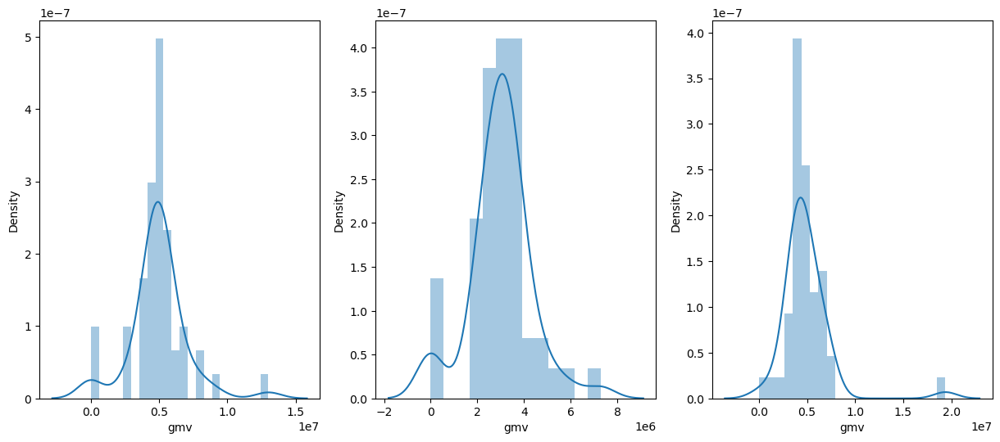

In [200]:
# Univariate analysis
plt.figure(figsize=(15,6))
plt.subplot(1,3,1)
sns.distplot(camera_accessory['gmv'],kde=True)
plt.subplot(1,3,2)
sns.distplot(gaming_accessory['gmv'],kde=True)
plt.subplot(1,3,3)
sns.distplot(home_audio['gmv'],kde=True)

<AxesSubplot:xlabel='Week', ylabel='gmv'>

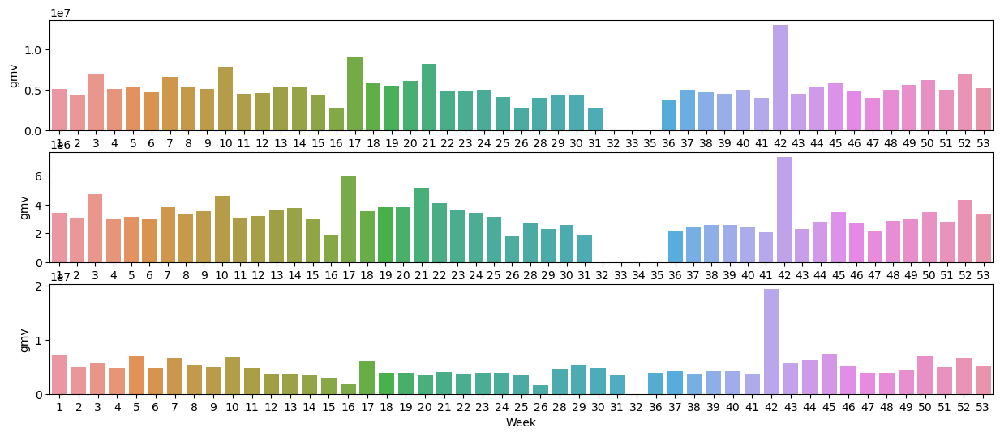

In [201]:
plt.figure(figsize=(15,6))
plt.subplot(3,1,1)
sns.barplot(camera_accessory['Week'],camera_accessory['gmv'])
plt.subplot(3,1,2)
sns.barplot(gaming_accessory['Week'],gaming_accessory['gmv'])
plt.subplot(3,1,3)
sns.barplot(home_audio['Week'],home_audio['gmv'])

In [202]:
product_category = consumer.loc[(consumer['product_analytic_sub_category'] == 'cameraaccessory')| \
                        (consumer['product_analytic_sub_category'] == 'gamingaccessory')| \
                        (consumer['product_analytic_sub_category'] == 'homeaudio')]

product_category.shape

(512838, 19)

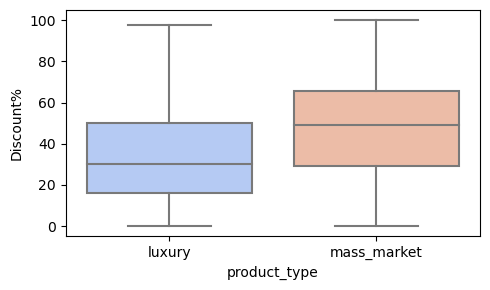

In [203]:
### Comparision of Discount% for 2 product types - Luxury and Mass Market
plt.figure(figsize=(5, 3))
sns.boxplot(x='product_type', y='Discount%', palette='coolwarm', data=product_category)
plt.tight_layout()
plt.show()

The median discount%  for luxury items is less compared to that of Mass Market Products.

This is a known trend among luxury products  to offer limited or no discounts to retain the exclusivity of their products.

## Revenue form holiday and non holiday for 3 sub category

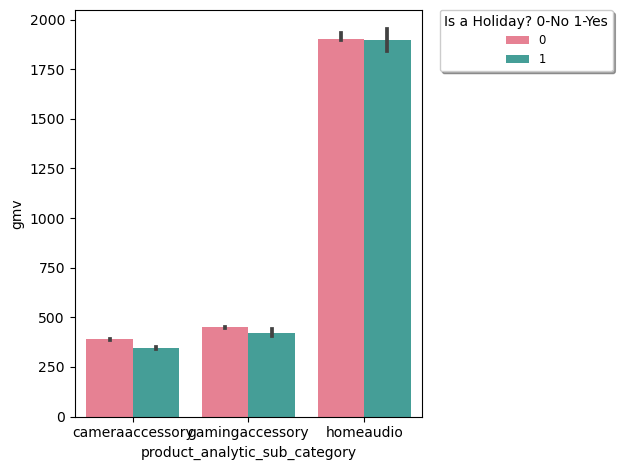

In [204]:
sns.barplot(y='gmv', x='product_analytic_sub_category', hue ='occassion_flag', \
            palette='husl', data=product_category, estimator=np.median)

# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Is a Holiday? 0-No 1-Yes', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

## No of items(Luxury/Mass-market) sold per 3 product subcategories

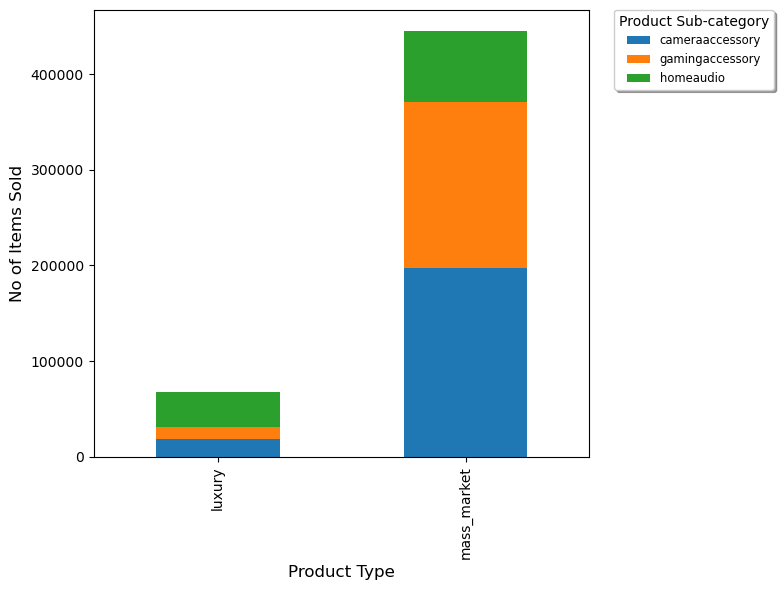

In [205]:
product_category.groupby(["product_type", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(8,6), \
                                                                                             fontsize = 10) 
# plot x axis label
plt.xlabel('Product Type', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Most of the units sold belonged to the mass market category.Among mass market products sold, Camera and Gaming Accessories related products were sold the most.
Home Audio products were the most popular among the luxury products sold

## Total items sold per 3 product subcategories per Week

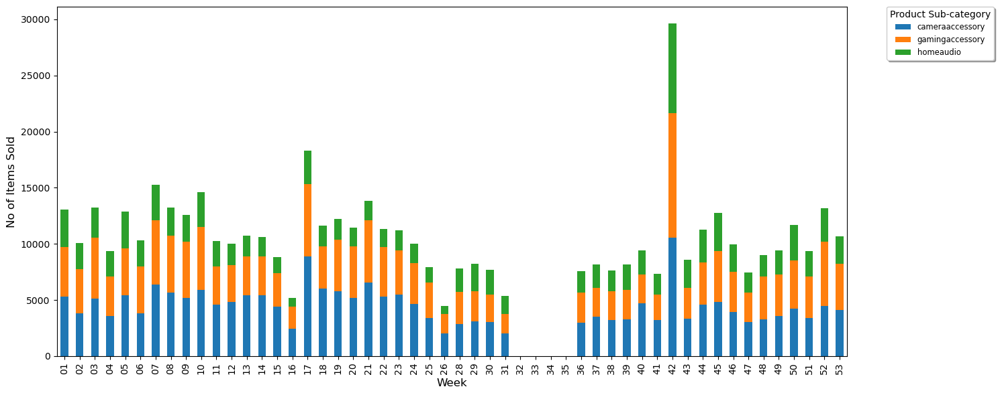

In [206]:
product_category.groupby(["Week", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', \
                                                                                             stacked=True, figsize=(15,6), \
                                                                                           fontsize = 10) 
# plot x axis label
plt.xlabel('Week', fontsize = 12)
# plot y axis label
plt.ylabel('No of Items Sold', fontsize = 12)
# plot legend
plt.legend(frameon=True, fontsize='small', shadow='True', title='Product Sub-category', \
           bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Maximum number of items are sold at 42nd week which is Thanksgiving week and October month had no sales

### Comparison of Trends of Revenue Discount% & Total Media Investment over the weeks

In [207]:
cameraaccessory = camera_accessory.copy()
gamingaccessory = gaming_accessory.copy()
homeaudio = home_audio.copy()

cameraaccessory['Week'] = cameraaccessory['Week'].apply(str)
gamingaccessory['Week'] = gamingaccessory['Week'].apply(str)
homeaudio['Week'] = homeaudio['Week'].apply(str)

In [208]:
# Segmenting the Discount% into various bins

def discount_binning(df,cut_points,label_names):
    column_index = df.columns.get_loc('Discount%') + 1
    df.insert(loc=column_index,column='Discount Bins',value=pd.cut(df['Discount%'],cut_points,labels=label_names, include_lowest=True))
    return df

cut_points = [0,10,20,30,40,50,60,70,80,90,100]
label_names = ["Below 10%","Between 10-20%","Between 20-30%","Between 30-40%","Between 40-50%","Between 50-60%", \
              "Between 60-70%","Between 70-80%","Between 80-90%","Between 90-100%"]

product_sub = discount_binning(product_category,cut_points,label_names)
product_sub.head()

,order_date,gmv,Week,list_price,Discount%,Discount Bins,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,pincode,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,payday,product_type,occassion_flag
0,2015-10-17 15:11:54,6400.0,42,6400.0,10.99,Between 10-20%,1,0,0,cod,5,-7.79175582905735E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury,0
1,2015-10-19 10:07:22,6900.0,43,6900.0,4.03,Below 10%,1,0,0,cod,7,7.33541149097431E+018,cameraaccessory,cameraaccessory,cameratripod,7190.0,0,0,luxury,0
2,2015-10-20 15:45:56,1990.0,43,1990.0,5.19,Below 10%,1,0,0,cod,10,-7.47768776228657E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0
3,2015-10-14 12:05:15,1690.0,42,1690.0,19.49,Between 10-20%,1,0,0,prepaid,4,-5.83593163877661E+018,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0
4,2015-10-17 21:25:03,1618.0,42,1618.0,22.92,Between 20-30%,1,0,0,prepaid,6,5.34735360997242E+017,cameraaccessory,cameraaccessory,cameratripod,2099.0,3,0,mass_market,0


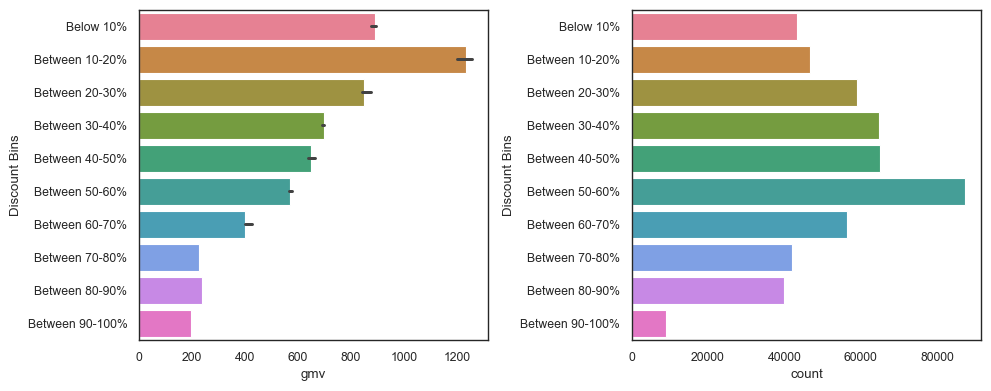

In [209]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("white") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

# subplot 1
plt.subplot(1, 2, 1)
sns.barplot(x='gmv', y='Discount Bins', palette='husl', data=product_sub, estimator=np.median)

# subplot 2
plt.subplot(1, 2, 2)
sns.countplot(y='Discount Bins', palette='husl', data=product_sub)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Median Revenue is maximum when Average discount% is between 10-20%. But beyond that, average revenue slowly starts to decline.

The sales on the other hand shows a steady increase with increase in Discount percentage till it peaks at 50-60% after which it starts to fall again.

This shows that at higher discount, although the sales are good, the revenue collapses signifying a loss for the company. An average discount of 10-20% is the most profitable for the company.

## Pair plot

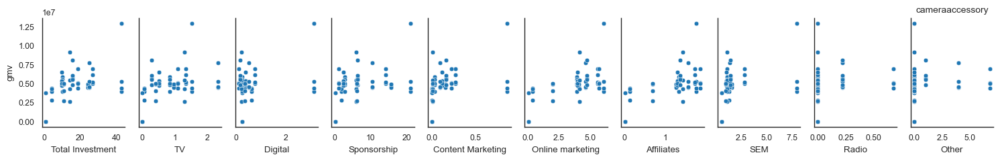

In [210]:
sns.pairplot(cameraaccessory, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',aspect=0.6)
plt.title('cameraaccessory', fontsize = 10)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'gamingaccessory')

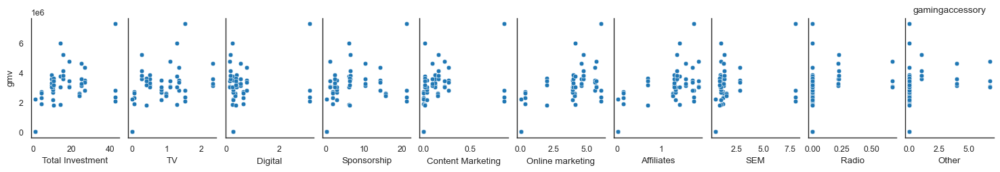

In [211]:
sns.pairplot(gamingaccessory, x_vars=['Total Investment',"TV" ,'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv', aspect=0.6)
plt.title('gamingaccessory', fontsize = 10)

Text(0.5, 1.0, 'homeaudio')

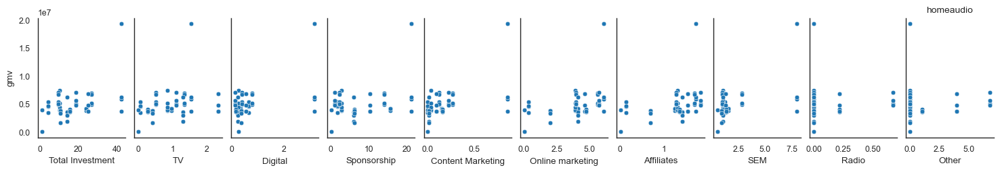

In [212]:

sns.pairplot(homeaudio, x_vars=['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', \
                                      'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'], \
             y_vars='gmv',aspect=0.6)
plt.title('homeaudio', fontsize = 10)


In [213]:
rev_ad_columns = ['gmv','Total Investment', 'Total Investment_SMA_3', 'Total Investment_SMA_5', 'Total Investment_EMA_8', \
                  'Total_Investment_Ads', 'TV', 'TV_SMA_3', 'TV_SMA_5', 'TV_EMA_8', 'TV_ads', 'Digital', \
                  'Digital_SMA_3', 'Digital_SMA_5', 'Digital_EMA_8', 'Digital_ads', 'Sponsorship', 'Sponsorship_SMA_3', \
                  'Sponsorship_SMA_5', 'Sponsorship_EMA_8', 'Sponsorship_ads', 'Content Marketing', \
                  'Content Marketing_SMA_3','Content Marketing_SMA_5','Content Marketing_EMA_8', 'Content_Marketing_ads', \
                  'Online marketing', 'Online marketing_SMA_3', 'Online marketing_SMA_5', 'Online marketing_EMA_8', \
                  'Online_marketing_ads', 'Affiliates', 'Affiliates_SMA_3', 'Affiliates_SMA_5', 'Affiliates_EMA_8', \
                  'Affiliates_ads', 'SEM', 'SEM_SMA_3', 'SEM_SMA_5', 'SEM_EMA_8', 'SEM_ads', 'Radio', 'Radio_SMA_3', \
                  'Radio_SMA_5', 'Radio_EMA_8', 'Radio_ads', 'Other', 'Other_SMA_3', 'Other_SMA_5', 'Other_EMA_8', \
                  'Other_ads']

In [214]:
cameraaccessory_ad = cameraaccessory[rev_ad_columns]
gamingaccessory_ad = gamingaccessory[rev_ad_columns]
homeaudio_ad = homeaudio[rev_ad_columns]
homeaudio_ad.head()

,gmv,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads
26,4.573783e+06,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,5.371525e+06,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,4.679828e+06,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,3.451151e+06,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
30,2.599000e+03,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Relationship between Revenue and Various Ad Spends for Camera Accessories,Gaming Accessory,Homeaudio

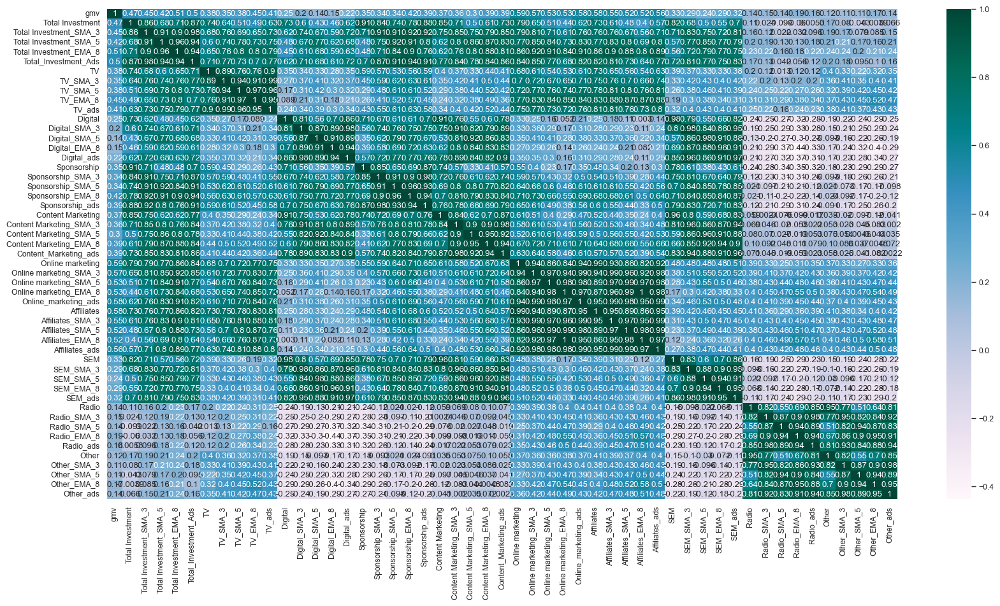

In [215]:
plt.figure(figsize=(20,10))
cam_cor = cameraaccessory_ad.corr()
sns.heatmap(cam_cor, cmap="PuBuGn", annot=True)
plt.show()

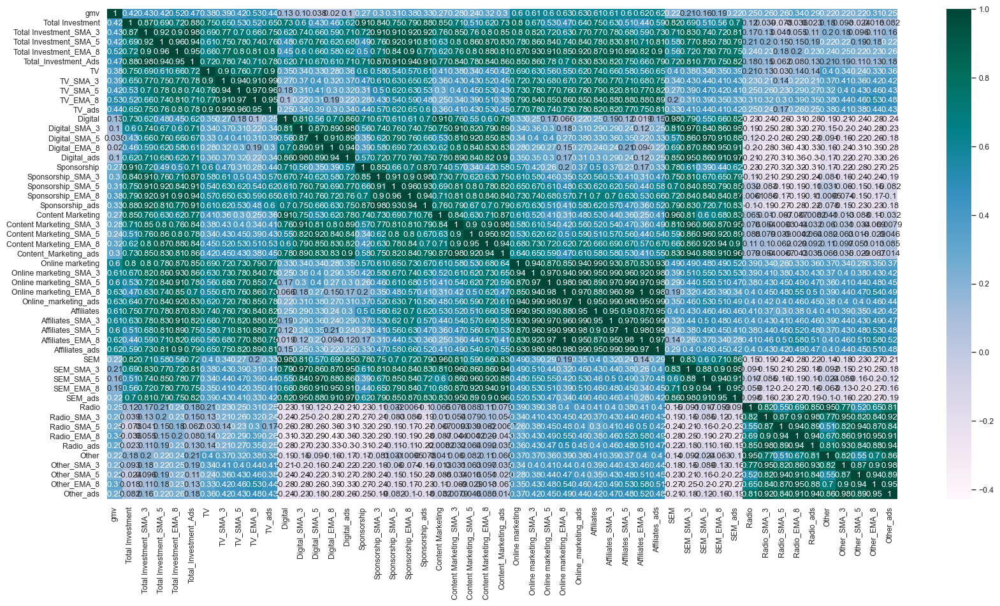

In [216]:
plt.figure(figsize=(20,10))
gam_cor = gamingaccessory_ad.corr()
sns.heatmap(gam_cor, cmap="PuBuGn", annot=True)
plt.show()

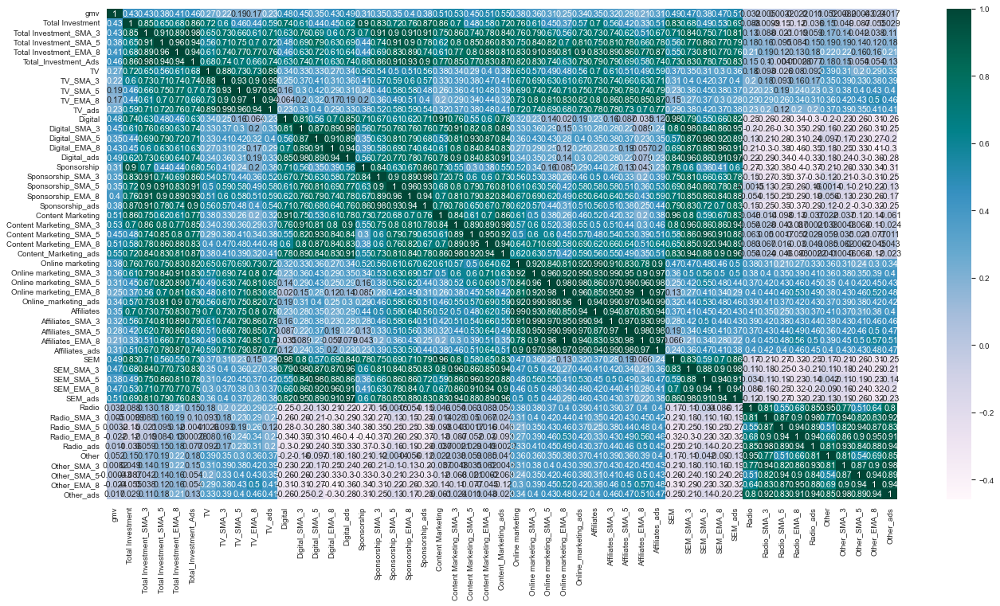

In [217]:
plt.figure(figsize=(20,10), dpi=80, facecolor='w', edgecolor='k', frameon='True')
ha_cor = homeaudio_ad.corr()
sns.heatmap(ha_cor, cmap="PuBuGn", annot=True)
plt.show()

# Model Building

## Additive model / Linear model

In [218]:
# Making a copy of original data frame
cameraaccessory_df = camera_accessory.copy()
gamingaccessory_df = gaming_accessory.copy()
homeaudio_df = home_audio.copy()


In [219]:
# removing columns
cameraaccessory_df = cameraaccessory_df.drop('Week', axis=1)
gamingaccessory_df = gamingaccessory_df.drop('Week', axis=1)
homeaudio_df = homeaudio_df.drop('Week', axis=1)

## Standard scaling

In [220]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

cameraaccessory_df[cameraaccessory_df.columns]=scaler.fit_transform(cameraaccessory_df[cameraaccessory_df.columns])
gamingaccessory_df[gamingaccessory_df.columns]=scaler.fit_transform(gamingaccessory_df[gamingaccessory_df.columns])
homeaudio_df[homeaudio_df.columns]=scaler.fit_transform(homeaudio_df[homeaudio_df.columns])

cameraaccessory_df.head()

,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_cameraaccessory,product_vertical_camerabag,product_vertical_camerabattery,product_vertical_camerabatterycharger,product_vertical_camerabatterygrip,product_vertical_cameraeyecup,product_vertical_camerafilmrolls,product_vertical_camerahousing,product_vertical_cameraledlight,product_vertical_cameramicrophone,product_vertical_cameramount,product_vertical_cameraremotecontrol,product_vertical_cameratripod,product_vertical_extensiontube,product_vertical_filter,product_vertical_flash,product_vertical_flashshoeadapter,product_vertical_lens,product_vertical_reflectorumbrella,product_vertical_softbox,product_vertical_strap,product_vertical_teleconverter,product_vertical_telescope,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Sale
26,-0.483614,-0.571922,-0.613525,-0.613548,0.981717,0.286694,-0.698501,-0.766668,0.404372,0.162171,0.005696,-0.419816,2.503645,-0.696949,-1.295712,-0.410913,-0.25,-0.547723,-1.157052,0.722171,-0.424407,-0.897793,-0.040034,-1.223170,-0.202031,-0.454396,-0.191273,-0.423587,-1.329643,-0.141421,-1.010950,-0.554700,-0.524404,-1.153423,-1.651039,-1.722546,-1.655655,-1.671382,-1.269718,-1.439392,-1.513289,-1.675105,-1.539651,0.072799,-0.822090,-0.903993,0.086034,-0.547507,-0.849181,-1.241670,-1.329476,-1.307026,-1.271662,-0.708587,-0.807929,-0.927046,-1.166068,-0.932766,-1.868705,-2.048242,-2.022281,-1.951209,-2.047320,-1.904259,-2.109596,-2.047155,-1.919449,-2.067569,-0.277650,-1.038692,-1.131574,-0.491193,-0.873648,-0.484056,-0.565926,-0.673291,-0.820381,-0.6639,-0.467595,-0.547182,-0.651917,-0.797607,-0.643359,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,-0.280683,-0.527963,-0.613525,-0.613548,0.193205,0.372968,-0.615281,-0.662369,-0.274015,0.328890,0.222707,-0.406122,0.451550,-0.696949,-1.295712,-0.410913,-0.25,-0.547723,-0.673366,0.742980,-0.280667,-0.897793,-0.316606,-1.221827,-0.202031,-0.338697,-0.191273,-0.423587,-0.521485,-0.141421,-0.658212,1.802776,-0.524404,-1.153423,-1.651039,-1.722546,-1.655655,-1.553615,-1.269718,-1.439392,-1.513289,-1.675105,-1.515784,0.072799,-0.822090,-0.903993,0.086034,-0.281317,-0.849181,-1.241670,-1.329476,-1.307026,-1.180805,-0.708587,-0.807929,-0.927046,-1.166068,-0.932766,-1.868705,-2.048242,-2.022281,-1.951209,-2.001925,-1.904259,-2.109596,-2.047155,-1.919449,-2.007131,-0.277650,-1.038692,-1.131574,-0.491193,-0.662028,-0.484056,-0.565926,-0.673291,-0.820381,-0.6639,-0.467595,-0.547182,-0.651917,-0.797607,-0.643359,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,-0.291249,-0.615784,-0.611887,-0.611798,0.220227,0.515732,-0.601858,-0.676275,0.540049,-0.113278,0.296211,-0.118547,1.135582,-0.696949,-1.295712,-0.410913,-0.25,-0.547723,-0.949758,0.035497,-0.352537,-0.897793,-0.316606,-1.216459,-0.202031,-0.191728,-0.191273,-0.423587,-0.594954,-0.141421,-0.187896,-0.554700,-0.524404,-1.153423,-1.218628,-1.722546,-1.655655,-1.482955,-1.269718,-1.349080,-1.513289,-1.675105,-1.501463,0.072799,0.111743,-0.903993,0.086034,-0.121603,-0.849181,-0.912837,-1.329476,-1.307026,-1.126291,-0.708587,-0.807929,-0.927046,-1.166068,-0.932766,-1.868705,-1.866939,-2.022281,-1.951209,-1.974687,-1.904259,-1.866056,-2.047155,-1.919449,-1.970869,-0.277650,-0.28698

## Splitting the 3 Dataframes into Train and Test Data Sets


In [221]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

cameraaccessory_train, cameraaccessory_test = train_test_split(cameraaccessory_df, train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_train, gamingaccessory_test = train_test_split(gamingaccessory_df,train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_train, homeaudio_test = train_test_split(homeaudio_df,train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 datasets into X and Y for train sets

In [222]:
y_cameraaccessory_train = cameraaccessory_train.pop('gmv')
X_cameraaccessory_train = cameraaccessory_train

y_gamingaccessory_train = gamingaccessory_train.pop('gmv')
X_gamingaccessory_train = gamingaccessory_train

y_homeaudio_train = homeaudio_train.pop('gmv')
X_homeaudio_train = homeaudio_train


## Dividing the 3 datasets into X and Y for test sets

In [223]:
y_cameraaccessory_test = cameraaccessory_test.pop('gmv')
X_cameraaccessory_test = cameraaccessory_test

y_gamingaccessory_test = gamingaccessory_test.pop('gmv')
X_gamingaccessory_test = gamingaccessory_test

y_homeaudio_test = homeaudio_test.pop('gmv')
X_homeaudio_test = homeaudio_test

# Linear regression

## Linaer regression - camera accessories

In [224]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [225]:
camera_model = LinearRegression().fit(X_cameraaccessory_train,y_cameraaccessory_train)
y_camera_test_predit = camera_model.predict(X_cameraaccessory_test)
print('R2 Score: {}'.format(r2_score(y_cameraaccessory_test, y_camera_test_predit)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_test, y_camera_test_predit)))

R2 Score: 0.851297346484767
Mean Squared Error: 0.12122272641624492


## Linaer regression using k-flod cross validation - camera accessories


In [226]:
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

In [227]:
y_cameraaccessory = cameraaccessory_df.pop('gmv')
X_cameraaccessory = cameraaccessory_df

In [228]:
X_cameraaccessory = cameraaccessory_df

In [229]:
camera_model_cv = LinearRegression().fit(X_cameraaccessory, y_cameraaccessory)
camera_pred_cv = cross_val_predict(camera_model_cv, X_cameraaccessory, y_cameraaccessory, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory, camera_pred_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory, camera_pred_cv)))

Cross-Predicted Accuracy: 0.5851730824669302
Mean Squared Error: 0.4148269175330697


## Determining Feature Importance for cameraaccessory

In [230]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 100)


In [231]:

cameraaccessory_lr_model_parameters = list(camera_model.coef_)
cameraaccessory_lr_model_parameters.insert(0, camera_model.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))
cameraaccessory_lr_coef

[('constant', 0.01),
 ('Discount%', -0.009),
 ('deliverybdays', -0.079),
 ('deliverycdays', -0.077),
 ('sla', -0.003),
 ('product_procurement_sla', -0.03),
 ('is_cod', 0.03),
 ('is_mass_market', 0.009),
 ('product_vertical_cameraaccessory', 0.057),
 ('product_vertical_camerabag', 0.096),
 ('product_vertical_camerabattery', 0.241),
 ('product_vertical_camerabatterycharger', -0.128),
 ('product_vertical_camerabatterygrip', -0.013),
 ('product_vertical_cameraeyecup', 0.127),
 ('product_vertical_camerafilmrolls', -0.28),
 ('product_vertical_camerahousing', 0.197),
 ('product_vertical_cameraledlight', -0.157),
 ('product_vertical_cameramicrophone', 0.11),
 ('product_vertical_cameramount', 0.155),
 ('product_vertical_cameraremotecontrol', -0.014),
 ('product_vertical_cameratripod', 0.011),
 ('product_vertical_extensiontube', 0.114),
 ('product_vertical_filter', -0.024),
 ('product_vertical_flash', 0.002),
 ('product_vertical_flashshoeadapter', 0.028),
 ('product_vertical_lens', 0.673),
 ('pr

In [232]:
cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
25,product_vertical_lens,0.673
54,Content Marketing_SMA_3,0.260
10,product_vertical_camerabattery,0.241
49,Sponsorship_SMA_3,0.223
15,product_vertical_camerahousing,0.197
73,Radio,0.158
58,Online marketing,0.157
18,product_vertical_cameramount,0.155
46,Digital_EMA_8,0.153
71,SEM_EMA_8,0.146


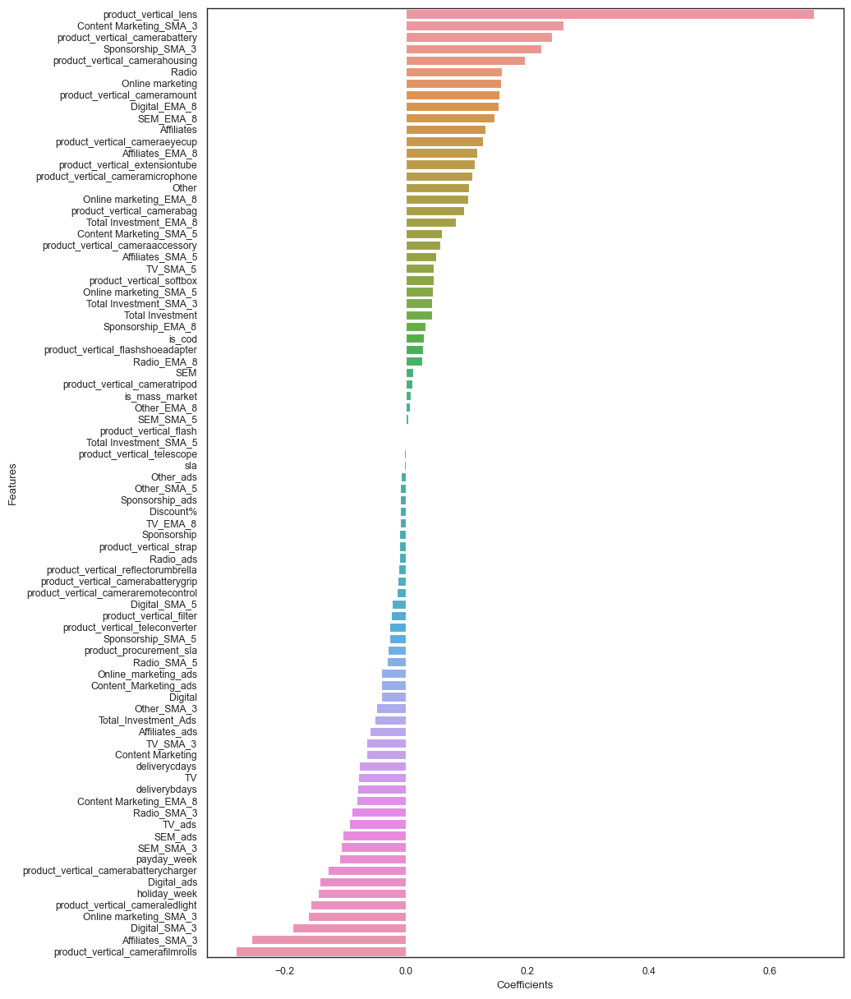

In [233]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_lr_coef_df)
plt.show()

In [234]:
# Top 5 important features affecting GMV - Home audio(LR)
cameraaccessory_lr_coef_df.head()

,Features,Coefficients
25,product_vertical_lens,0.673
54,Content Marketing_SMA_3,0.260
10,product_vertical_camerabattery,0.241
49,Sponsorship_SMA_3,0.223
15,product_vertical_camerahousing,0.197


## Gaming Accessory

In [235]:
y_gamingaccessory = gamingaccessory_df.pop('gmv')
X_gamingaccessory = gamingaccessory_df

In [236]:
gaming_model = LinearRegression().fit(X_gamingaccessory_train,y_gamingaccessory_train)
y_gaming_test_predit = gaming_model.predict(X_gamingaccessory_test)
print('R2 Score: {}'.format(r2_score(y_gamingaccessory_test, y_gaming_test_predit)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_test, y_gaming_test_predit)))

R2 Score: 0.8801608883653259
Mean Squared Error: 0.10487132645626313


## Linaer regression using k-flod cross validation - Gaming accessories

In [237]:
gaming_model_cv = LinearRegression().fit(X_gamingaccessory,y_gamingaccessory)
gaming_pred_cv = cross_val_predict(gaming_model_cv,X_gamingaccessory,y_gamingaccessory, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory, gaming_pred_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory, gaming_pred_cv)))


Cross-Predicted Accuracy: -0.22149370801698143
Mean Squared Error: 1.2214937080169812


## Determining Feature Importance for Gaming accessory

In [238]:
gamingaccessory_lr_model_parameters = list(gaming_model_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gaming_model_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))
gamingaccessory_lr_coef

[('constant', 0.0),
 ('Discount%', -0.053),
 ('deliverybdays', 0.0),
 ('deliverycdays', -0.248),
 ('sla', -0.005),
 ('product_procurement_sla', 0.013),
 ('is_cod', -0.449),
 ('is_mass_market', -0.51),
 ('product_vertical_cameraaccessory', -0.004),
 ('product_vertical_camerabag', 0.481),
 ('product_vertical_camerabattery', -0.105),
 ('product_vertical_camerabatterycharger', -0.084),
 ('product_vertical_camerabatterygrip', -0.078),
 ('product_vertical_cameraeyecup', 0.591),
 ('product_vertical_camerafilmrolls', 0.099),
 ('product_vertical_camerahousing', 0.232),
 ('product_vertical_cameraledlight', 0.291),
 ('product_vertical_cameramicrophone', 0.408),
 ('product_vertical_cameramount', 0.001),
 ('product_vertical_cameraremotecontrol', 0.542),
 ('product_vertical_cameratripod', 0.107),
 ('product_vertical_extensiontube', -0.036),
 ('product_vertical_filter', -0.07),
 ('product_vertical_flash', 0.133),
 ('product_vertical_flashshoeadapter', -0.196),
 ('product_vertical_lens', 0.051),
 ('pr

In [239]:
gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_lr_coef_df

,Features,Coefficients
64,Affiliates_SMA_3,1.634
35,Total Investment_SMA_5,1.464
37,Total_Investment_Ads,1.325
34,Total Investment_SMA_3,1.274
49,Sponsorship_SMA_3,1.096
48,Sponsorship,0.975
38,TV,0.865
68,SEM,0.778
29,product_vertical_teleconverter,0.751
66,Affiliates_EMA_8,0.646


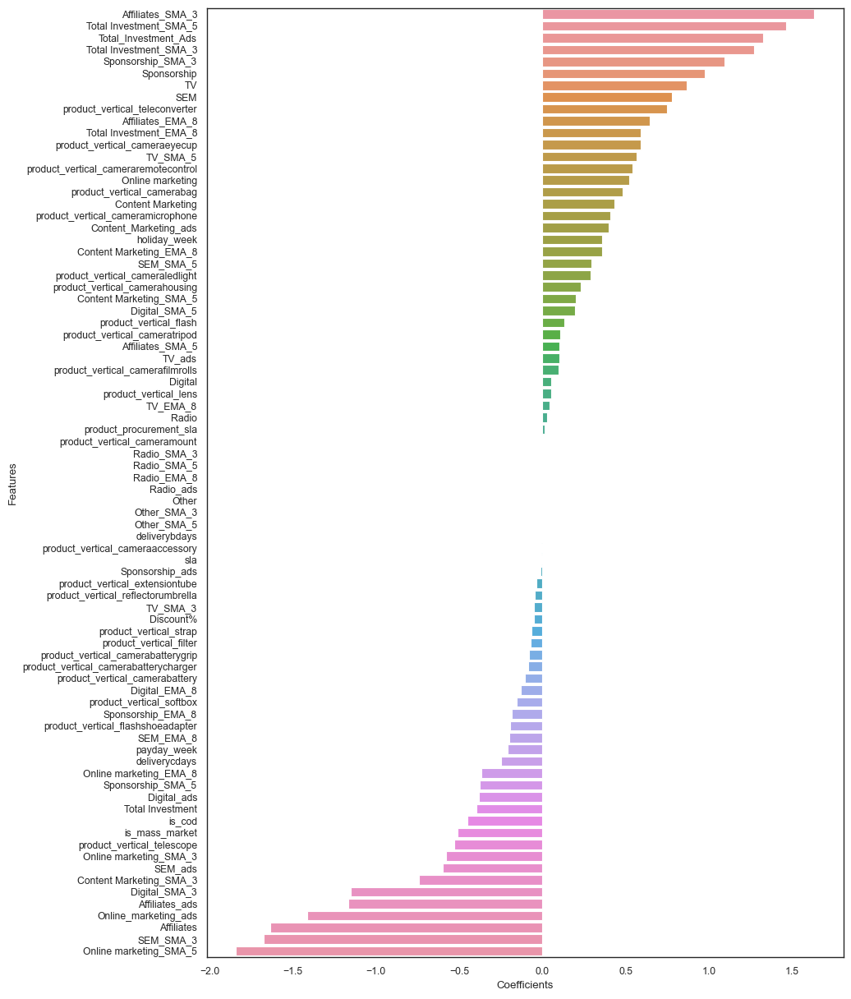

In [240]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_lr_coef_df)
plt.show()

In [241]:
# Top 5 important features affecting GMV - Home audio(LR)
gamingaccessory_lr_coef_df.head()

,Features,Coefficients
64,Affiliates_SMA_3,1.634
35,Total Investment_SMA_5,1.464
37,Total_Investment_Ads,1.325
34,Total Investment_SMA_3,1.274
49,Sponsorship_SMA_3,1.096


## Home Audio

In [242]:
y_homeaudio = homeaudio_df.pop('gmv')
X_homeaudio = homeaudio_df

In [243]:
homeaudio_model = LinearRegression().fit(X_homeaudio_train,y_homeaudio_train)
y_homeaudio_test_predit = homeaudio_model.predict(X_homeaudio_test)
print('R2 Score: {}'.format(r2_score(y_homeaudio_test, y_homeaudio_test_predit)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_test, y_homeaudio_test_predit)))

R2 Score: 0.9112293748597607
Mean Squared Error: 0.21110328584862303


## Linaer regression using k-flod cross validation - Home Audio

In [244]:
homeaudio_model_cv = LinearRegression().fit(X_homeaudio, y_homeaudio)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model_cv, X_homeaudio, y_homeaudio, cv=10)
accuracy = metrics.r2_score(y_homeaudio, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.5040904883286963
Mean Squared Error: 0.49590951167130365


In [245]:
homeaudio_lr_model_parameters = list(homeaudio_model_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model_cv.intercept_)
homeaudiolr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))
homeaudio_lr_coef

[('constant', 1.3522035115416803e-15),
 ('Discount%', -0.16897179448267652),
 ('deliverybdays', -0.7679960204166262),
 ('deliverycdays', 0.6343285795969866),
 ('sla', -0.14497494957757345),
 ('product_procurement_sla', 0.021119830889966384),
 ('is_cod', -0.6289743861361589),
 ('is_mass_market', -0.10712182392026387),
 ('product_vertical_djcontroller', 0.040369978193821356),
 ('product_vertical_dock', -0.0009199006573885754),
 ('product_vertical_dockingstation', 0.06047769814431904),
 ('product_vertical_fmradio', 0.5361720059830792),
 ('product_vertical_hifisystem', -0.16802510476189797),
 ('product_vertical_homeaudiospeaker', 1.4930906566960935),
 ('product_vertical_karaokeplayer', -0.052133170870262174),
 ('product_vertical_slingbox', -0.06401573706076387),
 ('product_vertical_soundmixer', 0.025713161070362867),
 ('product_vertical_voicerecorder', -0.15459524241464057),
 ('payday_week', -0.025540426470389843),
 ('holiday_week', -0.06012410702190227),
 ('Total Investment', 0.1332864108

In [246]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
13,product_vertical_homeaudiospeaker,1.493091
54,Affiliates_ads,1.212618
55,SEM,0.882674
57,SEM_SMA_5,0.851958
49,Online_marketing_ads,0.729362
47,Online marketing_SMA_5,0.665489
58,SEM_EMA_8,0.655739
3,deliverycdays,0.634329
11,product_vertical_fmradio,0.536172
63,Radio_EMA_8,0.510384


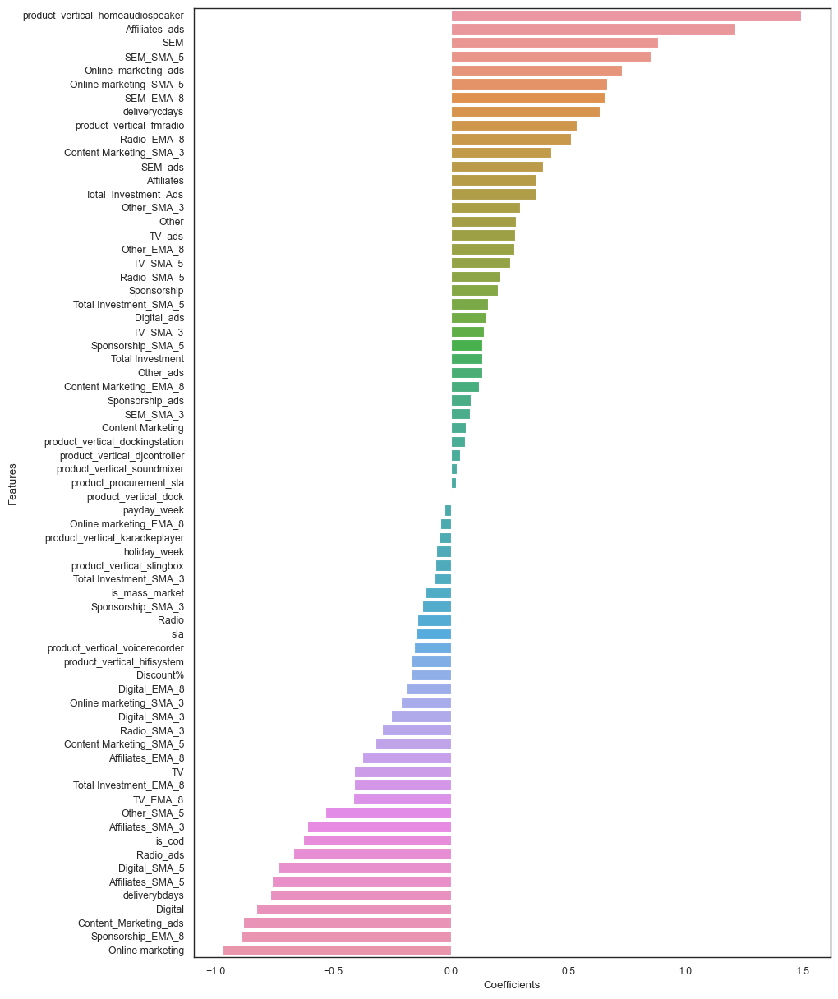

In [247]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=homeaudio_lr_coef_df)
plt.show()

In [248]:
# Top 5 important features affecting GMV - Home audio(LR)
homeaudio_lr_coef_df.head()

,Features,Coefficients
13,product_vertical_homeaudiospeaker,1.493091
54,Affiliates_ads,1.212618
55,SEM,0.882674
57,SEM_SMA_5,0.851958
49,Online_marketing_ads,0.729362


# Linear regression - Multiplicative Model 
Taking logarithms of the data for both dependent and independent variable, then analyse the log data as before.

In [249]:
# Making copy of dataframes from the original ones
cameraaccessory_multi = camera_accessory.copy()
gamingaccessory_multi = gaming_accessory.copy()
homeaudio_multi = home_audio.copy()
homeaudio_multi .head()

,Week,gmv,Discount%,deliverybdays,deliverycdays,sla,product_procurement_sla,is_cod,is_mass_market,product_vertical_djcontroller,product_vertical_dock,product_vertical_dockingstation,product_vertical_fmradio,product_vertical_hifisystem,product_vertical_homeaudiospeaker,product_vertical_karaokeplayer,product_vertical_slingbox,product_vertical_soundmixer,product_vertical_voicerecorder,payday_week,holiday_week,Total Investment,Total Investment_SMA_3,Total Investment_SMA_5,Total Investment_EMA_8,Total_Investment_Ads,TV,TV_SMA_3,TV_SMA_5,TV_EMA_8,TV_ads,Digital,Digital_SMA_3,Digital_SMA_5,Digital_EMA_8,Digital_ads,Sponsorship,Sponsorship_SMA_3,Sponsorship_SMA_5,Sponsorship_EMA_8,Sponsorship_ads,Content Marketing,Content Marketing_SMA_3,Content Marketing_SMA_5,Content Marketing_EMA_8,Content_Marketing_ads,Online marketing,Online marketing_SMA_3,Online marketing_SMA_5,Online marketing_EMA_8,Online_marketing_ads,Affiliates,Affiliates_SMA_3,Affiliates_SMA_5,Affiliates_EMA_8,Affiliates_ads,SEM,SEM_SMA_3,SEM_SMA_5,SEM_EMA_8,SEM_ads,Radio,Radio_SMA_3,Radio_SMA_5,Radio_EMA_8,Radio_ads,Other,Other_SMA_3,Other_SMA_5,Other_EMA_8,Other_ads,NPS,NPS_SMA_3,NPS_SMA_5,Stock Index,Stock Index_SMA_3,Stock Index_SMA_5,Sale
26,28,4.573783e+06,31.450813,0.0,0.0,7.369201,2.863223,1583,1366,8,33,1,516.0,23,1374.0,0,0,0,63,0,0,4.265,0.000,0.0000,4.265000,4.265000,0.054,0.000000,0.0000,0.054000,0.054000,0.633,0.000000,0.0000,0.633000,0.633000,1.854,0.000,0.0000,1.854000,1.854000,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.332000,0.137,0.000000,0.0000,0.137000,0.137000,1.256,0.000,0.0000,1.256000,1.256000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
27,29,5.371525e+06,32.966657,0.0,0.0,6.984861,2.746318,1868,1610,7,50,1,574.0,42,1623.0,0,0,0,69,1,0,4.265,0.000,0.0000,4.265000,6.824000,0.054,0.000000,0.0000,0.054000,0.086400,0.633,0.000000,0.0000,0.633000,1.012800,1.854,0.000,0.0000,1.854000,2.966400,0.0,0.0,0.0,0.0,0.0,0.332,0.000,0.0000,0.332,0.531200,0.137,0.000000,0.0000,0.137000,0.219200,1.256,0.000,0.0000,1.256000,2.009600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
28,30,4.679828e+06,32.357350,0.0,0.0,7.071749,2.860538,1758,1569,4,56,0,577.0,36,1430.0,0,0,0,46,0,0,4.265,4.265,0.0000,4.265000,8.359400,0.054,0.054000,0.0000,0.054000,0.105840,0.633,0.633000,0.0000,0.633000,1.240680,1.854,1.854,0.0000,1.854000,3.633840,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.650720,0.137,0.137000,0.0000,0.137000,0.268520,1.256,1.256,0.0000,1.256000,2.461760,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
29,31,3.451151e+06,32.207530,0.0,0.0,7.200750,2.734834,1244,1072,2,43,0,420.0,20,1025.0,0,0,0,44,0,0,4.265,4.265,0.0000,4.265000,9.280640,0.054,0.054000,0.0000,0.054000,0.117504,0.633,0.633000,0.0000,0.633000,1.377408,1.854,1.854,0.0000,1.854000,4.034304,0.0,0.0,0.0,0.0,0.0,0.332,0.332,0.0000,0.332,0.722432,0.137,0.137000,0.0000,0.137000,0.298112,1.256,1.256,0.0000,1.256000,2.733056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
30,32,2.599000e+03,16.130000,0.0,0.0,9.000000,2.000000,0,0,0,0,0,0.0,0,1.0,0,0,0,0,0,0,1.013,3.181,3.6146,3.542333,6.581384,0.001,0.036333,0.0434,0.042222,0.071502,0.256,0.507333,0.5576,0.549222,1.082445,0.213,1.307,1.5258,1.489333,2.633582,0.0,0.0,0.0,0.0,0.0,0.026,0.230,0.2708,0.264,0.459459,0.015,0.096333,0.1126,0.109889,0.193867,0.503,1.005,1.1054,1.088667,2.142834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [250]:
# removing columns
cameraaccessory_multi = cameraaccessory_multi.drop('Week', axis=1)
gamingaccessory_multi = gamingaccessory_multi.drop('Week', axis=1)
homeaudio_multi = homeaudio_multi.drop('Week', axis=1)

### Taking Logarithm of both the Dependent and the independent variables

##### After taking log, all 0 values will be transformed to `inf`. Retransforming these values to 0.

In [251]:
cameraaccessory_multi = cameraaccessory_multi.applymap(lambda x: np.log(x))
cameraaccessory_multi = cameraaccessory_multi.replace([np.inf, -np.inf], 0)
cameraaccessory_multi = cameraaccessory_multi.replace(np.nan, 0)

gamingaccessory_multi = gamingaccessory_multi.applymap(lambda x: np.log(x))
gamingaccessory_multi = gamingaccessory_multi.replace([np.inf, -np.inf], 0)
gamingaccessory_multi = gamingaccessory_multi.replace(np.nan, 0)

homeaudio_multi = homeaudio_multi.applymap(lambda x: np.log(x))
homeaudio_multi = homeaudio_multi.replace([np.inf, -np.inf], 0)
homeaudio_multi = homeaudio_multi.replace(np.nan, 0)


## Scaling- Standard scaler

In [252]:
cameraaccessory_multi[cameraaccessory_multi.columns]=scaler.fit_transform(cameraaccessory_multi[cameraaccessory_multi.columns])
gamingaccessory_multi[gamingaccessory_multi.columns]=scaler.fit_transform(gamingaccessory_multi[gamingaccessory_multi.columns])
homeaudio_multi[homeaudio_multi.columns]=scaler.fit_transform(homeaudio_multi[homeaudio_multi.columns])


## Train and Test split

In [253]:

cameraaccessory_multi_train, cameraaccessory_multi_test = train_test_split(cameraaccessory_multi,train_size = 0.7, test_size = 0.3, random_state = 100)
                                                               

gamingaccessory_multi_train, gamingaccessory_multi_test = train_test_split(gamingaccessory_multi, train_size = 0.7, test_size = 0.3, random_state = 100)
                                                               

homeaudio_multi_train, homeaudio_multi_test = train_test_split(homeaudio_multi, train_size = 0.7, test_size = 0.3, random_state = 100)

In [254]:
y_cameraaccessory_multi_train = cameraaccessory_multi_train.pop('gmv')
X_cameraaccessory_multi_train = cameraaccessory_multi_train

y_gamingaccessory_multi_train = gamingaccessory_multi_train.pop('gmv')
X_gamingaccessory_multi_train = gamingaccessory_multi_train

y_homeaudio_multi_train = homeaudio_multi_train.pop('gmv')
X_homeaudio_multi_train = homeaudio_multi_train



In [255]:
y_cameraaccessory_multi_test = cameraaccessory_multi_test.pop('gmv')
X_cameraaccessory_multi_test = cameraaccessory_multi_test

y_gamingaccessory_multi_test = gamingaccessory_multi_test.pop('gmv')
X_gamingaccessory_multi_test = gamingaccessory_multi_test

y_homeaudio_multi_test = homeaudio_multi_test.pop('gmv')
X_homeaudio_multi_test = homeaudio_multi_test


## Linear Regression model(Multplicative)  - cameraaccessory

In [256]:
cameraaccessory_multi_model = LinearRegression().fit(X_cameraaccessory_multi_train, y_cameraaccessory_multi_train)
y_cameraaccessory_multi_test_pred = cameraaccessory_multi_model.predict(X_cameraaccessory_multi_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_multi_test, y_cameraaccessory_multi_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_multi_test, y_cameraaccessory_multi_test_pred)))

R2 Score: 0.6714127232941784
Mean Squared Error: 0.6971591687597534


## K flod cross validation

In [257]:
y_cameraaccessory_multi = cameraaccessory_multi.pop('gmv')
X_cameraaccessory_multi = cameraaccessory_multi

In [258]:
cameraaccessory_multi_model_cv = LinearRegression().fit(X_cameraaccessory_multi, y_cameraaccessory_multi)
cameraaccessory_multi_predictions_cv = cross_val_predict(cameraaccessory_multi_model_cv, X_cameraaccessory_multi,
                                                       y_cameraaccessory_multi, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_multi, cameraaccessory_multi_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_multi, cameraaccessory_multi_predictions_cv)))

Cross-Predicted Accuracy: 0.9074612961575004
Mean Squared Error: 0.0925387038424996


In [259]:
cameraaccessory_multi_lr_model_parameters = list(cameraaccessory_multi_model_cv.coef_)
cameraaccessory_multi_lr_model_parameters.insert(0, cameraaccessory_multi_model_cv.intercept_)
cameraaccessory_multi_lr_model_parameters = [round(x, 3) for x in cameraaccessory_multi_lr_model_parameters]
cols = X_cameraaccessory_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_multi_lr_coef = list(zip(cols, cameraaccessory_multi_lr_model_parameters))
cameraaccessory_multi_lr_coef

[('constant', -0.0),
 ('Discount%', -0.081),
 ('deliverybdays', -0.082),
 ('deliverycdays', 0.033),
 ('sla', -0.045),
 ('product_procurement_sla', 0.007),
 ('is_cod', -0.042),
 ('is_mass_market', 0.14),
 ('product_vertical_cameraaccessory', 0.072),
 ('product_vertical_camerabag', -0.088),
 ('product_vertical_camerabattery', 0.395),
 ('product_vertical_camerabatterycharger', 0.125),
 ('product_vertical_camerabatterygrip', -0.099),
 ('product_vertical_cameraeyecup', 0.104),
 ('product_vertical_camerafilmrolls', -0.051),
 ('product_vertical_camerahousing', 0.002),
 ('product_vertical_cameraledlight', -0.0),
 ('product_vertical_cameramicrophone', 0.015),
 ('product_vertical_cameramount', -0.012),
 ('product_vertical_cameraremotecontrol', 0.156),
 ('product_vertical_cameratripod', -0.066),
 ('product_vertical_extensiontube', 0.04),
 ('product_vertical_filter', 0.032),
 ('product_vertical_flash', -0.138),
 ('product_vertical_flashshoeadapter', -0.0),
 ('product_vertical_lens', 0.441),
 ('pro

In [260]:
cameraaccessory_multi_lr_coef_df = pd.DataFrame(cameraaccessory_multi_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_multi_lr_coef_df = cameraaccessory_multi_lr_coef_df.rename(columns=col_rename)
cameraaccessory_multi_lr_coef_df = cameraaccessory_multi_lr_coef_df.iloc[1:,:]
cameraaccessory_multi_lr_coef_df = cameraaccessory_multi_lr_coef_df.loc[cameraaccessory_multi_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_multi_lr_coef_df = cameraaccessory_multi_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_multi_lr_coef_df

,Features,Coefficients
25,product_vertical_lens,0.441
10,product_vertical_camerabattery,0.395
28,product_vertical_strap,0.189
19,product_vertical_cameraremotecontrol,0.156
79,Other_SMA_3,0.152
7,is_mass_market,0.140
57,Content_Marketing_ads,0.128
11,product_vertical_camerabatterycharger,0.125
36,Total Investment_EMA_8,0.122
41,TV_EMA_8,0.104


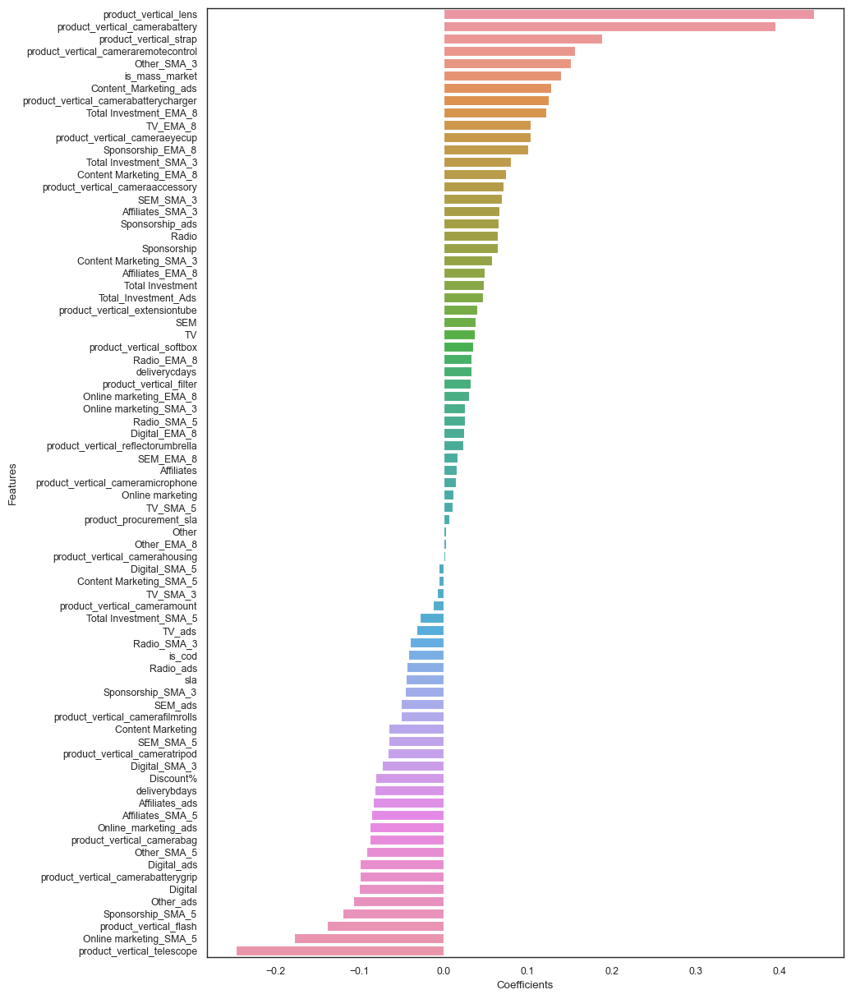

In [261]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_multi_lr_coef_df)
plt.show()

In [262]:
# Top 5 important features affecting GMV - camera accessory(LR)
cameraaccessory_multi_lr_coef_df.head()

,Features,Coefficients
25,product_vertical_lens,0.441
10,product_vertical_camerabattery,0.395
28,product_vertical_strap,0.189
19,product_vertical_cameraremotecontrol,0.156
79,Other_SMA_3,0.152


## Linear regression (multiplicative model) - Gaming accessories

In [263]:
gamingaccessory_multi_model = LinearRegression().fit(X_gamingaccessory_multi_train, y_gamingaccessory_multi_train)
y_gamingaccessory_multi_test_pred = gamingaccessory_multi_model.predict(X_gamingaccessory_multi_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_multi_test, y_gamingaccessory_multi_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_multi_test, y_gamingaccessory_multi_test_pred)))

R2 Score: 0.971559398049072
Mean Squared Error: 0.045569994525927755


## K flod cross validation(Multiplicative) - Gaming accessories

In [264]:
y_gamingaccessory_multi = gamingaccessory_multi.pop('gmv')
X_gamingaccessory_multi = gamingaccessory_multi

In [265]:
gamingaccessory_multi_model_cv = LinearRegression().fit(X_gamingaccessory_multi, y_gamingaccessory_multi)
gamingaccessory_multi_predictions_cv = cross_val_predict(gamingaccessory_multi_model_cv, X_gamingaccessory_multi,
                                                       y_gamingaccessory_multi, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_multi, gamingaccessory_multi_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_multi, gamingaccessory_multi_predictions_cv)))

Cross-Predicted Accuracy: 0.8944747442709128
Mean Squared Error: 0.10552525572908723


In [266]:
gamingaccessory_multi_lr_model_parameters = list(gamingaccessory_multi_model_cv.coef_)
gamingaccessory_multi_lr_model_parameters.insert(0, gamingaccessory_multi_model_cv.intercept_)
gamingaccessory_multi_lr_model_parameters = [round(x, 3) for x in gamingaccessory_multi_lr_model_parameters]
cols = X_gamingaccessory_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_multi_lr_coef = list(zip(cols, gamingaccessory_multi_lr_model_parameters))
gamingaccessory_multi_lr_coef

[('constant', 0.0),
 ('Discount%', -0.061),
 ('deliverybdays', -0.39),
 ('deliverycdays', 0.399),
 ('sla', 0.015),
 ('product_procurement_sla', 0.016),
 ('is_cod', -0.07),
 ('is_mass_market', 0.226),
 ('product_vertical_gamecontrolmount', 0.0),
 ('product_vertical_gamepad', 0.398),
 ('product_vertical_gamingaccessorykit', -0.027),
 ('product_vertical_gamingadapter', 0.044),
 ('product_vertical_gamingchargingstation', 0.054),
 ('product_vertical_gamingheadset', 0.167),
 ('product_vertical_gamingkeyboard', -0.095),
 ('product_vertical_gamingmemorycard', -0.107),
 ('product_vertical_gamingmouse', 0.217),
 ('product_vertical_gamingmousepad', 0.044),
 ('product_vertical_gamingspeaker', -0.002),
 ('product_vertical_joystickgamingwheel', 0.042),
 ('product_vertical_motioncontroller', 0.055),
 ('product_vertical_tvoutcableaccessory', 0.0),
 ('payday_week', -0.0),
 ('holiday_week', -0.0),
 ('Total Investment', 0.042),
 ('Total Investment_SMA_3', 0.115),
 ('Total Investment_SMA_5', -0.13),
 ('To

In [267]:
gamingaccessory_multi_lr_coef_df = pd.DataFrame(gamingaccessory_multi_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_multi_lr_coef_df = gamingaccessory_multi_lr_coef_df.rename(columns=col_rename)
gamingaccessory_multi_lr_coef_df = gamingaccessory_multi_lr_coef_df.iloc[1:,:]
gamingaccessory_multi_lr_coef_df = gamingaccessory_multi_lr_coef_df.loc[gamingaccessory_multi_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_multi_lr_coef_df = gamingaccessory_multi_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_multi_lr_coef_df

,Features,Coefficients
3,deliverycdays,0.399
9,product_vertical_gamepad,0.398
51,Online marketing_SMA_5,0.259
7,is_mass_market,0.226
16,product_vertical_gamingmouse,0.217
50,Online marketing_SMA_3,0.193
38,Digital_ads,0.170
13,product_vertical_gamingheadset,0.167
40,Sponsorship_SMA_3,0.155
48,Content_Marketing_ads,0.141


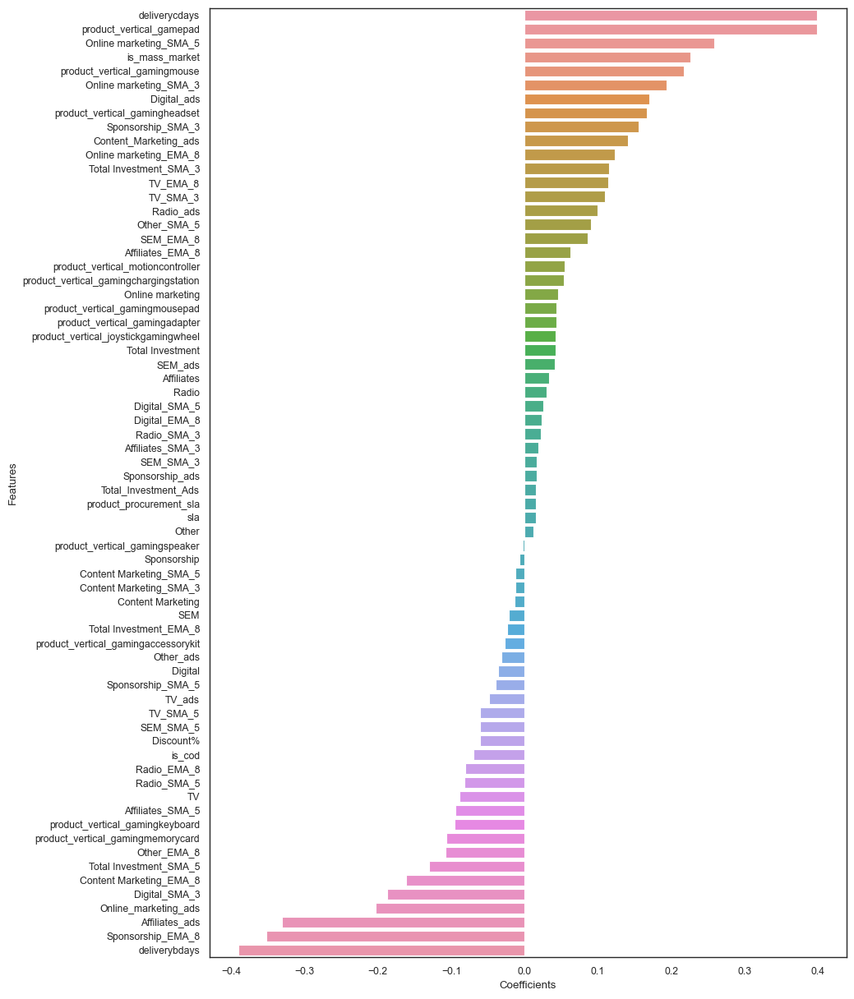

In [268]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_multi_lr_coef_df)
plt.show()

In [269]:
# Top 5 important features affecting GMV - HomeAudio(LR)
gamingaccessory_multi_lr_coef_df.head()

,Features,Coefficients
3,deliverycdays,0.399
9,product_vertical_gamepad,0.398
51,Online marketing_SMA_5,0.259
7,is_mass_market,0.226
16,product_vertical_gamingmouse,0.217


## Linear regression Multiplicative - Home audio

In [270]:
homeaudio_multi_model = LinearRegression().fit(X_homeaudio_multi_train, y_homeaudio_multi_train)
y_homeaudio_multi_test_pred = homeaudio_multi_model.predict(X_homeaudio_multi_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_multi_test, y_homeaudio_multi_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_multi_test, y_homeaudio_multi_test_pred)))

R2 Score: -0.03784147406297711
Mean Squared Error: 0.2019749872655735


In [271]:
## K flod cross validation(Multiplicative) - Gaming accessories

In [272]:
y_homeaudio_multi = homeaudio_multi.pop('gmv')
X_homeaudio_multi = homeaudio_multi

In [273]:
homeaudio_multi_model_cv = LinearRegression().fit(X_homeaudio_multi, y_homeaudio_multi)
homeaudio_multi_predictions_cv = cross_val_predict(homeaudio_multi_model_cv, X_homeaudio_multi,
                                                       y_homeaudio_multi, cv=10)
accuracy = metrics.r2_score(y_homeaudio_multi, homeaudio_multi_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_multi, homeaudio_multi_predictions_cv)))

Cross-Predicted Accuracy: 0.7588769744135848
Mean Squared Error: 0.2411230255864151


In [274]:
homeaudio_multi_lr_model_parameters = list(homeaudio_multi_model_cv.coef_)
homeaudio_multi_lr_model_parameters.insert(0, homeaudio_multi_model_cv.intercept_)
homeaudio_multi_lr_model_parameters = [round(x, 3) for x in homeaudio_multi_lr_model_parameters]
cols = X_homeaudio_test.columns
cols = cols.insert(0, "constant")
homeaudio_multi_lr_coef = list(zip(cols, homeaudio_multi_lr_model_parameters))
homeaudio_multi_lr_coef

[('constant', -0.0),
 ('Discount%', 0.017),
 ('deliverybdays', 0.059),
 ('deliverycdays', -0.09),
 ('sla', -0.006),
 ('product_procurement_sla', -0.019),
 ('is_cod', -0.161),
 ('is_mass_market', 0.27),
 ('product_vertical_djcontroller', 0.015),
 ('product_vertical_dock', -0.018),
 ('product_vertical_dockingstation', 0.051),
 ('product_vertical_fmradio', 0.184),
 ('product_vertical_hifisystem', -0.045),
 ('product_vertical_homeaudiospeaker', 0.698),
 ('product_vertical_karaokeplayer', -0.0),
 ('product_vertical_slingbox', 0.023),
 ('product_vertical_soundmixer', 0.006),
 ('product_vertical_voicerecorder', -0.037),
 ('payday_week', 0.0),
 ('holiday_week', -0.0),
 ('Total Investment', -0.083),
 ('Total Investment_SMA_3', -0.094),
 ('Total Investment_SMA_5', -0.225),
 ('Total Investment_EMA_8', 0.035),
 ('Total_Investment_Ads', -0.037),
 ('TV', 0.196),
 ('TV_SMA_3', 0.117),
 ('TV_SMA_5', -0.131),
 ('TV_EMA_8', 0.262),
 ('TV_ads', -0.057),
 ('Digital', 0.191),
 ('Digital_SMA_3', -0.046),
 (

In [275]:
homeaudio_multi_lr_coef_df = pd.DataFrame(homeaudio_multi_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_multi_lr_coef_df = homeaudio_multi_lr_coef_df.rename(columns=col_rename)
homeaudio_multi_lr_coef_df = homeaudio_multi_lr_coef_df.iloc[1:,:]
homeaudio_multi_lr_coef_df = homeaudio_multi_lr_coef_df.loc[homeaudio_multi_lr_coef_df['Coefficients']!=0.0]
homeaudio_multi_lr_coef_df = homeaudio_multi_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_multi_lr_coef_df

,Features,Coefficients
13,product_vertical_homeaudiospeaker,0.698
7,is_mass_market,0.270
28,TV_EMA_8,0.262
57,SEM_SMA_5,0.241
56,SEM_SMA_3,0.235
54,Affiliates_ads,0.222
25,TV,0.196
30,Digital,0.191
40,Content Marketing,0.188
11,product_vertical_fmradio,0.184


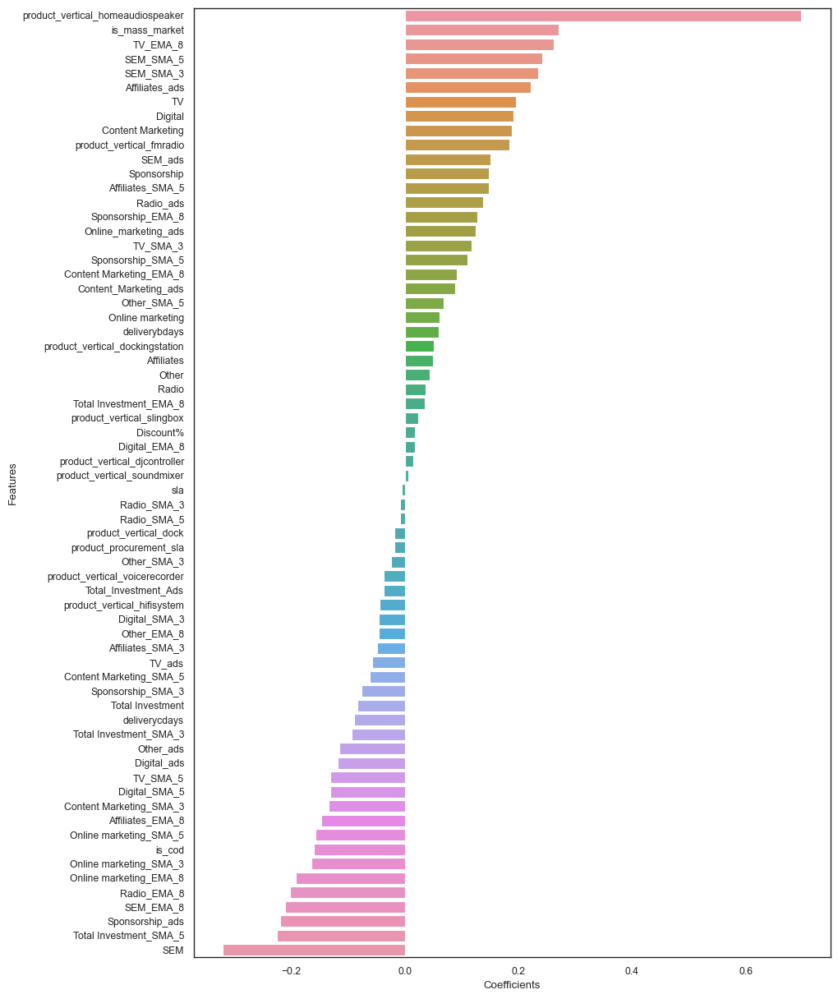

In [276]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=homeaudio_multi_lr_coef_df)
# display the plot
plt.show()

In [277]:
# Top 5 important features affecting GMV - HomeAudio(LR)
homeaudio_multi_lr_coef_df.head()

,Features,Coefficients
13,product_vertical_homeaudiospeaker,0.698
7,is_mass_market,0.270
28,TV_EMA_8,0.262
57,SEM_SMA_5,0.241
56,SEM_SMA_3,0.235


## Distributive Lag Model(Additive)

In [278]:
# Making a copy of dataframe
cameraaccessory_dlag_add = camera_accessory.copy()
gamingaccessory_dlag_add = gaming_accessory.copy()
homeaudio_dlag_add = home_audio.copy()

In [279]:
# removing columns hence week columns will not help in analysis

cameraaccessory_dlag_add = cameraaccessory_dlag_add.drop('Week', axis=1)
gamingaccessory_dlag_add = gamingaccessory_dlag_add.drop('Week', axis=1)
homeaudio_dlag_add = homeaudio_dlag_add.drop('Week', axis=1)

## Creating new lag(Lag of 3 weeks,lag of 2 weeks and lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [280]:
cameraaccessory_dlag_add_col = cameraaccessory_dlag_add.columns
gamingaccessory_dlag_add_col = gamingaccessory_dlag_add.columns
homeaudio_dlag_add_col = homeaudio_dlag_add.columns

In [281]:
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+np.str(n),value=df[i].shift(n))
    return df

In [282]:
# Lag of 3 weeks
cameraaccessory_dlag_add = lag_variables(cameraaccessory_dlag_add,cameraaccessory_dlag_add_col,3)
gamingaccessory_dlag_add = lag_variables(gamingaccessory_dlag_add,gamingaccessory_dlag_add_col,3)
homeaudio_dlag_add = lag_variables(homeaudio_dlag_add,homeaudio_dlag_add_col,3)
# Lag of 2 weeks
cameraaccessory_dlag_add = lag_variables(cameraaccessory_dlag_add,cameraaccessory_dlag_add_col,2)
gamingaccessory_dlag_add = lag_variables(gamingaccessory_dlag_add,gamingaccessory_dlag_add_col,2)
homeaudio_dlag_add = lag_variables(homeaudio_dlag_add,homeaudio_dlag_add_col,2)
# Lag of 1 week
cameraaccessory_dlag_add = lag_variables(cameraaccessory_dlag_add,cameraaccessory_dlag_add_col,1)
gamingaccessory_dlag_add = lag_variables(gamingaccessory_dlag_add,gamingaccessory_dlag_add_col,1)
homeaudio_dlag_add = lag_variables(homeaudio_dlag_add,homeaudio_dlag_add_col,1)

In [283]:
homeaudio_dlag_add.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,...,Radio_ads_lag2,Radio_ads_lag3,Other,Other_lag1,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag1,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag1,Other_SMA_5_lag2,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag1,Other_EMA_8_lag2,Other_EMA_8_lag3,Other_ads,Other_ads_lag1,Other_ads_lag2,Other_ads_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag1,NPS_SMA_3_lag2,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag1,NPS_SMA_5_lag2,NPS_SMA_5_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag1,Stock Index_SMA_3_lag2,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag1,Stock Index_SMA_5_lag2,Stock Index_SMA_5_lag3,Sale,Sale_lag1,Sale_lag2,Sale_lag3
26,4.573783e+06,NaN,NaN,NaN,31.450813,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,7.369201,NaN,NaN,NaN,2.863223,NaN,NaN,NaN,1583,NaN,NaN,NaN,1366,NaN,NaN,NaN,8,NaN,NaN,NaN,33,NaN,NaN,NaN,1,NaN,NaN,NaN,516.0,NaN,NaN,NaN,23,NaN,...,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,NaN,NaN,NaN
27,5.371525e+06,4.573783e+06,NaN,NaN,32.966657,31.450813,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,6.984861,7.369201,NaN,NaN,2.746318,2.863223,NaN,NaN,1868,1583.0,NaN,NaN,1610,1366.0,NaN,NaN,7,8.0,NaN,NaN,50,33.0,NaN,NaN,1,1.0,NaN,NaN,574.0,516.0,NaN,NaN,42,23.0,...,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0.0,0.0,NaN,NaN,0,0.0,NaN,NaN
28,4.679828e+06,5.371525e+06,4.573783e+06,NaN,32.357350,32.966657,31.450813,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,7.071749,6.984861,7.369201,NaN,2.860538,2.746318,2.863223,NaN,1758,1868.0,1583.0,NaN,1569,1610.0,1366.0,NaN,4,7.0,8.0,NaN,56,50.0,33.0,NaN,0,1.0,1.0,NaN,577.0,574.0,516.0,NaN,36,42.0,...,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0,0.0,0.0,NaN
29,3.451151e+06,4.679828e+06,5.371525e+06,4.573783e+06,32.207530,32.357350,32.966657,31.450813,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.200750,7.071749,6.984861,7.369201,2.734834,2.860538,2.746318,2.863223,1244,1758.0,1868.0,1583.0,1072,1569.0,1610.0,1366.0,2,4.0,7.0,8.0,43,56.0,50.0,33.0,0,0.0,1.0,1.0,420.0,577.0,574.0,516.0,20,36.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
30,2.599000e+03,3.451151e+06,4.679828e+06,5.371525e+06,16.130000,32.207530,32.357350,32.966657,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.000000,7.200750,7.071749,6.984861,2.000000,2.734834,2.860538,2.746318,0,1244.0,1758.0,1868.0,0,1072.0,1569.0,1610.0,0,2.0,4.0,7.0,0,43.0,56.0,50.0,0,0.0,0.0,1.0,0.0,420.0,577.0

In [284]:
# Imputing all null values with 0
cameraaccessory_dlag_add.fillna(value=0, inplace=True)
gamingaccessory_dlag_add.fillna(value=0, inplace=True)
homeaudio_dlag_add.fillna(value=0, inplace=True)
homeaudio_dlag_add.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,...,Radio_ads_lag2,Radio_ads_lag3,Other,Other_lag1,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag1,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag1,Other_SMA_5_lag2,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag1,Other_EMA_8_lag2,Other_EMA_8_lag3,Other_ads,Other_ads_lag1,Other_ads_lag2,Other_ads_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag1,NPS_SMA_3_lag2,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag1,NPS_SMA_5_lag2,NPS_SMA_5_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag1,Stock Index_SMA_3_lag2,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag1,Stock Index_SMA_5_lag2,Stock Index_SMA_5_lag3,Sale,Sale_lag1,Sale_lag2,Sale_lag3
26,4.573783e+06,0.000000e+00,0.000000e+00,0.000000e+00,31.450813,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.369201,0.000000,0.000000,0.000000,2.863223,0.000000,0.000000,0.000000,1583,0.0,0.0,0.0,1366,0.0,0.0,0.0,8,0.0,0.0,0.0,33,0.0,0.0,0.0,1,0.0,0.0,0.0,516.0,0.0,0.0,0.0,23,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
27,5.371525e+06,4.573783e+06,0.000000e+00,0.000000e+00,32.966657,31.450813,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,6.984861,7.369201,0.000000,0.000000,2.746318,2.863223,0.000000,0.000000,1868,1583.0,0.0,0.0,1610,1366.0,0.0,0.0,7,8.0,0.0,0.0,50,33.0,0.0,0.0,1,1.0,0.0,0.0,574.0,516.0,0.0,0.0,42,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
28,4.679828e+06,5.371525e+06,4.573783e+06,0.000000e+00,32.357350,32.966657,31.450813,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.071749,6.984861,7.369201,0.000000,2.860538,2.746318,2.863223,0.000000,1758,1868.0,1583.0,0.0,1569,1610.0,1366.0,0.0,4,7.0,8.0,0.0,56,50.0,33.0,0.0,0,1.0,1.0,0.0,577.0,574.0,516.0,0.0,36,42.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
29,3.451151e+06,4.679828e+06,5.371525e+06,4.573783e+06,32.207530,32.357350,32.966657,31.450813,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.200750,7.071749,6.984861,7.369201,2.734834,2.860538,2.746318,2.863223,1244,1758.0,1868.0,1583.0,1072,1569.0,1610.0,1366.0,2,4.0,7.0,8.0,43,56.0,50.0,33.0,0,0.0,1.0,1.0,420.0,577.0,574.0,516.0,20,36.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
30,2.599000e+03,3.451151e+06,4.679828e+06,5.371525e+06,16.130000,32.207530,32.357350,32.966657,0.000000,0.0,0.0,0.0,0.00000,0

## Scaling - Standard scaler

In [285]:
cameraaccessory_dlag_add[cameraaccessory_dlag_add.columns]=scaler.fit_transform(cameraaccessory_dlag_add[cameraaccessory_dlag_add.columns])
gamingaccessory_dlag_add[gamingaccessory_dlag_add.columns]=scaler.fit_transform(gamingaccessory_dlag_add[gamingaccessory_dlag_add.columns])
homeaudio_dlag_add[homeaudio_dlag_add.columns]=scaler.fit_transform(homeaudio_dlag_add[homeaudio_dlag_add.columns])



## Train and Test split

In [286]:
cameraaccessory_dlagadd_train, cameraaccessory_dlagadd_test = train_test_split(cameraaccessory_dlag_add,train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dlagadd_train, gamingaccessory_dlagadd_test = train_test_split(gamingaccessory_dlag_add,train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dlagadd_train, homeaudio_dlagadd_test = train_test_split(homeaudio_dlag_add,train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the data set into X and y 

In [287]:
y_cameraaccessory_dlagadd_train = cameraaccessory_dlagadd_train.pop('gmv')
X_cameraaccessory_dlagadd_train = cameraaccessory_dlagadd_train

y_gamingaccessory_dlagadd_train = gamingaccessory_dlagadd_train.pop('gmv')
X_gamingaccessory_dlagadd_train = gamingaccessory_dlagadd_train

y_homeaudio_dlagadd_train = homeaudio_dlagadd_train.pop('gmv')
X_homeaudio_dlagadd_train = homeaudio_dlagadd_train

In [288]:
y_cameraaccessory_dlagadd_test = cameraaccessory_dlagadd_test.pop('gmv')
X_cameraaccessory_dlagadd_test = cameraaccessory_dlagadd_test

y_gamingaccessory_dlagadd_test = gamingaccessory_dlagadd_test.pop('gmv')
X_gamingaccessory_dlagadd_test = gamingaccessory_dlagadd_test

y_homeaudio_dlagadd_test = homeaudio_dlagadd_test.pop('gmv')
X_homeaudio_dlagadd_test = homeaudio_dlagadd_test

## Linear regression - Camera accessories

In [289]:
cameraaccessory_dlagadd_model = LinearRegression().fit(X_cameraaccessory_dlagadd_train, y_cameraaccessory_dlagadd_train)
y_cameraaccessory_dlagadd_test_pred = cameraaccessory_dlagadd_model.predict(X_cameraaccessory_dlagadd_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dlagadd_test, y_cameraaccessory_dlagadd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlagadd_test, y_cameraaccessory_dlagadd_test_pred)))

R2 Score: 0.7993938948020407
Mean Squared Error: 0.16353453306298626


In [290]:
# Using K flod cross validation - Camera accessories

In [291]:
y_cameraaccessory_dlagadd = cameraaccessory_dlag_add.pop('gmv')
X_cameraaccessory_dlagadd = cameraaccessory_dlag_add

In [292]:
cameraaccessory_dlagadd_model_cv = LinearRegression().fit(X_cameraaccessory_dlagadd, y_cameraaccessory_dlagadd)
cameraaccessory_dlagadd_predictions_cv = cross_val_predict(cameraaccessory_dlagadd_model_cv, X_cameraaccessory_dlagadd, \
                                                         y_cameraaccessory_dlagadd, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dlagadd, cameraaccessory_dlagadd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dlagadd, cameraaccessory_dlagadd_predictions_cv)))

Cross-Predicted Accuracy: 0.8407416071748071
Mean Squared Error: 0.15925839282519286


In [293]:
## Feature Importance

In [294]:
cameraaccessory_dlagadd_model_parameters = list(cameraaccessory_dlagadd_model_cv.coef_)
cameraaccessory_dlagadd_model_parameters.insert(0, cameraaccessory_dlagadd_model_cv.intercept_)
cameraaccessory_dlagadd_model_parameters = [round(x, 3) for x in cameraaccessory_dlagadd_model_parameters]
cols = X_cameraaccessory_dlagadd_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_dlagadd_coef = list(zip(cols, cameraaccessory_dlagadd_model_parameters))
cameraaccessory_dlagadd_coef

[('constant', -0.0),
 ('gmv_lag1', -0.024),
 ('gmv_lag2', -0.024),
 ('gmv_lag3', 0.0),
 ('Discount%', -0.002),
 ('Discount%_lag1', 0.009),
 ('Discount%_lag2', 0.008),
 ('Discount%_lag3', 0.008),
 ('deliverybdays', 0.003),
 ('deliverybdays_lag1', -0.003),
 ('deliverybdays_lag2', -0.006),
 ('deliverybdays_lag3', 0.003),
 ('deliverycdays', 0.002),
 ('deliverycdays_lag1', -0.003),
 ('deliverycdays_lag2', -0.005),
 ('deliverycdays_lag3', 0.003),
 ('sla', -0.019),
 ('sla_lag1', 0.003),
 ('sla_lag2', -0.002),
 ('sla_lag3', 0.01),
 ('product_procurement_sla', 0.026),
 ('product_procurement_sla_lag1', 0.027),
 ('product_procurement_sla_lag2', 0.003),
 ('product_procurement_sla_lag3', -0.034),
 ('is_cod', 0.071),
 ('is_cod_lag1', -0.019),
 ('is_cod_lag2', 0.024),
 ('is_cod_lag3', 0.003),
 ('is_mass_market', 0.082),
 ('is_mass_market_lag1', -0.025),
 ('is_mass_market_lag2', 0.002),
 ('is_mass_market_lag3', -0.003),
 ('product_vertical_cameraaccessory', 0.054),
 ('product_vertical_cameraaccessory_

In [295]:
cameraaccessory_dlagadd_coef_df = pd.DataFrame(cameraaccessory_dlagadd_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_dlagadd_coef_df = cameraaccessory_dlagadd_coef_df.rename(columns=col_rename)
cameraaccessory_dlagadd_coef_df = cameraaccessory_dlagadd_coef_df.iloc[1:,:]
cameraaccessory_dlagadd_coef_df = cameraaccessory_dlagadd_coef_df.loc[cameraaccessory_dlagadd_coef_df['Coefficients']!=0.0]
cameraaccessory_dlagadd_coef_df = cameraaccessory_dlagadd_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_dlagadd_coef_df

,Features,Coefficients
100,product_vertical_lens,0.133
88,product_vertical_filter,0.108
36,product_vertical_camerabag,0.092
76,product_vertical_cameraremotecontrol,0.089
40,product_vertical_camerabattery,0.085
...,...,...
81,product_vertical_cameratripod_lag1,-0.037
101,product_vertical_lens_lag1,-0.043
85,product_vertical_extensiontube_lag1,-0.044
96,product_vertical_flashshoeadapter,-0.045


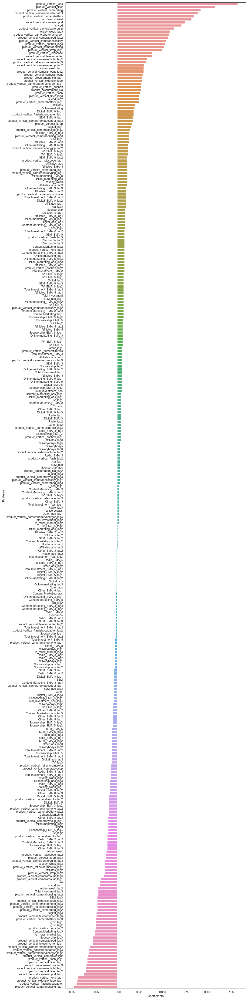

In [296]:
plt.figure(figsize=(10, 55))
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_dlagadd_coef_df)
plt.show()

In [297]:
# Top 5 important features affecting GMV - Home audio (Distributin lag - Additive)
cameraaccessory_dlagadd_coef_df.head()

,Features,Coefficients
100,product_vertical_lens,0.133
88,product_vertical_filter,0.108
36,product_vertical_camerabag,0.092
76,product_vertical_cameraremotecontrol,0.089
40,product_vertical_camerabattery,0.085


## Linear regression - Gaming  accessories

In [298]:
gamingaccessory_dlagadd_model = LinearRegression().fit(X_gamingaccessory_dlagadd_train, y_gamingaccessory_dlagadd_train)
y_gamingaccessory_dlagadd_test_pred = gamingaccessory_dlagadd_model.predict(X_gamingaccessory_dlagadd_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dlagadd_test, y_gamingaccessory_dlagadd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlagadd_test, y_gamingaccessory_dlagadd_test_pred)))

R2 Score: 0.8802134346631246
Mean Squared Error: 0.10482534313850198


# Using K flod cross validation - Gaming accessories

In [299]:
y_gamingaccessory_dlagadd = gamingaccessory_dlag_add.pop('gmv')
X_gamingaccessory_dlagadd = gamingaccessory_dlag_add

In [300]:
gamingaccessory_dlagadd_model_cv = LinearRegression().fit(X_gamingaccessory_dlagadd, y_gamingaccessory_dlagadd)
gamingaccessory_dlagadd_predictions_cv = cross_val_predict(gamingaccessory_dlagadd_model_cv, X_gamingaccessory_dlagadd, \
                                                         y_gamingaccessory_dlagadd, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dlagadd, gamingaccessory_dlagadd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dlagadd, gamingaccessory_dlagadd_predictions_cv)))

Cross-Predicted Accuracy: 0.909955266542602
Mean Squared Error: 0.09004473345739804


## Feature Importance

In [301]:
gamingaccessory_dlagadd_model_parameters = list(gamingaccessory_dlagadd_model_cv.coef_)
gamingaccessory_dlagadd_model_parameters.insert(0, gamingaccessory_dlagadd_model_cv.intercept_)
gamingaccessory_dlagadd_model_parameters = [round(x, 3) for x in gamingaccessory_dlagadd_model_parameters]
cols = X_gamingaccessory_dlagadd_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_dlagadd_coef = list(zip(cols, gamingaccessory_dlagadd_model_parameters))
gamingaccessory_dlagadd_coef

[('constant', 0.0),
 ('gmv_lag1', -0.015),
 ('gmv_lag2', -0.028),
 ('gmv_lag3', -0.008),
 ('Discount%', -0.006),
 ('Discount%_lag1', -0.005),
 ('Discount%_lag2', 0.003),
 ('Discount%_lag3', -0.019),
 ('deliverybdays', 0.037),
 ('deliverybdays_lag1', -0.0),
 ('deliverybdays_lag2', -0.009),
 ('deliverybdays_lag3', 0.003),
 ('deliverycdays', 0.037),
 ('deliverycdays_lag1', 0.0),
 ('deliverycdays_lag2', -0.008),
 ('deliverycdays_lag3', 0.003),
 ('sla', 0.007),
 ('sla_lag1', -0.018),
 ('sla_lag2', 0.047),
 ('sla_lag3', -0.017),
 ('product_procurement_sla', 0.022),
 ('product_procurement_sla_lag1', 0.003),
 ('product_procurement_sla_lag2', -0.002),
 ('product_procurement_sla_lag3', 0.023),
 ('is_cod', 0.055),
 ('is_cod_lag1', 0.002),
 ('is_cod_lag2', 0.006),
 ('is_cod_lag3', -0.003),
 ('is_mass_market', 0.123),
 ('is_mass_market_lag1', -0.005),
 ('is_mass_market_lag2', -0.011),
 ('is_mass_market_lag3', -0.016),
 ('product_vertical_gamecontrolmount', 0.011),
 ('product_vertical_gamecontrolmou

In [302]:
gamingaccessory_dlagadd_coef_df = pd.DataFrame(gamingaccessory_dlagadd_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_dlagadd_coef_df = gamingaccessory_dlagadd_coef_df.rename(columns=col_rename)
gamingaccessory_dlagadd_coef_df = gamingaccessory_dlagadd_coef_df.iloc[1:,:]
gamingaccessory_dlagadd_coef_df = gamingaccessory_dlagadd_coef_df.loc[gamingaccessory_dlagadd_coef_df['Coefficients']!=0.0]
gamingaccessory_dlagadd_coef_df = gamingaccessory_dlagadd_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_dlagadd_coef_df

,Features,Coefficients
36,product_vertical_gamepad,0.175
40,product_vertical_gamingaccessorykit,0.133
28,is_mass_market,0.123
52,product_vertical_gamingheadset,0.112
56,product_vertical_gamingkeyboard,0.098
...,...,...
70,product_vertical_gamingmousepad_lag2,-0.034
88,payday_week,-0.036
55,product_vertical_gamingheadset_lag3,-0.039
73,product_vertical_gamingspeaker_lag1,-0.043


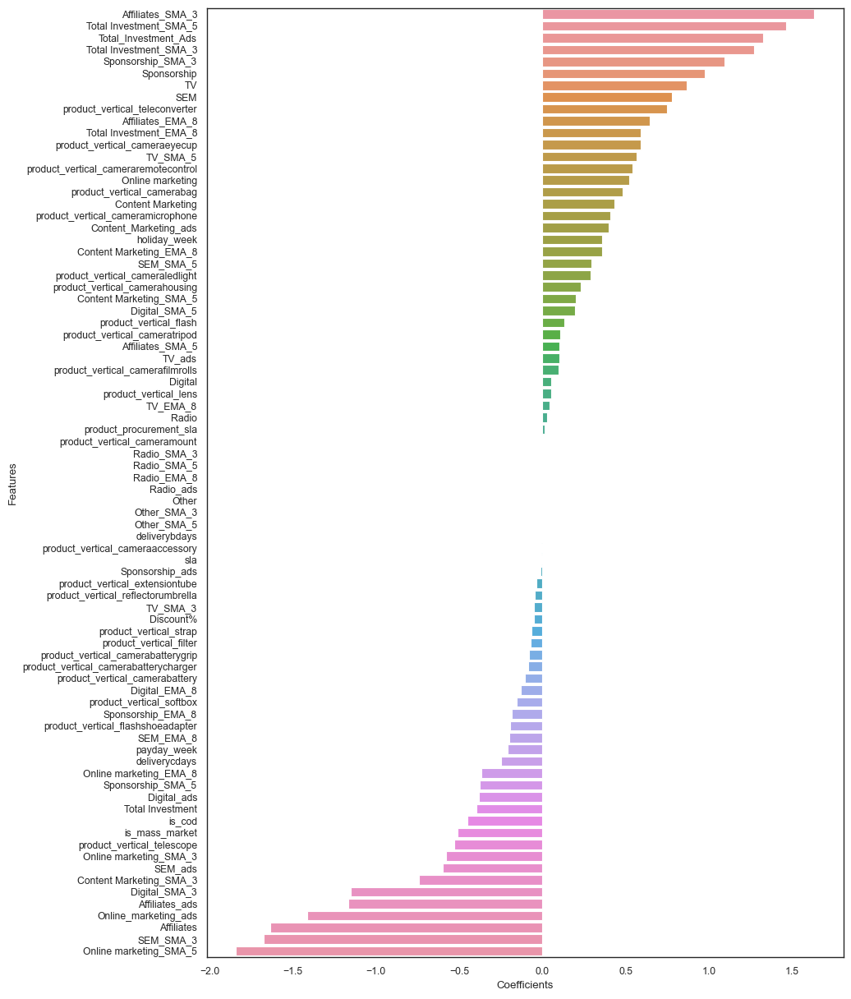

In [303]:
plt.figure(figsize=(10, 15))
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_lr_coef_df)
plt.show()

In [304]:
# Top 5 important features affecting GMV - Gaming accessory (Distributin lag - Additive)
gamingaccessory_dlagadd_coef_df.head()

,Features,Coefficients
36,product_vertical_gamepad,0.175
40,product_vertical_gamingaccessorykit,0.133
28,is_mass_market,0.123
52,product_vertical_gamingheadset,0.112
56,product_vertical_gamingkeyboard,0.098


In [305]:
## Linear regression - Home audio

In [306]:
homeaudio_dlagadd_model = LinearRegression().fit(X_homeaudio_dlagadd_train, y_homeaudio_dlagadd_train)
y_homeaudio_dlagadd_test_pred = homeaudio_dlagadd_model.predict(X_homeaudio_dlagadd_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dlagadd_test, y_homeaudio_dlagadd_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlagadd_test, y_homeaudio_dlagadd_test_pred)))

R2 Score: 0.5170109339590621
Mean Squared Error: 1.148584666483118


In [307]:
# Using K flod cross validation - Home audio

In [308]:
y_homeaudio_dlagadd = homeaudio_dlag_add.pop('gmv')
X_homeaudio_dlagadd = homeaudio_dlag_add

In [309]:
homeaudio_dlagadd_model_cv = LinearRegression().fit(X_homeaudio_dlagadd, y_homeaudio_dlagadd)
homeaudio_dlagadd_predictions_cv = cross_val_predict(homeaudio_dlagadd_model_cv, X_homeaudio_dlagadd, \
                                                         y_homeaudio_dlagadd, cv=10)
accuracy = metrics.r2_score(y_homeaudio_dlagadd, homeaudio_dlagadd_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dlagadd, homeaudio_dlagadd_predictions_cv)))

Cross-Predicted Accuracy: 0.6475138505096577
Mean Squared Error: 0.35248614949034224


## Feature Importance

In [310]:
homeaudio_dlagadd_model_parameters = list(homeaudio_dlagadd_model_cv.coef_)
homeaudio_dlagadd_model_parameters.insert(0, homeaudio_dlagadd_model_cv.intercept_)
homeaudio_dlagadd_model_parameters = [round(x, 3) for x in homeaudio_dlagadd_model_parameters]
cols = X_homeaudio_dlagadd_test.columns
cols = cols.insert(0, "constant")
homeaudio_dlagadd_coef = list(zip(cols, homeaudio_dlagadd_model_parameters))
homeaudio_dlagadd_coef

[('constant', -0.0),
 ('gmv_lag1', -0.031),
 ('gmv_lag2', -0.019),
 ('gmv_lag3', 0.011),
 ('Discount%', 0.105),
 ('Discount%_lag1', -0.03),
 ('Discount%_lag2', -0.001),
 ('Discount%_lag3', 0.032),
 ('deliverybdays', 0.005),
 ('deliverybdays_lag1', -0.003),
 ('deliverybdays_lag2', -0.001),
 ('deliverybdays_lag3', -0.01),
 ('deliverycdays', 0.005),
 ('deliverycdays_lag1', -0.002),
 ('deliverycdays_lag2', -0.001),
 ('deliverycdays_lag3', -0.01),
 ('sla', -0.004),
 ('sla_lag1', -0.026),
 ('sla_lag2', -0.004),
 ('sla_lag3', -0.03),
 ('product_procurement_sla', -0.033),
 ('product_procurement_sla_lag1', 0.001),
 ('product_procurement_sla_lag2', -0.004),
 ('product_procurement_sla_lag3', 0.02),
 ('is_cod', 0.173),
 ('is_cod_lag1', -0.026),
 ('is_cod_lag2', 0.006),
 ('is_cod_lag3', 0.011),
 ('is_mass_market', 0.183),
 ('is_mass_market_lag1', -0.023),
 ('is_mass_market_lag2', -0.004),
 ('is_mass_market_lag3', -0.008),
 ('product_vertical_djcontroller', 0.015),
 ('product_vertical_djcontroller_l

In [311]:
homeaudio_dlagadd_coef_df = pd.DataFrame(homeaudio_dlagadd_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_dlagadd_coef_df = homeaudio_dlagadd_coef_df.rename(columns=col_rename)
homeaudio_dlagadd_coef_df = homeaudio_dlagadd_coef_df.iloc[1:,:]
homeaudio_dlagadd_coef_df = homeaudio_dlagadd_coef_df.loc[homeaudio_dlagadd_coef_df['Coefficients']!=0.0]
homeaudio_dlagadd_coef_df = homeaudio_dlagadd_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_dlagadd_coef_df

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.238
28,is_mass_market,0.183
24,is_cod,0.173
56,product_vertical_karaokeplayer,0.172
4,Discount%,0.105
...,...,...
34,product_vertical_djcontroller_lag2,-0.037
102,TV_lag2,-0.039
53,product_vertical_homeaudiospeaker_lag1,-0.040
76,holiday_week,-0.052


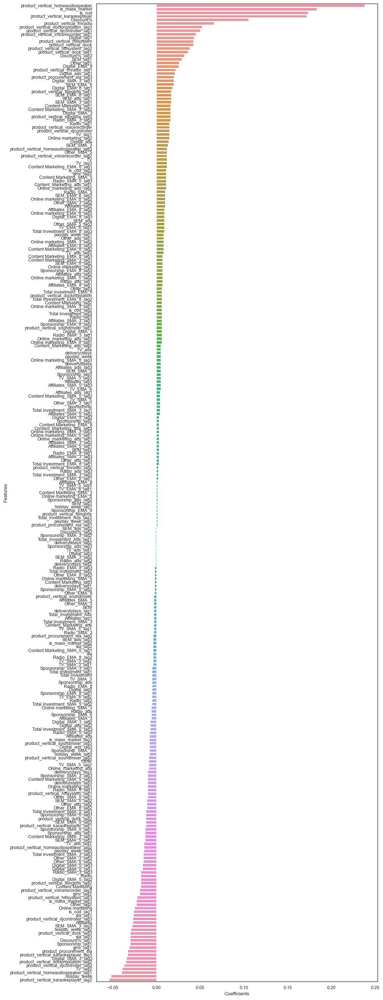

In [312]:
plt.figure(figsize=(10, 35))
sns.barplot(y='Features', x='Coefficients',data=homeaudio_dlagadd_coef_df)
plt.show()

In [313]:
# Top 5 important features affecting GMV - Home audio (Distributin lag - Additive)
homeaudio_dlagadd_coef_df.head()

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.238
28,is_mass_market,0.183
24,is_cod,0.173
56,product_vertical_karaokeplayer,0.172
4,Discount%,0.105


## Distributive Lag Model(Multiplicative) - Linear regression Model

In [314]:
# making a copy of original data frame
cameraaccessory_dlag_multi = camera_accessory.copy()
gamingaccessory_dlag_multi = gaming_accessory.copy()
homeaudio_dlag_multi = home_audio.copy()

In [315]:
# removing columns
cameraaccessory_dlag_multi = cameraaccessory_dlag_multi.drop('Week', axis=1)
gamingaccessory_dlag_multi = gamingaccessory_dlag_multi.drop('Week', axis=1)
homeaudio_dlag_multi = homeaudio_dlag_multi.drop('Week', axis=1)


## Creating new lag(Lag of 3 weeks,lag of 2 weeks and lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

In [316]:
cameraaccessory_dlag_multi_col = cameraaccessory_dlag_multi.columns
gamingaccessory_dlag_multi_col = gamingaccessory_dlag_multi.columns
homeaudio_dlag_multi_col = homeaudio_dlag_multi.columns

In [317]:
# Lag of 3 weeks
cameraaccessory_dlag_multi = lag_variables(cameraaccessory_dlag_multi,cameraaccessory_dlag_multi_col,3)
gamingaccessory_dlag_multi = lag_variables(gamingaccessory_dlag_multi,gamingaccessory_dlag_multi_col,3)
homeaudio_dlag_multi = lag_variables(homeaudio_dlag_multi,homeaudio_dlag_multi_col,3)
# Lag of 2 weeks
cameraaccessory_dlag_multi = lag_variables(cameraaccessory_dlag_multi,cameraaccessory_dlag_multi_col,2)
gamingaccessory_dlag_multi= lag_variables(gamingaccessory_dlag_multi,gamingaccessory_dlag_multi_col,2)
homeaudio_dlag_multi = lag_variables(homeaudio_dlag_multi,homeaudio_dlag_multi_col,2)
# Lag of 1 week
cameraaccessory_dlag_multi = lag_variables(cameraaccessory_dlag_multi,cameraaccessory_dlag_multi_col,1)
gamingaccessory_dlag_multi = lag_variables(gamingaccessory_dlag_multi,gamingaccessory_dlag_multi_col,1)
homeaudio_dlag_multi = lag_variables(homeaudio_dlag_multi,homeaudio_dlag_multi_col,1)

In [318]:
# Imputing all null values with 0
cameraaccessory_dlag_multi.fillna(value=0, inplace=True)
gamingaccessory_dlag_multi.fillna(value=0, inplace=True)
homeaudio_dlag_multi.fillna(value=0, inplace=True)
homeaudio_dlag_multi.head(10)

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,...,Radio_ads_lag2,Radio_ads_lag3,Other,Other_lag1,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag1,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag1,Other_SMA_5_lag2,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag1,Other_EMA_8_lag2,Other_EMA_8_lag3,Other_ads,Other_ads_lag1,Other_ads_lag2,Other_ads_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag1,NPS_SMA_3_lag2,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag1,NPS_SMA_5_lag2,NPS_SMA_5_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag1,Stock Index_SMA_3_lag2,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag1,Stock Index_SMA_5_lag2,Stock Index_SMA_5_lag3,Sale,Sale_lag1,Sale_lag2,Sale_lag3
26,4.573783e+06,0.000000e+00,0.000000e+00,0.000000e+00,31.450813,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.369201,0.000000,0.000000,0.000000,2.863223,0.000000,0.000000,0.000000,1583,0.0,0.0,0.0,1366,0.0,0.0,0.0,8,0.0,0.0,0.0,33,0.0,0.0,0.0,1,0.0,0.0,0.0,516.0,0.0,0.0,0.0,23,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
27,5.371525e+06,4.573783e+06,0.000000e+00,0.000000e+00,32.966657,31.450813,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,6.984861,7.369201,0.000000,0.000000,2.746318,2.863223,0.000000,0.000000,1868,1583.0,0.0,0.0,1610,1366.0,0.0,0.0,7,8.0,0.0,0.0,50,33.0,0.0,0.0,1,1.0,0.0,0.0,574.0,516.0,0.0,0.0,42,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
28,4.679828e+06,5.371525e+06,4.573783e+06,0.000000e+00,32.357350,32.966657,31.450813,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.071749,6.984861,7.369201,0.000000,2.860538,2.746318,2.863223,0.000000,1758,1868.0,1583.0,0.0,1569,1610.0,1366.0,0.0,4,7.0,8.0,0.0,56,50.0,33.0,0.0,0,1.0,1.0,0.0,577.0,574.0,516.0,0.0,36,42.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
29,3.451151e+06,4.679828e+06,5.371525e+06,4.573783e+06,32.207530,32.357350,32.966657,31.450813,0.000000,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,7.200750,7.071749,6.984861,7.369201,2.734834,2.860538,2.746318,2.863223,1244,1758.0,1868.0,1583.0,1072,1569.0,1610.0,1366.0,2,4.0,7.0,8.0,43,56.0,50.0,33.0,0,0.0,1.0,1.0,420.0,577.0,574.0,516.0,20,36.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0
30,2.599000e+03,3.451151e+06,4.679828e+06,5.371525e+06,16.130000,32.207530,32.357350,32.966657,0.000000,0.0,0.0,0.0,0.00000,0

## Taking log on Both dependent and independent variable

In [319]:

cameraaccessory_dlag_multi = cameraaccessory_dlag_multi.applymap(lambda x: np.log(x))
cameraaccessory_dlag_multi = cameraaccessory_dlag_multi.replace([np.inf, -np.inf], 0)
cameraaccessory_dlag_multi = cameraaccessory_dlag_multi.replace(np.nan, 0)

gamingaccessory_dlag_multi = gamingaccessory_dlag_multi.applymap(lambda x: np.log(x))
gamingaccessory_dlag_multi = gamingaccessory_dlag_multi.replace([np.inf, -np.inf], 0)
gamingaccessory_dlag_multi = gamingaccessory_dlag_multi.replace(np.nan, 0)

homeaudio_dlag_multi = homeaudio_dlag_multi.applymap(lambda x: np.log(x))
homeaudio_dlag_multi = homeaudio_dlag_multi.replace([np.inf, -np.inf], 0)
homeaudio_dlag_multi = homeaudio_dlag_multi.replace(np.nan, 0)


homeaudio_dlag_multi.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,Discount%,Discount%_lag1,Discount%_lag2,Discount%_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,is_cod,is_cod_lag1,is_cod_lag2,is_cod_lag3,is_mass_market,is_mass_market_lag1,is_mass_market_lag2,is_mass_market_lag3,product_vertical_djcontroller,product_vertical_djcontroller_lag1,product_vertical_djcontroller_lag2,product_vertical_djcontroller_lag3,product_vertical_dock,product_vertical_dock_lag1,product_vertical_dock_lag2,product_vertical_dock_lag3,product_vertical_dockingstation,product_vertical_dockingstation_lag1,product_vertical_dockingstation_lag2,product_vertical_dockingstation_lag3,product_vertical_fmradio,product_vertical_fmradio_lag1,product_vertical_fmradio_lag2,product_vertical_fmradio_lag3,product_vertical_hifisystem,product_vertical_hifisystem_lag1,...,Radio_ads_lag2,Radio_ads_lag3,Other,Other_lag1,Other_lag2,Other_lag3,Other_SMA_3,Other_SMA_3_lag1,Other_SMA_3_lag2,Other_SMA_3_lag3,Other_SMA_5,Other_SMA_5_lag1,Other_SMA_5_lag2,Other_SMA_5_lag3,Other_EMA_8,Other_EMA_8_lag1,Other_EMA_8_lag2,Other_EMA_8_lag3,Other_ads,Other_ads_lag1,Other_ads_lag2,Other_ads_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,NPS_SMA_3,NPS_SMA_3_lag1,NPS_SMA_3_lag2,NPS_SMA_3_lag3,NPS_SMA_5,NPS_SMA_5_lag1,NPS_SMA_5_lag2,NPS_SMA_5_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Stock Index_SMA_3,Stock Index_SMA_3_lag1,Stock Index_SMA_3_lag2,Stock Index_SMA_3_lag3,Stock Index_SMA_5,Stock Index_SMA_5_lag1,Stock Index_SMA_5_lag2,Stock Index_SMA_5_lag3,Sale,Sale_lag1,Sale_lag2,Sale_lag3
26,15.335851,0.000000,0.000000,0.000000,3.448425,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.997309,0.000000,0.000000,0.000000,1.051948,0.000000,0.000000,0.000000,7.367077,0.000000,0.000000,0.000000,7.219642,0.000000,0.000000,0.000000,2.079442,0.000000,0.000000,0.000000,3.496508,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,6.246107,0.000000,0.000000,0.000000,3.135494,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27,15.496622,15.335851,0.000000,0.000000,3.495497,3.448425,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.943745,1.997309,0.000000,0.000000,1.010261,1.051948,0.000000,0.000000,7.532624,7.367077,0.000000,0.000000,7.383989,7.219642,0.000000,0.000000,1.945910,2.079442,0.000000,0.000000,3.912023,3.496508,0.000000,0.000000,0.0,0.0,0.0,0.0,6.352629,6.246107,0.000000,0.000000,3.737670,3.135494,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
28,15.358772,15.496622,15.335851,0.000000,3.476841,3.495497,3.448425,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.956108,1.943745,1.997309,0.000000,1.051010,1.010261,1.051948,0.000000,7.471932,7.532624,7.367077,0.000000,7.358194,7.383989,7.219642,0.000000,1.386294,1.945910,2.079442,0.000000,4.025352,3.912023,3.496508,0.000000,0.0,0.0,0.0,0.0,6.357842,6.352629,6.246107,0.000000,3.583519,3.737670,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29,15.054218,15.358772,15.496622,15.335851,3.472200,3.476841,3.495497,3.448425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.974185,1.956108,1.943745,1.997309,1.006071,1.051010,1.010261,1.051948,7.126087,7.471932,7.532624,7.367077,6.977281,7.358194,7.383989,7.219642,0.693147,1.386294,1.945910,2.079442,3.761200,4.025352,3.912023,3.496508,0.0,0.0,0.0,0.0,6.040255,6.357842,6.352629,6.246107,2.995732,3.583519,...,0.0,0.0,0.0,0.0,0.0,0.0,0.

## Scaling - Standard scaler

In [320]:
cameraaccessory_dlag_multi[cameraaccessory_dlag_multi.columns]=scaler.fit_transform(cameraaccessory_dlag_multi[cameraaccessory_dlag_multi.columns])
gamingaccessory_dlag_multi[gamingaccessory_dlag_multi.columns]=scaler.fit_transform(gamingaccessory_dlag_multi[gamingaccessory_dlag_multi.columns])
homeaudio_dlag_multi[homeaudio_dlag_multi.columns]=scaler.fit_transform(homeaudio_dlag_multi[homeaudio_dlag_multi.columns])



## Train and Test split

In [321]:
cameraaccessory_dm_train, cameraaccessory_dm_test = train_test_split(cameraaccessory_dlag_multi, train_size = 0.7, test_size = 0.3, random_state = 100)

gamingaccessory_dm_train, gamingaccessory_dm_test = train_test_split(gamingaccessory_dlag_multi,train_size = 0.7, test_size = 0.3, random_state = 100)

homeaudio_dm_train, homeaudio_dm_test = train_test_split(homeaudio_dlag_multi,train_size = 0.7, test_size = 0.3, random_state = 100)

## Dividing the 3 datasets into X and Y

In [322]:
y_cameraaccessory_dm_train = cameraaccessory_dm_train.pop('gmv')
X_cameraaccessory_dm_train = cameraaccessory_dm_train

y_gamingaccessory_dm_train = gamingaccessory_dm_train.pop('gmv')
X_gamingaccessory_dm_train = gamingaccessory_dm_train

y_homeaudio_dm_train = homeaudio_dm_train.pop('gmv')
X_homeaudio_dm_train = homeaudio_dm_train

In [323]:
y_cameraaccessory_dm_test = cameraaccessory_dm_test.pop('gmv')
X_cameraaccessory_dm_test = cameraaccessory_dm_test

y_gamingaccessory_dm_test = gamingaccessory_dm_test.pop('gmv')
X_gamingaccessory_dm_test = gamingaccessory_dm_test

y_homeaudio_dm_test = homeaudio_dm_test.pop('gmv')
X_homeaudio_dm_test = homeaudio_dm_test

## Multiplicative Linear regression - Camera accessory

In [324]:
cameraaccessory_dm_model = LinearRegression().fit(X_cameraaccessory_dm_train, y_cameraaccessory_dm_train)
y_cameraaccessory_dm_test_pred = cameraaccessory_dm_model.predict(X_cameraaccessory_dm_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_dm_test, y_cameraaccessory_dm_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dm_test, y_cameraaccessory_dm_test_pred)))

R2 Score: 0.7949572232530306
Mean Squared Error: 0.4350364786798704


## K Flod cross validation -  Camera accessory

In [325]:
y_cameraaccessory_dm = cameraaccessory_dlag_multi.pop('gmv')
X_cameraaccessory_dm = cameraaccessory_dlag_multi

In [326]:
cameraaccessory_dm_model_cv = LinearRegression().fit(X_cameraaccessory_dm, y_cameraaccessory_dm)
cameraaccessory_dm_predictions_cv = cross_val_predict(cameraaccessory_dm_model_cv, X_cameraaccessory_dm, \
                                                         y_cameraaccessory_dm, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_dm, cameraaccessory_dm_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_dm, cameraaccessory_dm_predictions_cv)))

Cross-Predicted Accuracy: 0.8598371758999303
Mean Squared Error: 0.14016282410006978


In [327]:
## Feature Importance

In [328]:

cameraaccessory_dm_model_parameters = list(cameraaccessory_dm_model_cv.coef_)
cameraaccessory_dm_model_parameters.insert(0, cameraaccessory_dm_model_cv.intercept_)
cameraaccessory_dm_model_parameters = [round(x, 3) for x in cameraaccessory_dm_model_parameters]
cols = X_cameraaccessory_dm_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_dm_coef = list(zip(cols, cameraaccessory_dm_model_parameters))
cameraaccessory_dm_coef

[('constant', 0.0),
 ('gmv_lag1', -0.004),
 ('gmv_lag2', -0.002),
 ('gmv_lag3', -0.0),
 ('Discount%', 0.001),
 ('Discount%_lag1', 0.002),
 ('Discount%_lag2', 0.023),
 ('Discount%_lag3', -0.009),
 ('deliverybdays', -0.002),
 ('deliverybdays_lag1', -0.007),
 ('deliverybdays_lag2', 0.01),
 ('deliverybdays_lag3', -0.008),
 ('deliverycdays', -0.001),
 ('deliverycdays_lag1', -0.007),
 ('deliverycdays_lag2', 0.011),
 ('deliverycdays_lag3', -0.008),
 ('sla', -0.039),
 ('sla_lag1', -0.015),
 ('sla_lag2', 0.008),
 ('sla_lag3', 0.017),
 ('product_procurement_sla', 0.058),
 ('product_procurement_sla_lag1', -0.031),
 ('product_procurement_sla_lag2', -0.027),
 ('product_procurement_sla_lag3', 0.029),
 ('is_cod', 0.062),
 ('is_cod_lag1', 0.008),
 ('is_cod_lag2', -0.003),
 ('is_cod_lag3', 0.001),
 ('is_mass_market', 0.071),
 ('is_mass_market_lag1', 0.004),
 ('is_mass_market_lag2', -0.008),
 ('is_mass_market_lag3', -0.005),
 ('product_vertical_cameraaccessory', 0.065),
 ('product_vertical_cameraaccesso

In [329]:
cameraaccessory_dm_coef_df = pd.DataFrame(cameraaccessory_dm_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_dm_coef_df = cameraaccessory_dm_coef_df.rename(columns=col_rename)
cameraaccessory_dm_coef_df = cameraaccessory_dm_coef_df.iloc[1:,:]
cameraaccessory_dm_coef_df = cameraaccessory_dm_coef_df.loc[cameraaccessory_dm_coef_df['Coefficients']!=0.0]
cameraaccessory_dm_coef_df = cameraaccessory_dm_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_dm_coef_df

,Features,Coefficients
100,product_vertical_lens,0.071
28,is_mass_market,0.071
40,product_vertical_camerabattery,0.070
80,product_vertical_cameratripod,0.068
36,product_vertical_camerabag,0.066
...,...,...
53,product_vertical_cameraeyecup_lag1,-0.020
140,Total Investment_SMA_5,-0.021
22,product_procurement_sla_lag2,-0.027
21,product_procurement_sla_lag1,-0.031


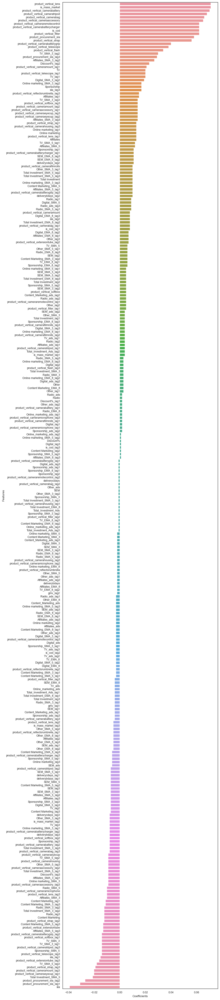

In [330]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 45))
sns.barplot(y='Features', x='Coefficients',data=cameraaccessory_dm_coef_df)
plt.tight_layout()
plt.show()

In [331]:
# Top 5 important features affecting GMV - camera accessory (Distributin lag - Multiplicative)
cameraaccessory_dm_coef_df.head()

,Features,Coefficients
100,product_vertical_lens,0.071
28,is_mass_market,0.071
40,product_vertical_camerabattery,0.070
80,product_vertical_cameratripod,0.068
36,product_vertical_camerabag,0.066


## Multipliicative Linear regression - Gaming accessory

In [332]:
gamingaccessory_dm_model = LinearRegression().fit(X_gamingaccessory_dm_train, y_gamingaccessory_dm_train)
y_gamingaccessory_dm_test_pred = gamingaccessory_dm_model.predict(X_gamingaccessory_dm_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_dm_test, y_gamingaccessory_dm_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dm_test, y_gamingaccessory_dm_test_pred)))

R2 Score: 0.9457616240097981
Mean Squared Error: 0.08690542138430579


In [333]:
## K Flod cross validation -  Gaming Accessory

In [334]:
y_gamingaccessory_dm = gamingaccessory_dlag_multi.pop('gmv')
X_gamingaccessory_dm = gamingaccessory_dlag_multi

In [335]:
gamingaccessory_dm_model_cv = LinearRegression().fit(X_gamingaccessory_dm, y_gamingaccessory_dm)
gamingaccessory_dm_predictions_cv = cross_val_predict(gamingaccessory_dm_model_cv, X_gamingaccessory_dm, \
                                                         y_gamingaccessory_dm, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_dm, gamingaccessory_dm_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_dm, gamingaccessory_dm_predictions_cv)))

Cross-Predicted Accuracy: 0.9278702551769711
Mean Squared Error: 0.07212974482302886


In [336]:
## Feature Importance

In [337]:
gamingaccessory_dm_model_parameters = list(gamingaccessory_dm_model_cv.coef_)
gamingaccessory_dm_model_parameters.insert(0, gamingaccessory_dm_model_cv.intercept_)
gamingaccessory_dm_model_parameters = [round(x, 3) for x in gamingaccessory_dm_model_parameters]
cols = X_gamingaccessory_dm_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_dm_coef = list(zip(cols, gamingaccessory_dm_model_parameters))
gamingaccessory_dm_coef

[('constant', 0.0),
 ('gmv_lag1', -0.007),
 ('gmv_lag2', 0.003),
 ('gmv_lag3', 0.001),
 ('Discount%', -0.085),
 ('Discount%_lag1', -0.005),
 ('Discount%_lag2', -0.011),
 ('Discount%_lag3', 0.008),
 ('deliverybdays', 0.001),
 ('deliverybdays_lag1', -0.0),
 ('deliverybdays_lag2', 0.002),
 ('deliverybdays_lag3', 0.018),
 ('deliverycdays', 0.0),
 ('deliverycdays_lag1', -0.001),
 ('deliverycdays_lag2', 0.0),
 ('deliverycdays_lag3', 0.02),
 ('sla', 0.025),
 ('sla_lag1', 0.034),
 ('sla_lag2', -0.056),
 ('sla_lag3', -0.001),
 ('product_procurement_sla', 0.019),
 ('product_procurement_sla_lag1', -0.009),
 ('product_procurement_sla_lag2', 0.005),
 ('product_procurement_sla_lag3', 0.029),
 ('is_cod', 0.069),
 ('is_cod_lag1', -0.003),
 ('is_cod_lag2', 0.011),
 ('is_cod_lag3', 0.005),
 ('is_mass_market', 0.093),
 ('is_mass_market_lag1', 0.001),
 ('is_mass_market_lag2', 0.004),
 ('is_mass_market_lag3', -0.007),
 ('product_vertical_gamecontrolmount', -0.0),
 ('product_vertical_gamecontrolmount_lag1',

In [338]:
gamingaccessory_dm_coef_df = pd.DataFrame(gamingaccessory_dm_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_dm_coef_df = gamingaccessory_dm_coef_df.rename(columns=col_rename)
gamingaccessory_dm_coef_df = gamingaccessory_dm_coef_df.iloc[1:,:]
gamingaccessory_dm_coef_df = gamingaccessory_dm_coef_df.loc[gamingaccessory_dm_coef_df['Coefficients']!=0.0]
gamingaccessory_dm_coef_df = gamingaccessory_dm_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_dm_coef_df

,Features,Coefficients
36,product_vertical_gamepad,0.100
64,product_vertical_gamingmouse,0.099
28,is_mass_market,0.093
56,product_vertical_gamingkeyboard,0.084
84,product_vertical_tvoutcableaccessory,0.073
...,...,...
102,Total Investment_SMA_3_lag2,-0.020
72,product_vertical_gamingspeaker,-0.023
136,Digital,-0.027
18,sla_lag2,-0.056


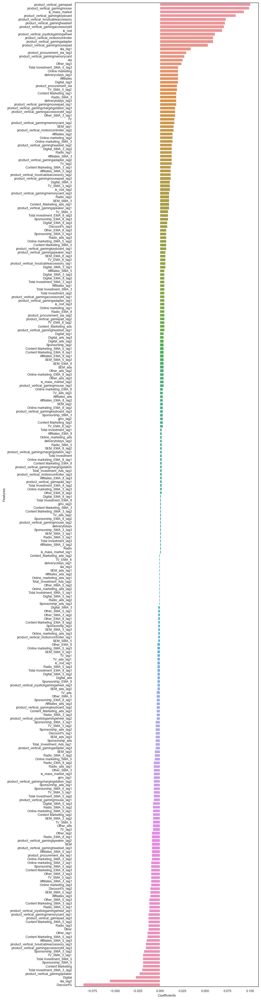

In [339]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 38))
sns.barplot(y='Features', x='Coefficients',data=gamingaccessory_dm_coef_df)
plt.tight_layout()
plt.show()

In [340]:
# Top 5 important features affecting GMV - Gaming accessory (Distributin lag - Multiplicative)
gamingaccessory_dm_coef_df.head()

,Features,Coefficients
36,product_vertical_gamepad,0.100
64,product_vertical_gamingmouse,0.099
28,is_mass_market,0.093
56,product_vertical_gamingkeyboard,0.084
84,product_vertical_tvoutcableaccessory,0.073


In [341]:
## Multipliicative Linear regression - Home Audio

In [342]:
homeaudio_dm_model = LinearRegression().fit(X_homeaudio_dm_train, y_homeaudio_dm_train)
y_homeaudio_dm_test_pred = homeaudio_dm_model.predict(X_homeaudio_dm_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_dm_test, y_homeaudio_dm_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dm_test, y_homeaudio_dm_test_pred)))

R2 Score: 0.22362750848613577
Mean Squared Error: 0.15109034279867203


In [343]:
## K Flod cross validation -  Home audio

In [344]:
y_homeaudio_dm = homeaudio_dlag_multi.pop('gmv')
X_homeaudio_dm = homeaudio_dlag_multi

In [345]:
homeaudio_dm_model_cv = LinearRegression().fit(X_homeaudio_dm, y_homeaudio_dm)
homeaudio_dm_predictions_cv = cross_val_predict(homeaudio_dm_model_cv, X_homeaudio_dm, \
                                                         y_homeaudio_dm, cv=10)
accuracy = metrics.r2_score(y_homeaudio_dm, homeaudio_dm_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_dm, homeaudio_dm_predictions_cv)))

Cross-Predicted Accuracy: 0.7130696802328578
Mean Squared Error: 0.2869303197671423


In [346]:
## Feature Importance

In [347]:
homeaudio_dm_model_parameters = list(homeaudio_dm_model_cv.coef_)
homeaudio_dm_model_parameters.insert(0, homeaudio_dm_model_cv.intercept_)
homeaudio_dm_model_parameters = [round(x, 3) for x in homeaudio_dm_model_parameters]
cols = X_homeaudio_dm_test.columns
cols = cols.insert(0, "constant")
homeaudio_dm_coef = list(zip(cols, homeaudio_dm_model_parameters))
homeaudio_dm_coef

[('constant', -0.0),
 ('gmv_lag1', -0.002),
 ('gmv_lag2', -0.006),
 ('gmv_lag3', 0.003),
 ('Discount%', 0.113),
 ('Discount%_lag1', 0.009),
 ('Discount%_lag2', -0.015),
 ('Discount%_lag3', 0.009),
 ('deliverybdays', 0.002),
 ('deliverybdays_lag1', 0.016),
 ('deliverybdays_lag2', 0.002),
 ('deliverybdays_lag3', -0.014),
 ('deliverycdays', 0.002),
 ('deliverycdays_lag1', 0.016),
 ('deliverycdays_lag2', 0.001),
 ('deliverycdays_lag3', -0.012),
 ('sla', -0.053),
 ('sla_lag1', 0.001),
 ('sla_lag2', 0.002),
 ('sla_lag3', -0.008),
 ('product_procurement_sla', 0.027),
 ('product_procurement_sla_lag1', 0.027),
 ('product_procurement_sla_lag2', -0.007),
 ('product_procurement_sla_lag3', 0.013),
 ('is_cod', 0.129),
 ('is_cod_lag1', -0.007),
 ('is_cod_lag2', 0.005),
 ('is_cod_lag3', 0.006),
 ('is_mass_market', 0.158),
 ('is_mass_market_lag1', -0.01),
 ('is_mass_market_lag2', -0.004),
 ('is_mass_market_lag3', 0.002),
 ('product_vertical_djcontroller', 0.02),
 ('product_vertical_djcontroller_lag1', 

In [348]:
homeaudio_dm_coef_df = pd.DataFrame(homeaudio_dm_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_dm_coef_df = homeaudio_dm_coef_df.rename(columns=col_rename)
homeaudio_dm_coef_df = homeaudio_dm_coef_df.iloc[1:,:]
homeaudio_dm_coef_df = homeaudio_dm_coef_df.loc[homeaudio_dm_coef_df['Coefficients']!=0.0]
homeaudio_dm_coef_df = homeaudio_dm_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_dm_coef_df

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.164
28,is_mass_market,0.158
44,product_vertical_fmradio,0.141
24,is_cod,0.129
68,product_vertical_voicerecorder,0.116
...,...,...
86,Total Investment_SMA_3_lag2,-0.028
63,product_vertical_slingbox_lag3,-0.028
251,Radio_SMA_5_lag3,-0.029
88,Total Investment_SMA_5,-0.032


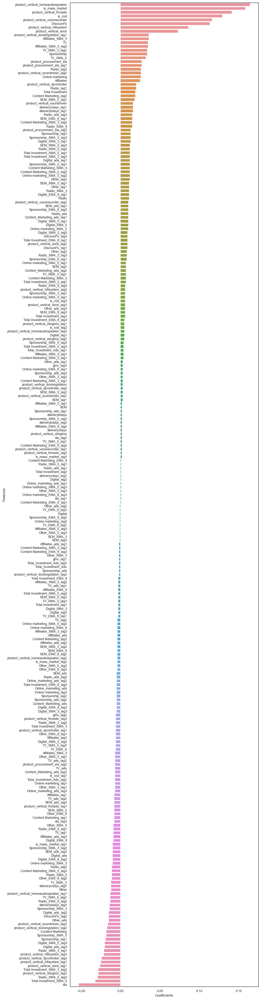

In [349]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 38))
sns.barplot(y='Features', x='Coefficients',data=homeaudio_dm_coef_df)
plt.tight_layout()
plt.show()

In [350]:
# Top 5 important features affecting GMV - Home audio (Distributin lag - Multiplicative)
homeaudio_dm_coef_df.head()

,Features,Coefficients
52,product_vertical_homeaudiospeaker,0.164
28,is_mass_market,0.158
44,product_vertical_fmradio,0.141
24,is_cod,0.129
68,product_vertical_voicerecorder,0.116


# Model selection

##### The criteria of choosing the model is based on the accuracy parameters "R2 score & MSE score".
##### Also we tried to choose models with cross validation because even though the ones without, sometimes gives us good scores, they are not very dependable & generalisable, owing to limited dataset.

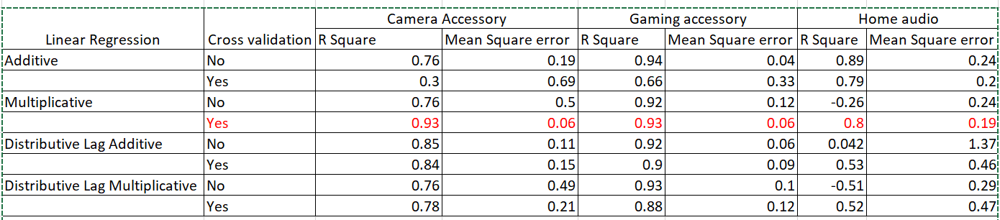

Based on the above analysis Linear regression with multiplicative model perform best on training data among all the 3 sub categories - camera accessory,gamingaccessory and home audio

# Model Evalution

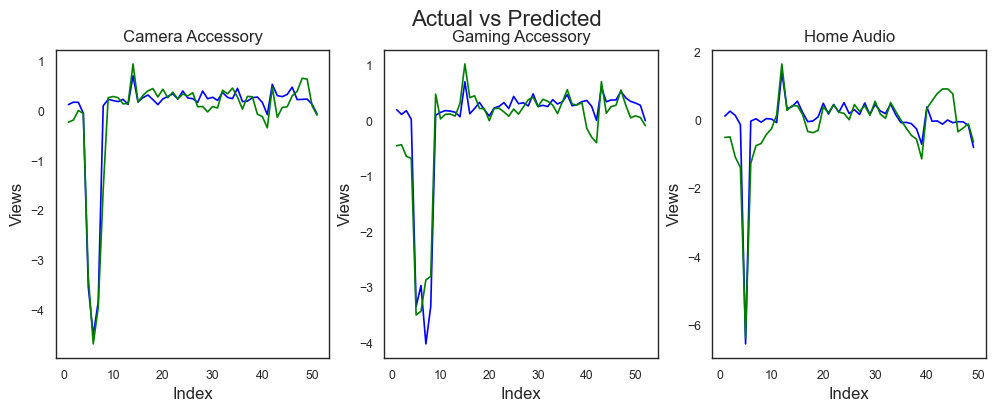

In [351]:
## Actual Vs Predicted
plt.figure(figsize=(12, 4))
plt.suptitle('Actual vs Predicted', fontsize=16) 
# subplot 1
plt.subplot(1, 3, 1)
c = [i for i in range(1,52,1)]
plt.plot(c,y_cameraaccessory_multi, color="blue")
plt.plot(c,cameraaccessory_multi_predictions_cv, color="green")
plt.title('Camera Accessory', fontsize=12)               
plt.xlabel('Index', fontsize=12)                               
plt.ylabel('Views', fontsize=12)                               

# subplot 2
plt.subplot(1, 3, 2)
d = [i for i in range(1,53,1)]
plt.plot(d,y_gamingaccessory_multi, color="blue")
plt.plot(d,gamingaccessory_multi_predictions_cv, color="green")
plt.title('Gaming Accessory', fontsize=12)
plt.xlabel('Index', fontsize=12)                               
plt.ylabel('Views', fontsize=12)                               

# subplot 3
plt.subplot(1, 3, 3)
e = [i for i in range(1,50,1)]
plt.plot(e,y_homeaudio_multi, color="blue")
plt.plot(e,homeaudio_multi_predictions_cv, color="green")
plt.title('Home Audio', fontsize=12)
plt.xlabel('Index', fontsize=12)                              
plt.ylabel('Views', fontsize=12)                            

# display the plot
plt.show()

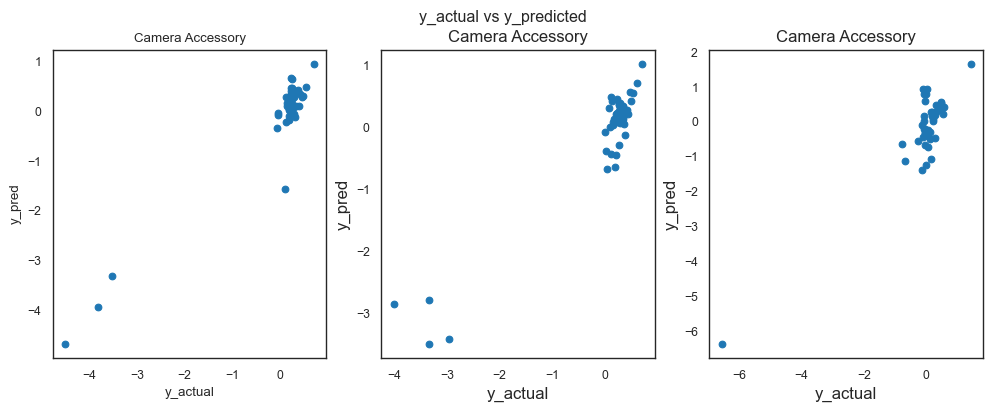

In [352]:

plt.figure(figsize=(12, 4))
plt.suptitle('y_actual vs y_predicted')     
# subplot 1
plt.subplot(1, 3, 1)
plt.scatter(y_cameraaccessory_multi,cameraaccessory_multi_predictions_cv)      
plt.title('Camera Accessory')              
plt.xlabel('y_actual' )                         
plt.ylabel('y_pred')                          

# subplot 2
plt.subplot(1, 3, 2)
plt.scatter(y_gamingaccessory_multi,gamingaccessory_multi_predictions_cv)
plt.title('Camera Accessory', fontsize=12)               
plt.xlabel('y_actual', fontsize=12)                          
plt.ylabel('y_pred', fontsize=12)                          

# subplot 3
plt.subplot(1, 3, 3)
plt.scatter(y_homeaudio_multi,homeaudio_multi_predictions_cv)
plt.title('Camera Accessory', fontsize=12)              
plt.xlabel('y_actual', fontsize=12)                          
plt.ylabel('y_pred', fontsize=12)                          

# display the plot
plt.show()

 Drawing a scatter plot with actual and predicted price values from the dataset to check the spread

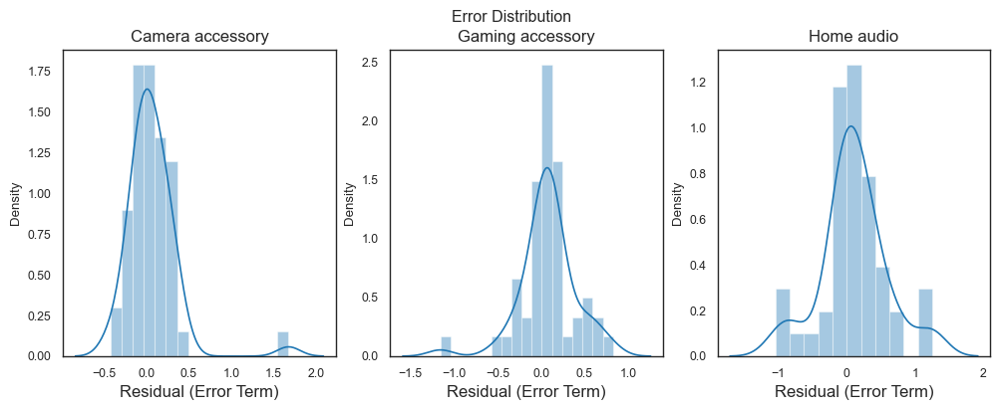

In [353]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 4))
plt.suptitle('Error Distribution') 

plt.subplot(1, 3, 1)
residual1= y_cameraaccessory_multi - cameraaccessory_multi_predictions_cv
sns.distplot(residual1)
plt.xlabel('Residual (Error Term)', fontsize=12)
plt.title('Camera accessory', fontsize=12)

plt.subplot(1, 3, 2)
residual1= y_gamingaccessory_multi - gamingaccessory_multi_predictions_cv
sns.distplot(residual1)
plt.xlabel('Residual (Error Term)', fontsize=12)
plt.title('Gaming accessory', fontsize=12)

plt.subplot(1, 3, 3)
residual3 = y_homeaudio_multi - homeaudio_multi_predictions_cv
sns.distplot(residual3)
plt.xlabel('Residual (Error Term)', fontsize=12)
plt.title('Home audio',fontsize=12)
plt.show()

Plotting the distribution of the error terms. The error terms follow a normal distrbution with mean at 0 barring a few outlier values.

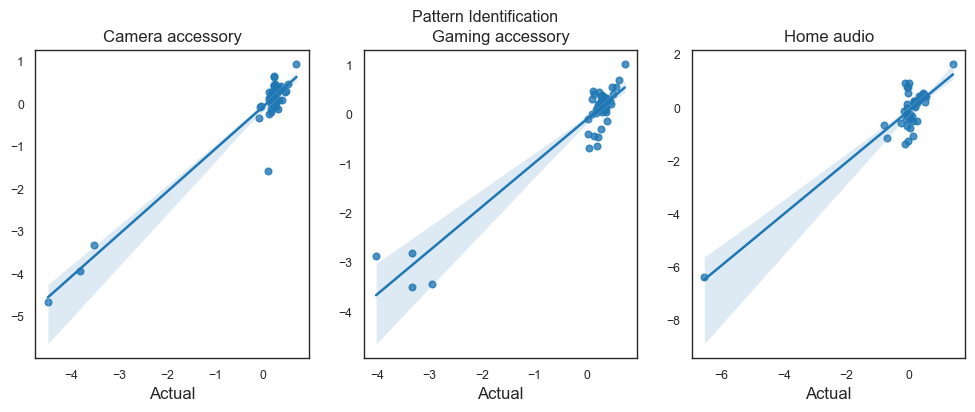

In [354]:
plt.figure(figsize=(12, 4))
plt.suptitle('Pattern Identification')

plt.subplot(1, 3, 1)
sns.regplot(y=cameraaccessory_multi_predictions_cv, x=y_cameraaccessory_multi)
plt.xlabel('Actual', fontsize=12)
plt.title('Camera accessory', fontsize=12)

plt.subplot(1, 3, 2)
sns.regplot(y=gamingaccessory_multi_predictions_cv, x=y_gamingaccessory_multi)
plt.xlabel('Actual', fontsize=12)
plt.title('Gaming accessory', fontsize=12)

plt.subplot(1, 3, 3)
sns.regplot(y=homeaudio_multi_predictions_cv, x=y_homeaudio_multi)
plt.xlabel('Actual', fontsize=12)
plt.title('Home audio',fontsize=12)
plt.show()

 To check  the best fit line by plotting with residual and predicted values

# Model Equation

### Considering the top 5 KPIs for  3 product subcategories, we can see that the equation of our best fitted lines as follows:

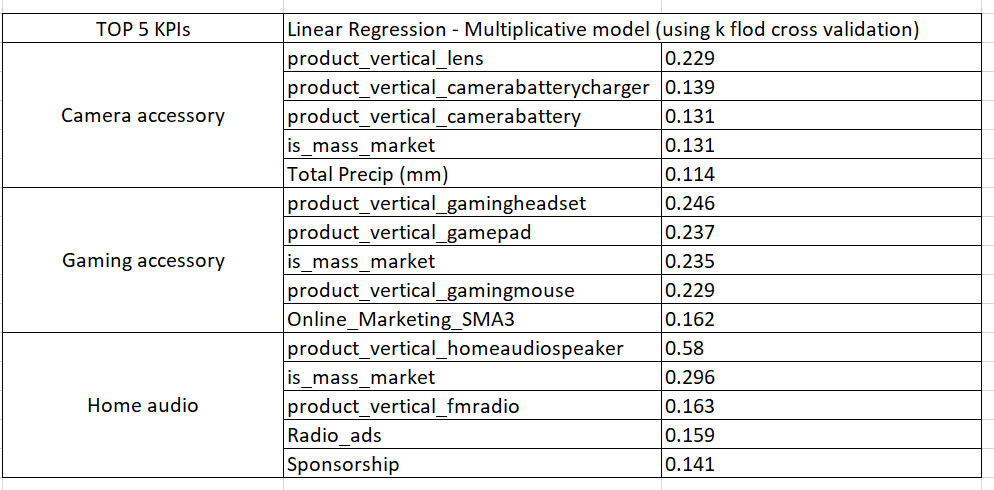

Camera accessory:

Revenue = 0.0 + (0.229 × product_vertical_lens) + (0.139 × product_vertical_camerabatterycharger) + (0.131 × is_mass_market) + (0.131 × product_vertical_camerabattery) + (0.114× Total Percip)

Gaming Accessory:

Revenue = 0.0 + (0.246 × product_vertical_gamingheadset) + (0.237 × product_vertical_gamepad) + (0.235× is_mass_market ) + (0.229 ×  product_vertical_gamingmouse) + (0.162 × Online marketing_SMA_3)


Home Audio:

Revenue = 0.0 + (0.580 × product_vertical_homeaudiospeaker) + (0.296× is_mass_market) + (0.163 × product_vertical_fmradio) + (0.159 × Radio_Ads) + (0.141 × Sponsorship)


# Final conclusion

In [355]:
cameraaccessory = cameraaccessory_multi_lr_coef_df.head().append(cameraaccessory_multi_lr_coef_df.tail())
gamingaccessory = gamingaccessory_multi_lr_coef_df.head().append(gamingaccessory_multi_lr_coef_df.tail())
homeaudio = homeaudio_multi_lr_coef_df.head().append(homeaudio_multi_lr_coef_df.tail())


In [356]:
## Plotting top 5 and least 5 KPIs that affecting the revenue GMV

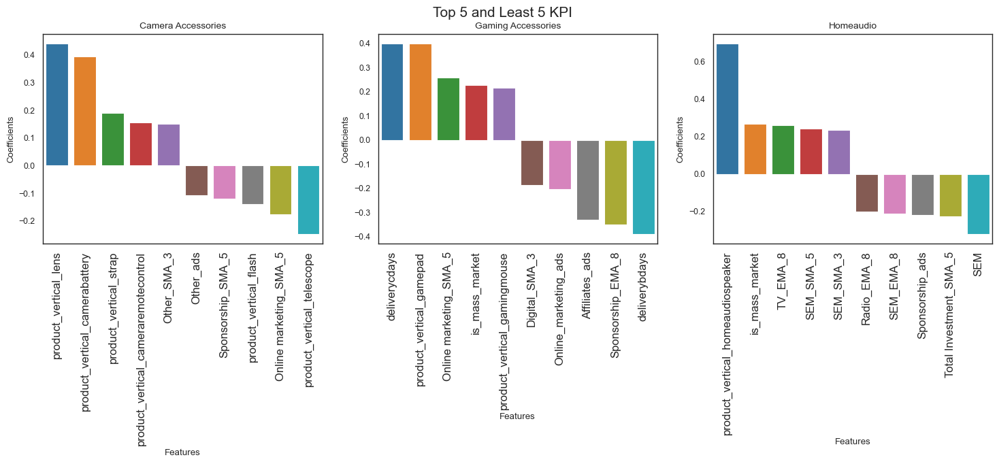

In [357]:

plt.figure(figsize=(18,4))
plt.suptitle('Top 5 and Least 5 KPI', fontsize=15)

# subplot 1
plt.subplot(1, 3, 1)
sns.barplot(x='Features', y='Coefficients',data=cameraaccessory)
plt.title('Camera Accessories', fontsize=10)
plt.xticks(rotation='vertical', fontsize=12)

# subplot 1
plt.subplot(1, 3, 2)
sns.barplot(x='Features', y='Coefficients',data=gamingaccessory)
plt.title('Gaming Accessories', fontsize=10)
plt.xticks(rotation='vertical', fontsize=12)

# subplot 1
plt.subplot(1, 3, 3)
sns.barplot(x='Features', y='Coefficients',data=homeaudio)
plt.title('Homeaudio', fontsize=10)
plt.xticks(rotation='vertical', fontsize=12)

plt.show()

# Recommendation

## Camera Accessory :

 - Lens,Camera Batteries & Camera Battery Chargers are fetching the highest revenue and need to promote more on this product.
 - Mass-market products are the better contributors to the increase the revenue when comparison to the Luxury products.
 - Higher percentage of Discounts in general given for this sub category works adversely towards bringing down the revenue
 - spends on Adverstising on the Content Marketing have adversely affecting the GMV.

## Gaming Accessory :

- Gamingheadset,Gamepad & GamingMouse fetched the highest revenue and need to promote more on this product.
- Mass-market products are the better contributors to the increase the revenue when comparison to the Luxury products.
- Gaming Memory card works adversely towards bringing down the revenue.
- Advertisement spends on Online Marketing has a positive impact on revenue on the otherhand Adverstising on the sponsorship and Radio have adversely affecting the GMV.

## Home Audio :

- homeaudiospeaker,fmradio  fetched the highest revenue and need to promote more on this product.
- Mass-market products are the better contributors to the increase the revenue when comparison to the Luxury products.
- Radio Ads(carry over effect of Radio Advertisement) and sponrship spends  helps to boost the revenue to a significant extent
- COD payments in general for this sub category are bad in bringing down the revenue.

- Most of the sales take place when Discount% is between 50-60%. However, that doesnt necessarily help in boosting the revenue. EDA shows that an average discount% between 10-20% is the most profitable for the company specially among luxury items.
- In general most of the Home Audio items sold are luxury items and hence, customers prefer to use COD instead of paying upfront.